# Version: Direct translation from MatLab

## Functions

In [15]:
import numpy
import matplotlib.pyplot as plt

### Integrator: Runge-Kutta 4th

In [16]:
def runge45_1D(h,t,p,f,flag_pert,pert_params):
    A2 = 0.2;
    A3 = 0.3;
    A4 = 0.6;
    A5 = 1.0;
    A6 = 0.875;
    B21 = 0.2;
    B31 = 3 / 40;
    B32 = 9 / 40;
    B41 = 0.3;
    B42 = -0.9;
    B43 = 1.2;
    B51 = -11 / 54;
    B52 = 2.5;
    B53 = -70 / 27;
    B54 = 35 / 27;
    B61 = 1631 / 55296;
    B62 = 175 / 512;
    B63 = 575 / 13824;
    B64 = 44275 / 110592;
    B65 = 253 / 4096;
    C1 = 37 / 378;
    C3 = 250 / 621;
    C4 = 125 / 594;
    C6 = 512 / 1771;
    DC1 = C1 - 2825 / 27648; 
    DC3 = C3 - 18575 / 48384; 
    DC4 = C4 - 13525 / 55296; 
    DC5 = -277 / 14336;
    DC6 = C6 - 0.25;
    
    ak1 = f(t,p,flag_pert,pert_params);
    p_temp = p + B21 * h * ak1;
        
    ak2 = f(t + A2 * h,p_temp,flag_pert,pert_params);
    p_temp = p + h * (B31 * ak1 + B32 * ak2);
    
    ak3 = f(t + A3 * h,p_temp,flag_pert,pert_params);
    p_temp = p + h * (B41 * ak1 + B42 * ak2 + B43 * ak3);
    
    ak4 = f(t + A4 * h,p_temp,flag_pert,pert_params);
    p_temp = p + h * (B51 * ak1 + B52 * ak2 + B53 * ak3 + B54 * ak4);
    
    ak5 = f(t + A5 * h,p_temp,flag_pert,pert_params);
    p_temp = p + h * (B61 * ak1 + B62 * ak2 + B63 * ak3 + B64 * ak4 + B65 * ak5);
    
    ak6 = f(t + A6 * h,p_temp,flag_pert,pert_params);
    
    p_new = p + h * (C1 * ak1 + C3 * ak3 + C4 * ak4 + C6 * ak6);
    p_err = h * (DC1 * ak1 + DC3 * ak3 + DC4 * ak4 + DC5 * ak5 + DC6 * ak6);
    
    return p_new, p_err

### Vector fields

CHANGES: Redefined `pert` to correct form.

In [17]:
def forcing(t,p,flag_pert,pert_params):
    x = p[:,0];

    pert = numpy.zeros((p.shape[0],1));   
    
    A = pert_params[0];  # Amplitude of perturbation
    freq = pert_params[1];  # Frequency of perturbation
    
    if flag_pert == 1:
        pert = A * numpy.sin(freq*t);
    elif flag_pert == 2:
        pert = A * numpy.sech(t) * numpy.sin(freq*t);
    else:
        pert = pert;

    return pert

In [18]:
def HamCenter_1D(t,p,flag_pert,pert_params):
   
    vel = numpy.zeros((p.shape[0],2));
       
    pert = forcing(t,p,flag_pert,pert_params);
    
    # Hamiltonian Model Parameter
    omega = 1;
    
    x = p[:,0];
    y = p[:,1];
       
    vel[:,0] = omega * y;
    vel[:,1] = - omega * x + pert;

    return vel

In [19]:
def HamSaddle_1D(t,p,flag_pert,pert_params):
   
    vel = numpy.zeros((p.shape[0],2));
    
    pert = forcing(t,p,flag_pert,pert_params);
       
    # Hamiltonian Model Parameter
    lamda = 1;
    
    x = p[:,0];
    y = p[:,1];
    
    vel[:,0] = lamda * y;
    vel[:,1] = lamda * x + pert;
    
    return vel

In [20]:

def HamDuffing_1D(t,p,flag_pert,pert_params):
    
    vel = numpy.zeros((p.shape[0],2));
      
    pert = forcing(t,p,flag_pert,pert_params);
    
    x = p[:,0];
    y = p[:,1];
       
    vel[:,0] = y;
    vel[:,1] = x - x**3 + pert;

    return vel

### LD accumulator

In [21]:
def accum_LDs(LD_val,pts,pts_new,flag_m,p,dt):
    if flag_m: # p-norm LDs
        accum = LD_val + ((abs(pts_new[:,0] - pts[:,0]))**p + (abs(pts_new[:,1] - pts[:,1]))**p) * dt ** (1 - p);
    else:  # arclength LDs
        accum = LD_val + sqrt((pts_new[:,0] - pts_new[:,0])**2 + (pts_new[:,1] - pts[:,1])**2);
    return accum

### LD calculator

In [22]:

def LDs_1D(t0,tau,flag_m,p_val,dt,xi,xf,nx,yi,yf,ny,vf_name,flag_pert,pert_params):
    # @author: V. J. García-Garrido                                                                           
    # Date: 24-04-2020
    
    # %%%%%%%%%%%%%%5%%%%%%%%%%%%%%%%%%%%
    #                                  FUNCTION PARAMETERS                                                 
    #%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
    # t0                  = Initial Time
    # flag_m          = Flag that determines the type of LD calculated
    #                         0 (arclength) // 1 (p-norm)
    # p_val            = Exponent for the p-norm LD
    # dt                  = Integration Time Step
    # tau                = Integration time (evolve trajectories in [t0 - tau , t0 + tau])
    # xi , xf            = Initial and final points of the mesh in the x-direction 
    # nx                 = Mumber of gridpoints in the x-direction
    # yi , yf            = Initial and final points of the mesh in the y-direction 
    # ny                 = Mumber of gridpoints in the y-direction
    # vf_name       = Name of the vector field function for the dynamical system
    # flag_pert      = Flag that indicates if the vector field is perturbed
    #                         0 (No Perturbation) // 1 (Time Periodic) // 2 (Aperiodic)
    # pert_params = Array of parameters for the perturbation
    #%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

    # Function defining the vector field of the Dynamical System
    f = vf_name; 
    
    # Create mesh for the computaion of Lagrangian Descriptors
    mesh = numpy.zeros((nx * ny,2)); 
    xp = numpy.linspace(xi,xf,nx);
    yp = numpy.linspace(yi,yf,ny);    
    [X,Y] = numpy.meshgrid(xp,yp);  
    mesh[:,0] = X.T.reshape(-1)
    mesh[:,1] = Y.T.reshape(-1)
    
    # Forward integration
    ld_fw = numpy.zeros(nx * ny);  # Array to store forward LDs
    pts = mesh;
    
    for t_fwd in numpy.arange(t0, t0 + tau - dt, dt):      
        pts_new = runge45_1D(dt,t_fwd,pts,f,flag_pert,pert_params)[0];         
        ld_fw = accum_LDs(ld_fw,pts,pts_new,flag_m,p_val,dt);
        pts = pts_new;
        
    # Backward integration
    ld_bw = numpy.zeros(nx * ny);  # Array to store backward LDs
    pts = mesh;
    
    for t_bw in numpy.arange(t0, t0 - tau + dt, -dt):
        pts_new = runge45_1D(-dt,t_bw,pts,f,flag_pert,pert_params)[0];          
        ld_bw = accum_LDs(ld_bw,pts,pts_new,flag_m,p_val,dt);
        pts = pts_new;
    
    return ld_fw, ld_bw

### LD Plotter

In [27]:
def draw_LDs_1D(t0,tau,flag_m,p,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw):
    
    xp = numpy.linspace(xi,xf,nx);
    yp = numpy.linspace(yi,yf,ny);
    X,Y = numpy.meshgrid(xp,yp)

    if flag_m:
        str_meth = ['p-norm (p=',str(p),')--'];
    else:
        str_meth = ['arclength --'];
    
    if flag_type == 1:
        LD = ld_fw.reshape(nx,ny).T;
        string_title = ['Forward LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    elif flag_type == 2:
        LD = ld_bw.reshape(nx,ny).T;
        string_title = ['Backward LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    else:
        LD = (ld_fw + ld_bw).reshape(nx,ny).T;
        string_title = ['LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    
    LD = LD / LD.max();  # Scale LD output
    
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    scatter = plt.scatter(X,Y,c=LD,cmap='bone')

    # Customise appearance
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('q', fontsize=18)
    ax.set_ylabel('p', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter)

    plt.show()

## Benchmark examples

In [28]:
%matplotlib inline

# Simulation Parameters (LD method setup)
t0 = 0;
tau = 12;
flag_m = 1;
p_val = 1/2;
dt = 0.1;

# Mesh to compute LDs
xi = -1.6;
xf = 1.6;
nx = 300;
yi = -1;
yf = 1;
ny = 300;

# Time Dependent Perurbation
flag_pert = 1;
pert_params = [0.15, 0.5];

### Hamilton Centre

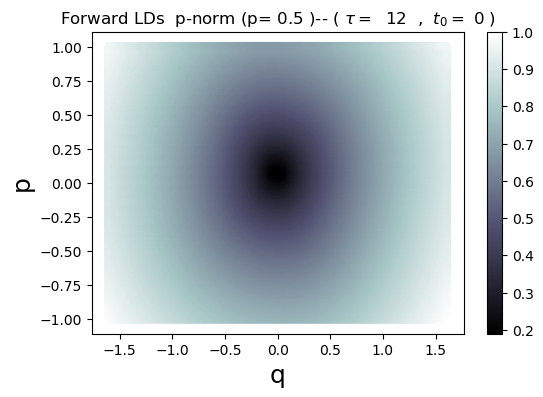

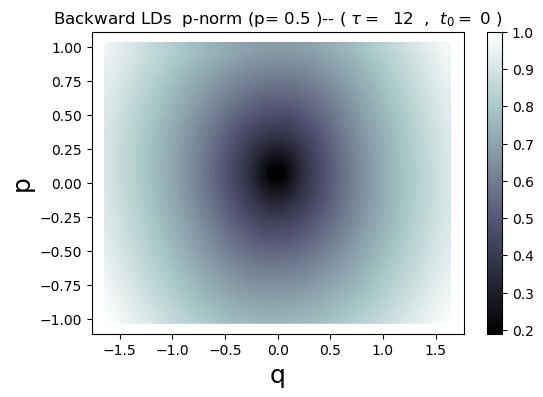

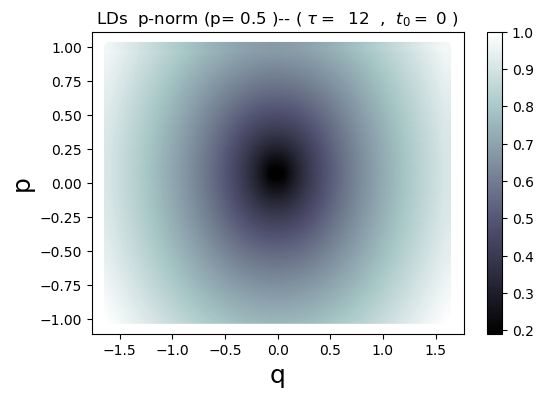

In [29]:
# vector Field for the Dynamical System 
ds = HamCenter_1D;
# ds = HamDuffing_1D;
# ds = HamSaddle_1D;

# Computation of LDs
ld_fw,ld_bw = LDs_1D(t0,tau,flag_m,p_val,dt,xi,xf,nx,yi,yf,ny,ds,flag_pert,pert_params);

# Draw Forward LDs
flag_type = 1;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw Bacward LDs
flag_type = 2;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw LDs
flag_type = 3;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

### Hamilton Saddle

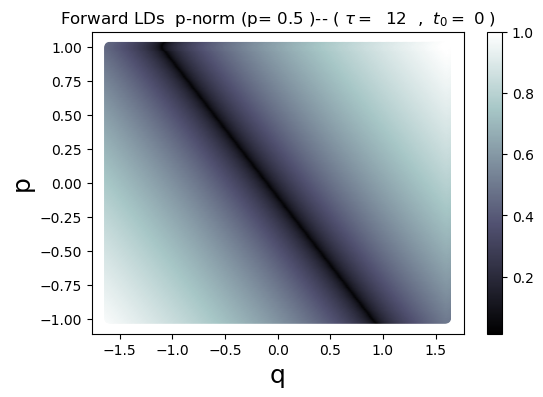

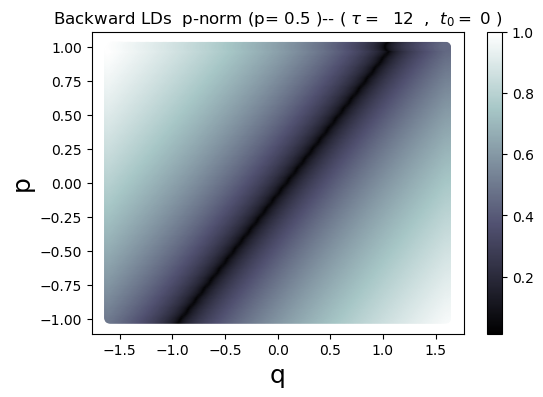

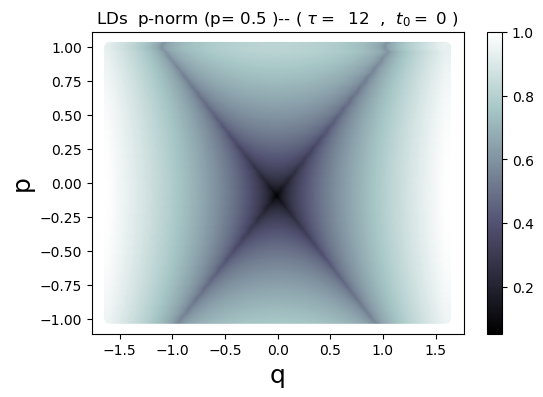

In [30]:
# vector Field for the Dynamical System 
# ds = HamCenter_1D;
# ds = HamDuffing_1D;
ds = HamSaddle_1D;

# Computation of LDs
ld_fw,ld_bw = LDs_1D(t0,tau,flag_m,p_val,dt,xi,xf,nx,yi,yf,ny,ds,flag_pert,pert_params);

# Draw Forward LDs
flag_type = 1;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw Bacward LDs
flag_type = 2;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw LDs
flag_type = 3;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

### Hamilton Duffing

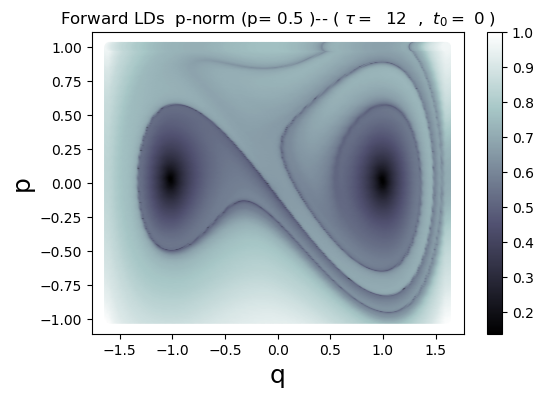

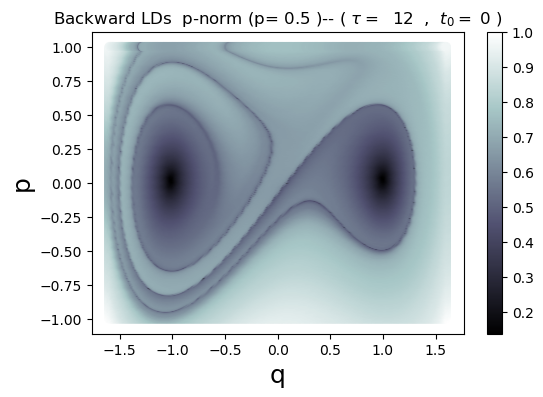

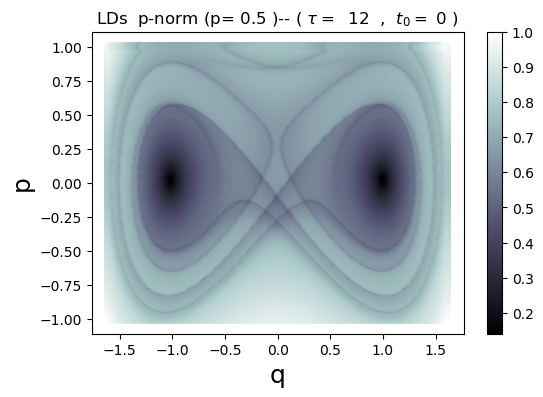

In [31]:
# vector Field for the Dynamical System 
# ds = HamCenter_1D;
ds = HamDuffing_1D;
# ds = HamSaddle_1D;

# Computation of LDs
ld_fw,ld_bw = LDs_1D(t0,tau,flag_m,p_val,dt,xi,xf,nx,yi,yf,ny,ds,flag_pert,pert_params);

# Draw Forward LDs
flag_type = 1;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw Bacward LDs
flag_type = 2;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# % Draw LDs
flag_type = 3;
draw_LDs_1D(t0,tau,flag_m,p_val,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw);

# Version: Incorporation of Python-builtin integrator

## Functions

DOCUMENTATION

https://docs.scipy.org/doc/scipy/reference/tutorial/integrate.html

In [1]:
import numpy
import matplotlib.pyplot as plt

Redefined accumulator function

### Vector fields

CHANGES: input and outputs were redefined for every vector field function

In [2]:
def HamCenter_1D(t, points_flat):
    # Hamiltonian Model Parameter
    omega = 1;
    x, y = points_flat.reshape((nx*ny,2)).T
    v = numpy.array([ omega * y, - omega * x]).T
    return v.reshape(-1)

In [3]:
def HamSaddle_1D(t,points_flat):
    # Hamiltonian Model Parameter
    lamda = 1;
    x, y = points_flat.reshape((nx*ny,2)).T
    v = numpy.array([ lamda * y, lamda * x]).T
    return v.reshape(-1)

In [4]:
def forcing(t, points_flat, flag_pert, pert_params):
    x, y = points_flat.reshape((nx*ny,2)).T
    pert = numpy.zeros((len(x),1))
    # Perturbation parameters
    A = pert_params[0];  # Amplitude
    freq = pert_params[1];  # Frequency
    
    if flag_pert == 1:
        pert = A * numpy.sin(freq*t)
    elif flag_pert == 2:
        pert = A * numpy.sech(t) * numpy.sin(freq*t)
    else:
        pert = pert
    return pert

In [5]:
def HamDuffing_1D(t,points_flat):
    x, y = points_flat.reshape((nx*ny,2)).T
    perturbation = forcing(t, points_flat, flag_pert, pert_params)
    v = numpy.array([y, x - x**3 + perturbation]).T
    return v.reshape(-1)

Example with a single inital condition

In [6]:
def extract_y_final(solution_object):
    y_final = solution_object.y.T[-1]
    return y_final

### LD accumulator

In [7]:
def accum_LDs(LD_val, points_initial, points_next, flag_m, p, dt):
    if flag_m: # p-norm LDs
        accum = LD_val + ((abs(points_next[:,0] - points_initial[:,0]))**p + (abs(points_next[:,1] - points_initial[:,1]))**p) * dt ** (1 - p);
    else:  # arclength LDs
        accum = LD_val + sqrt((points_next[:,0] - points_next[:,0])**2 + (points_next[:,1] - points_initial[:,1])**2);
    return accum

### LD calculator

In [8]:
def lagrangian_descriptors(t0,tau,flag_m,p_value,dt,xi,xf,nx,yi,yf,ny,vector_field):
    # Create mesh for the computaion of Lagrangian Descriptors
    mesh = numpy.zeros((nx * ny,2)); 
    xp = numpy.linspace(xi,xf,nx);
    yp = numpy.linspace(yi,yf,ny);    
    [X,Y] = numpy.meshgrid(xp,yp);  
    mesh[:,0] = X.T.reshape(-1)
    mesh[:,1] = Y.T.reshape(-1)
    
    f = vector_field
    
    # Forward integration
    ld_forward = numpy.zeros(nx*ny)  # Array to store forward LDs
    points_initial = mesh

    for t in numpy.arange(t0, t0 + tau - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t+dt)
        y0 = points_initial.reshape(-1)
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0)
        points_final = extract_y_final(solution_object).reshape((nx*ny, 2))
        ###################################
        # Compute LD
        ld_forward = accum_LDs(ld_forward, points_initial, points_final, True, p_value, dt)
        ###################################
        # For next iteration
        points_initial = points_final

    # Backward integration
    ld_backward = numpy.zeros(nx*ny);  # Array to store backward LDs
    points_initial = mesh
    
    for t in numpy.arange(t0, t0 - tau + dt, -dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t-dt)
        y0 = points_initial.reshape(-1)
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0)
        points_final = extract_y_final(solution_object).reshape((nx*ny, 2))
        ###################################
        # Compute LD
        ld_backward = accum_LDs(ld_backward, points_initial, points_final, True, p_value, dt)
        ###################################
        # For next iteration
        points_initial = points_final
    
    return ld_backward, ld_forward

### LD plotter

In [9]:
def draw_LDs_1D(t0,tau,flag_m,p,xi,xf,nx,yi,yf,ny,flag_type,ld_fw,ld_bw):
    xp = numpy.linspace(xi,xf,nx);
    yp = numpy.linspace(yi,yf,ny);
    X,Y = numpy.meshgrid(xp,yp)

    if flag_m:
        str_meth = ['p-norm (p=',str(p),')--'];
    else:
        str_meth = ['arclength --'];
    
    if flag_type == 1:
        LD = ld_fw.reshape(nx,ny).T;
        string_title = ['Forward LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    elif flag_type == 2:
        LD = ld_bw.reshape(nx,ny).T;
        string_title = ['Backward LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    else:
        LD = (ld_fw + ld_bw).reshape(nx,ny).T;
        string_title = ['LDs '] + str_meth + ['(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')'];
        string_title = ' '.join(string_title)
    
    LD = LD / LD.max();  # Scale LD output
    
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    scatter = plt.scatter(X,Y,c=LD,cmap='bone')

    # Customise appearance
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('q', fontsize=18)
    ax.set_ylabel('p', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter)

    plt.show()

## Benchmark examples

In [10]:
###################################
#
# Integration parameters
#
###################################
t0 = 0
tau = 12
dt = 0.1
###################################
#
# Lagrangian descriptor parameters
#
###################################
p_value = 1/2
flag_m = True
###################################
#
# Mesh parameters
#
###################################
xi,xf = [-1.6, 1.6]
yi,yf = [-1, 1]
nx, ny = [300, 300]
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
pert_params = [0.15, 0.5];
###################################
#
# Create mesh
#
###################################
mesh = numpy.zeros((nx * ny,2)) # Mesh to accumulate ?????
xp = numpy.linspace(xi,xf,nx)
yp = numpy.linspace(yi,yf,ny)    
[X,Y] = numpy.meshgrid(xp,yp)  # Grid in pahse-space
mesh[:,0] = X.T.reshape(-1)
mesh[:,1] = Y.T.reshape(-1)

In [11]:
import scipy.integrate
integrator = scipy.integrate.solve_ivp # RK45 (default)

### Hamilton Centre

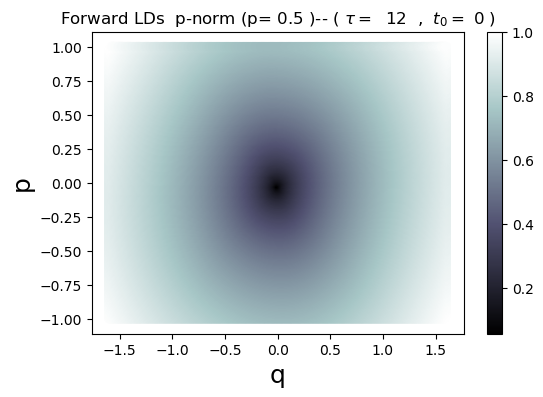

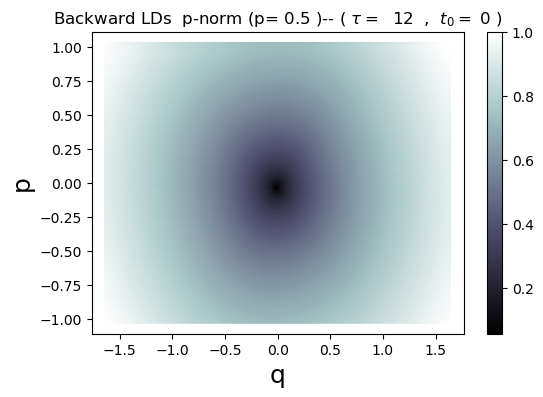

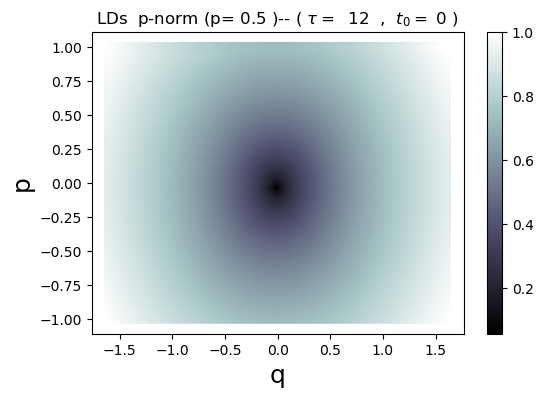

In [12]:
vector_field = HamCenter_1D
f = vector_field

# Computation of LDs
ld_backward, ld_forward = lagrangian_descriptors(t0,tau,flag_m,p_value,dt,xi,xf,nx,yi,yf,ny,vector_field)

for flag_type in [1,2,3]:
    draw_LDs_1D(t0,tau,flag_m,p_value,xi,xf,nx,yi,yf,ny,flag_type,ld_forward,ld_backward)

### Hamilton Saddle

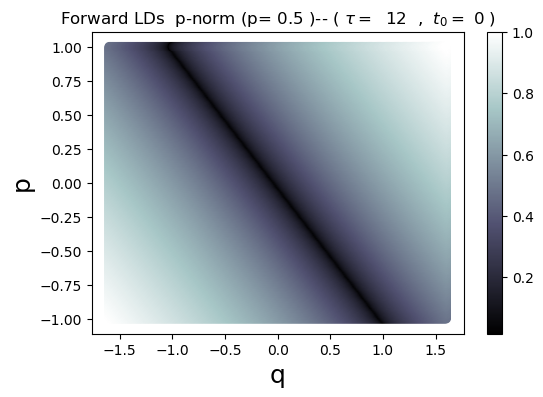

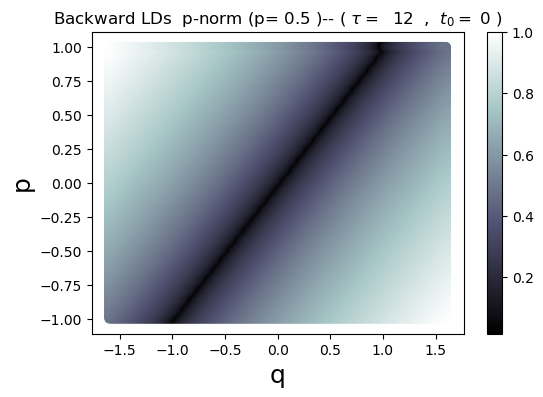

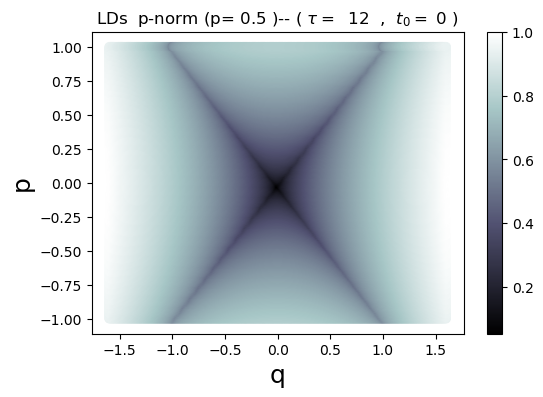

In [13]:
vector_field = HamSaddle_1D
f = vector_field

# Computation of LDs
ld_backward, ld_forward = lagrangian_descriptors(t0,tau,flag_m,p_value,dt,xi,xf,nx,yi,yf,ny,vector_field)

for flag_type in [1,2,3]:
    draw_LDs_1D(t0,tau,flag_m,p_value,xi,xf,nx,yi,yf,ny,flag_type,ld_forward,ld_backward)

### Hamilton Duffing (with forcing)

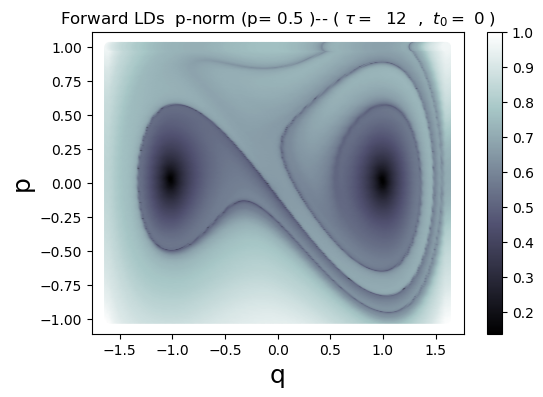

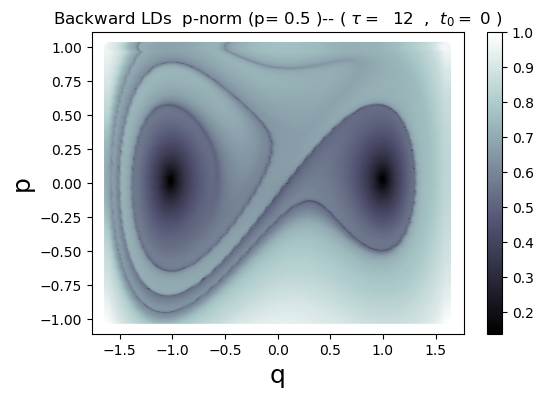

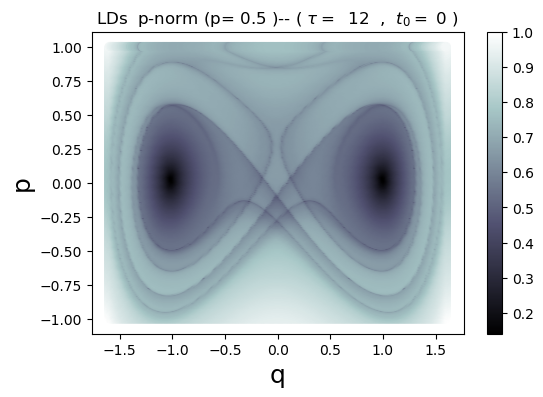

In [14]:
vector_field = HamDuffing_1D
f = vector_field

# Computation of LDs
ld_backward, ld_forward = lagrangian_descriptors(t0,tau,flag_m,p_value,dt,xi,xf,nx,yi,yf,ny,vector_field)

for flag_type in [1,2,3]:
    draw_LDs_1D(t0,tau,flag_m,p_value,xi,xf,nx,yi,yf,ny,flag_type,ld_forward,ld_backward)

# Version: Renaming variables and functions

## Functions

In [1]:
import numpy
import matplotlib.pyplot as plt

In [2]:
import scipy.integrate
integrator = scipy.integrate.solve_ivp # RK45 (default)

In [26]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
flag_m = True
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
perturbation_params = [0.15, 0.5]

In [4]:
def generate_points():
    mesh = numpy.zeros(shape) # Mesh to accumulate 
    points_x = numpy.linspace(x_min, x_max, Nx)
    points_y = numpy.linspace(y_min, y_max, Ny)    
    X, Y = numpy.meshgrid(points_x, points_y)  # Grid in pahse-space
    mesh[:,0] = X.T.reshape(-1)
    mesh[:,1] = Y.T.reshape(-1)
    return mesh

In [5]:
def flatten_array(points): return points.reshape(-1)
def recover_array(points_flat, shape = shape): return points_flat.reshape(shape)

Define vector fields

__VERSION 1__

In [28]:
def HamCenter1D(t, points_flat):
    x, y = recover_array(points_flat).T
    # Hamiltonian Model Parameter
    omega = 1
    v = numpy.array([ omega * y, - omega * x]).T
    # Flatten output 
    v_flat = flatten_array(v)
    
    return v_flat

In [29]:
def HamSaddle1D(t, points_flat):
    x, y = recover_array(points_flat).T
    # Hamiltonian Model Parameter
    lamda = 1;
    v = numpy.array([ lamda * y, lamda * x]).T
    # Flatten output 
    v_flat = flatten_array(v)
    
    return v_flat

In [31]:
def forcing(t, points_flat, flag_pert, perturbation_params):
    x, y = recover_array(points_flat).T
    pert = numpy.zeros((len(x),1))
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    if flag_pert == 1:
        perturbation = A * numpy.sin(freq*t)
    elif flag_pert == 2:
        perturbation = A * numpy.sech(t) * numpy.sin(freq*t)
    else:
        perturbation = perturbation
    
    return perturbation

In [32]:
def HamDuffing1D(t, points_flat):
    x, y = recover_array(points_flat).T
    # Hamiltonian Model Parameter
    perturbation = forcing(t, points_flat, flag_pert, perturbation_params)
    v = numpy.array([y, x - x**3 + perturbation]).T
    # Flatten output 
    v_flat = flatten_array(v)
    
    return v_flat

Extracts solution from solver

In [7]:
def extract_y_final(solution_object):
    y_final = solution_object.y.T[-1]
    return y_final

In [8]:
def accumulate_lagrangian_descriptor(LD, points_initial, points_now, p_norm = p_norm, flag_m = True):
    if flag_m: # p-norm LDs
        LD_accum = LD + ((abs(points_now[:,0] - points_initial[:,0]))**p_norm + (abs(points_now[:,1] - points_initial[:,1]))**p_norm) * dt ** (1 - p_norm);
    else:  # arclength LDs
        LD_accum = LD + sqrt((points_now[:,0] - points_now[:,0])**2 + (points_now[:,1] - points_initial[:,1])**2);
    return LD_accum

Removed `dt` and `p` from functions since these are global variables.

<span style='color:red'>What about flag_m?</span>

In [9]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt = dt, norm = False):
    f = vector_field
    t_initial, t_final = time_interval
    if t_final < t_initial:
        dt = - dt
    else:
        dt = dt
    LD = numpy.zeros(Nx*Ny)  # Array to store forward LDs

    for t in numpy.arange(t_initial, t_final - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t + dt)
        y0 = flatten_array(points_initial)
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0)
        points_final = extract_y_final(solution_object)
        points_final = recover_array(points_final)
        ###################################
        # Compute LD
        LD = accumulate_lagrangian_descriptor(LD, points_initial, points_final)
        ###################################
        # For next iteration
        points_initial = points_final
    return LD

Break down `lagrangian_descriptors` into separate code chunks

In [22]:
def draw_lagrangian_descriptor(LD, flag_m, flag_type):
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
    LD = LD / LD.max();  # Scale LD output
    ###################################
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    
    points_x = numpy.linspace(x_min, x_max, Nx)
    points_y = numpy.linspace(y_min, y_max, Ny)    
    X, Y = numpy.meshgrid(points_x, points_y)

    scatter = plt.scatter(X,Y,c=LD,cmap='bone')
    ###################################
    # Customise appearance
    if flag_m:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),')--'])
    else:
        str_meth = 'arclength --'
    
    if flag_type == 1:
        string_title = ['Forward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif flag_type == 2:
        string_title = ['Backward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    else:
        string_title = ['LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('q', fontsize=18)
    ax.set_ylabel('p', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter) # Add color bar

    plt.show()

## Benchmark examples

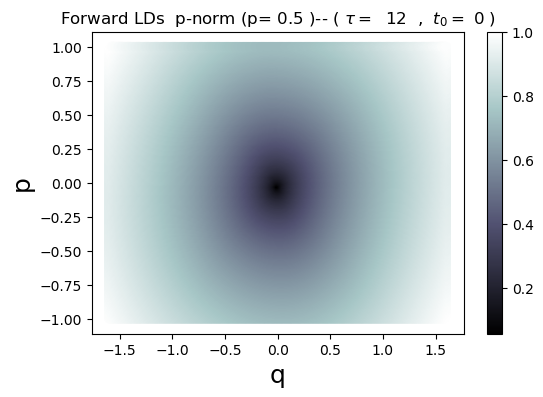

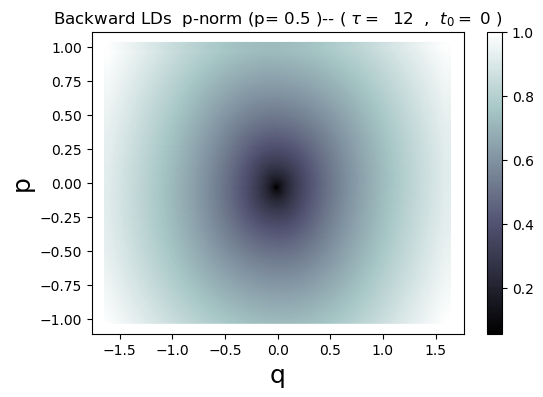

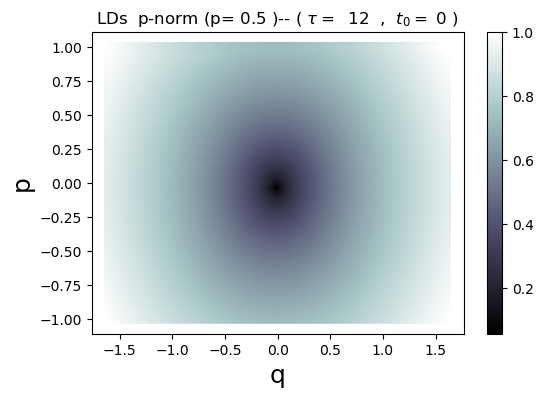

In [16]:
points_initial = generate_points()
vector_field = HamCenter1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

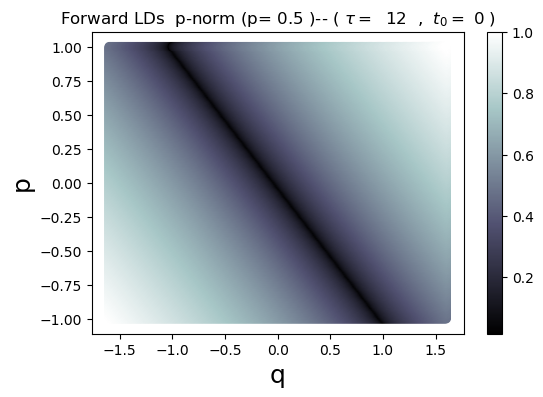

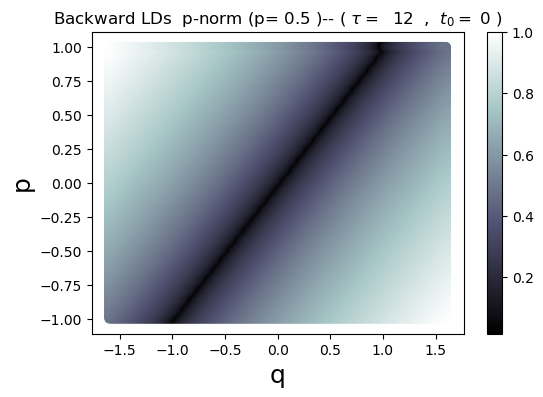

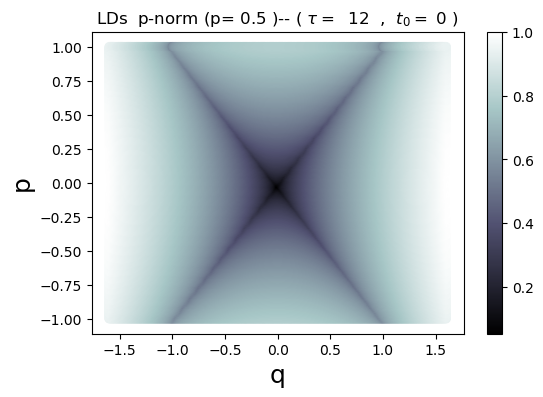

In [19]:
points_initial = generate_points()
vector_field = HamSaddle1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

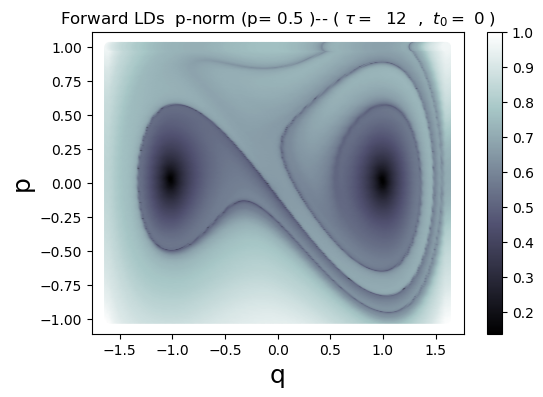

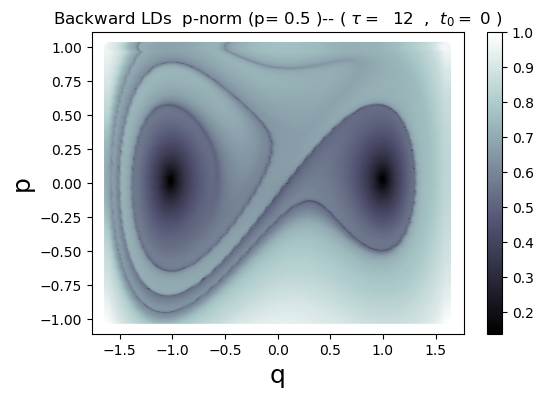

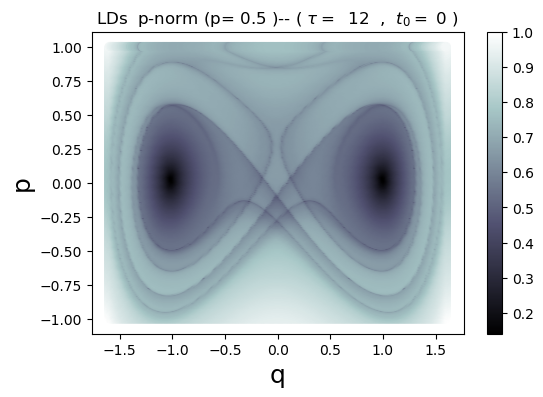

In [33]:
points_initial = generate_points()
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(points_initial, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

# Version: Desentangled vector field functions

## Functions

In [1]:
import numpy
import matplotlib.pyplot as plt

In [2]:
import scipy.integrate
integrator = scipy.integrate.solve_ivp # RK45 (default)

INPUT PARAMETERS

In [3]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
flag_m = True
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
perturbation_params = [0.15, 0.5]

In [4]:
def generate_points(GRID_PARAMETERS):
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    mesh = numpy.zeros(shape) # Mesh to accumulate 
    points_x = numpy.linspace(x_min, x_max, Nx)
    points_y = numpy.linspace(y_min, y_max, Ny)    
    X, Y = numpy.meshgrid(points_x, points_y)  # Grid in pahse-space
    mesh[:,0] = X.T.reshape(-1)
    mesh[:,1] = Y.T.reshape(-1)
    return mesh

In [5]:
def flatten_array(points): return points.reshape(-1)
def recover_array(points_flat, shape = shape): return points_flat.reshape(shape)

### Vector fields

In [6]:
def HamCenter1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    omega = 1
    v = numpy.array([ omega * y, - omega * x]).T
    return v

In [7]:
def HamSaddle1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda = 1
    v = numpy.array([ lamda * y, lamda * x]).T
    return v

In [8]:
def forcing(t, u, flag_pert, perturbation_params):
    x, y = u.T
    pert = numpy.zeros((len(x),1))
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    if flag_pert == 1:
        perturbation = A * numpy.sin(freq*t)
    elif flag_pert == 2:
        perturbation = A * numpy.sech(t) * numpy.sin(freq*t)
    else:
        perturbation = perturbation
    
    return perturbation

In [9]:
def HamDuffing1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    perturbation = forcing(t, u, flag_pert, perturbation_params)
    v = numpy.array([y, x - x**3 + perturbation]).T
    return v

Turn phase-space vector field to high-dimensional vector field

In [10]:
def vector_field_flat(t, points, vector_field):
    u = recover_array(points)
    v = vector_field(t, u)
    # Flatten output 
    v_flat = flatten_array(v)

    return v_flat

Extracts solution from solver

In [11]:
def extract_y_final(solution_object):
    y_final = solution_object.y.T[-1]
    return y_final

In [12]:
def accumulate_lagrangian_descriptor(LD, points_initial, points_now, p_norm = p_norm, flag_m = True):
    if flag_m: # p-norm LDs
        LD_accum = LD + ((abs(points_now[:,0] - points_initial[:,0]))**p_norm + (abs(points_now[:,1] - points_initial[:,1]))**p_norm) * dt ** (1 - p_norm);
    else:  # arclength LDs
        LD_accum = LD + sqrt((points_now[:,0] - points_now[:,0])**2 + (points_now[:,1] - points_initial[:,1])**2);
    return LD_accum

Removed `dt` and `p` from functions since these are global variables.

<span style='color:red'>What about flag_m?</span>

In [13]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt = dt, norm = False):
    f = vector_field_flat
    t_initial, t_final = time_interval
    if t_final < t_initial:
        dt = - dt
    else:
        dt = dt
    LD = numpy.zeros(Nx*Ny)  # Array to store forward LDs

    for t in numpy.arange(t_initial, t_final - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t + dt)
        y0 = flatten_array(points_initial)
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0, args=(vector_field, ))
        points_final = extract_y_final(solution_object)
        points_final = recover_array(points_final)
        ###################################
        # Compute LD
        LD = accumulate_lagrangian_descriptor(LD, points_initial, points_final)
        ###################################
        # For next iteration
        points_initial = points_final
    return LD

Break down `lagrangian_descriptors` into separate code chunks

In [14]:
def draw_lagrangian_descriptor(LD, flag_m, flag_type):
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
#     LD = LD / LD.max()  # Scale LD output
    ###################################
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    
    points_x = numpy.linspace(x_min, x_max, Nx)
    points_y = numpy.linspace(y_min, y_max, Ny)    
    X, Y = numpy.meshgrid(points_x, points_y)

    scatter = plt.scatter(X,Y,c=LD,cmap='bone')
    ###################################
    # Customise appearance
    if flag_m:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),')--'])
    else:
        str_meth = 'arclength --'
    
    if flag_type == 1:
        string_title = ['Forward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif flag_type == 2:
        string_title = ['Backward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    else:
        string_title = ['LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('x', fontsize=18)
    ax.set_ylabel('y', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter) # Add color bar

    plt.show()

## Benchmark examples

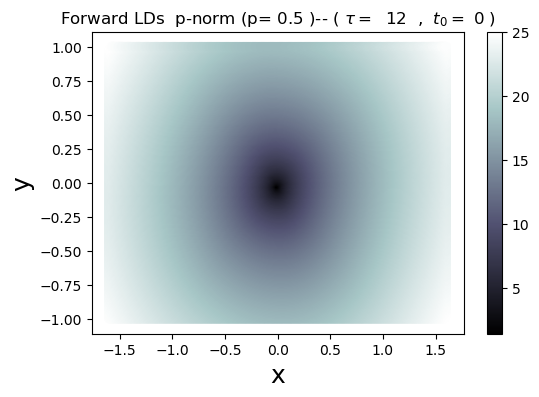

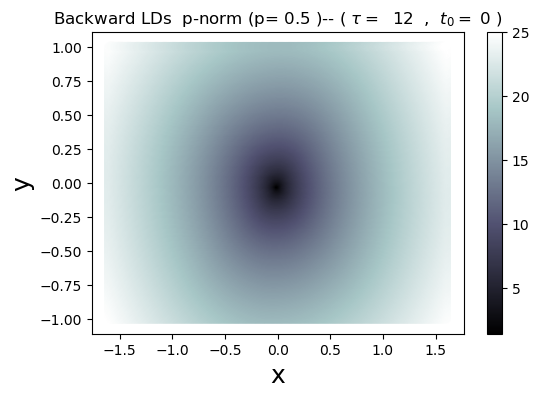

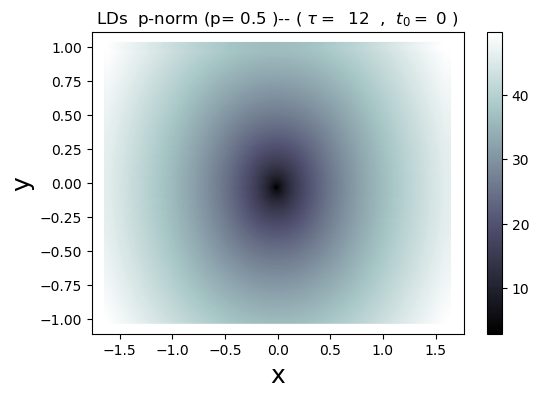

In [15]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamCenter1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

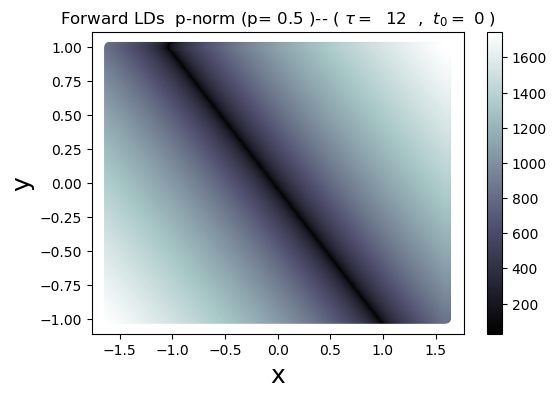

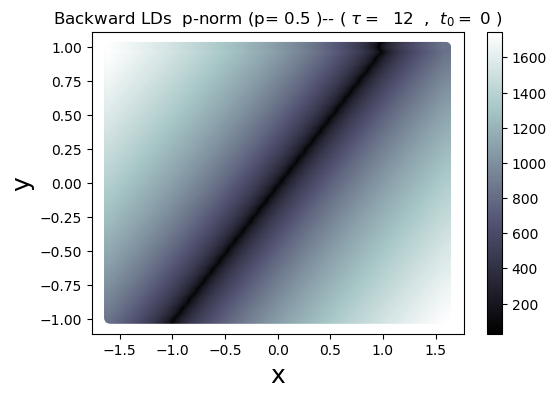

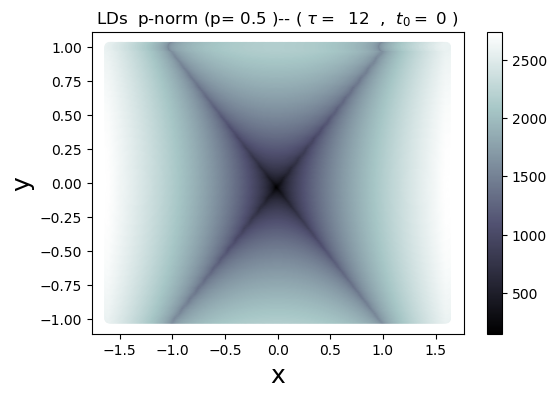

In [16]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSaddle1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

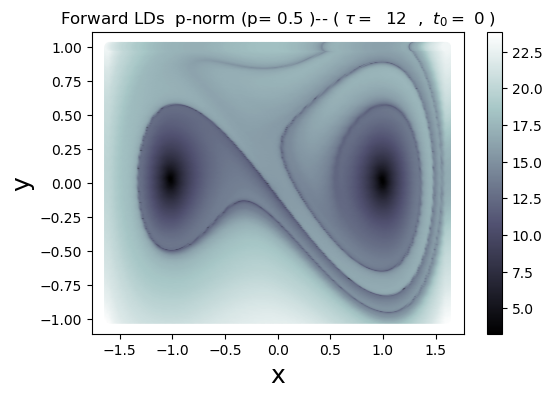

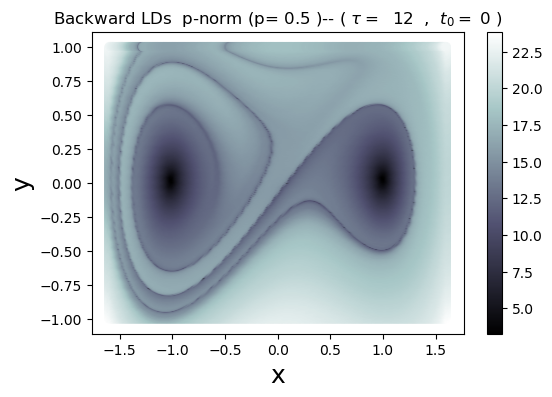

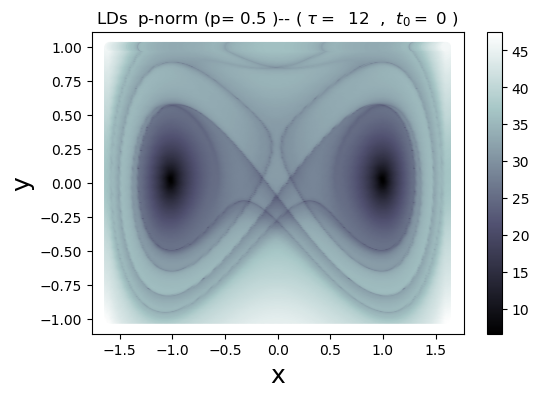

In [17]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

## Test: Hamilton Saddle-Node (blow up in finite time)

Define vector field $f(x,y) = (f_1, f_2)$

In [83]:
def HamSN1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    v = numpy.array([ y, -x -x**2]).T
    return v

with initial condition $(x_0, y_0) \in \mathbb{R}^2$ at time $t_0 \geq 0$

In [84]:
###################################
# Integration parameters
t0 = 0 # Initial time
tau = 1.5 # Time-interval length
dt = 0.1 # Timestep
###################################
# Lagrangian descriptor parameters
p_norm = 1/2 # p-value of Lp norm
flag_m = True
###################################
# Grid parameters
x_min,x_max = [-1.5, 1] # Grid limits X-axis
y_min,y_max = [-1, 1] # Grid limits Y-axis
Nx, Ny = [300, 300] # Number of points per axis

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2 # Phase-space Dimension
shape = (Nx*Ny, dim) # Shape of array of grid-points
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1 
perturbation_params = [0.15, 0.5] # Amplitude & Frequency, periodic pertubation

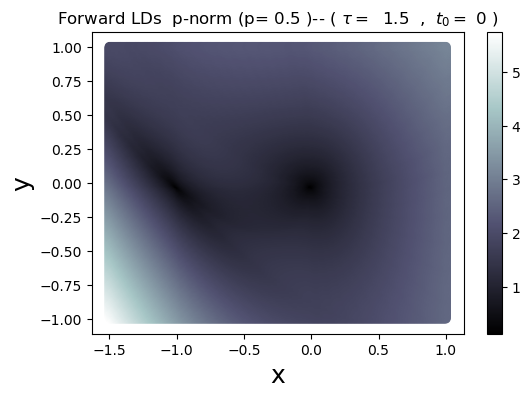

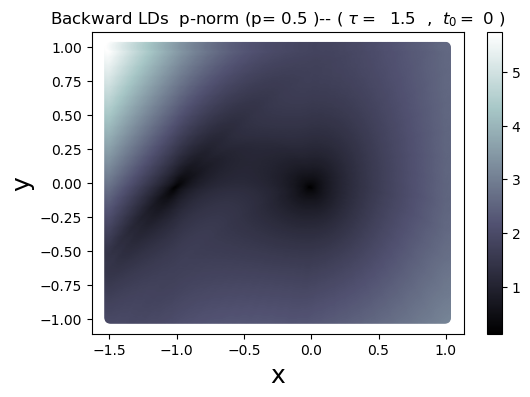

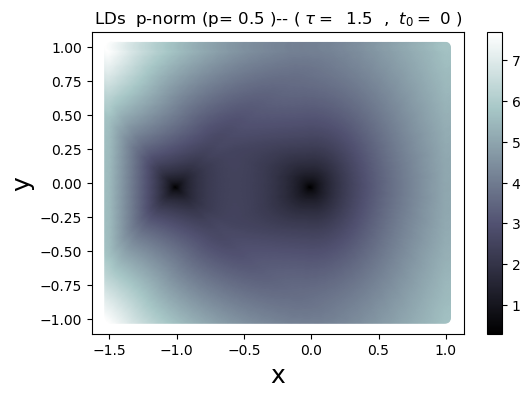

In [85]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSN1D

# Compute and draw forward LD
time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_forward, True, 1)

# Compute and draw backward LD
time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval)
draw_lagrangian_descriptor(LD_backward, True, 2)

# Compute and draw total LD
LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

<span style='color:red'><b>NOTE</b></span> The poor resolution of the invariant manifolds in the HSN system is due to numerical blow up, since the system escapes to inifinity in finite time, as its underlying bahviour. 

<span style='color:blue'><b>SOLUTION</b></span> Need to implement _Variable Time Integration_

# Version: Vladimir's pull-request 

<span style='color:red'><b>IMPORTANT NOTE</b></span> For this version the following main changes were made

* The functions for _flattening_ and _recovery_ to handle array shapes was scrapped. Now, we explicitly use the `.reshape` and `flatten` attributes of `numpy` array objects.

* Defintion of the $M$ function changed too (HOW?)

* The approach to copute the lagrangian descriptors from trajectories changed in a fundamental way

    * BEFORE, at each timestep of the integration (used `integrator` under `for` loop) the LDs were computed and accumulated using `accumulate_lagrangian_descriptor` to throw a final function for all initial conditions at the end. This avoids memory overhead, as values of final points after integration are only store. _DISADVANTAGES_ ... (WRITE)
    
    * NOW, The whole solved trajectory for all data points in computed first, and then the LD functions are computed at the end, using `lagrangian_descriptor`, within `compute_lagrangian_descriptor`. This may result in memory overhead as whole trajectories have to be stored, to compute the LD functions at the end. _ADVANTAGES_ ... (WRITE)

## Functions

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp as integrator # RK45 (default)

INPUT PARAMETERS

In [2]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
flag_m = True
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
perturbation_params = [0.15, 0.5]

In [3]:
def generate_points(GRID_PARAMETERS):
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten()]) # 2D grid
    return mesh

### Vector fields

In [4]:
def HamCenter1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    omega = 1
    v = np.array([ omega * y, - omega * x]).T
    return v

In [5]:
def HamSaddle1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda = 1
    v = np.array([ lamda * y, lamda * x]).T
    return v

In [6]:
def forcing(t, u, flag_pert, perturbation_params):
    x, y = u.T
    pert = np.zeros((len(x),1))
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    if flag_pert == 1:
        perturbation = A * np.sin(freq*t)
    elif flag_pert == 2:
        perturbation = A * np.sech(t) * np.sin(freq*t)
    else:
        perturbation = perturbation
    
    return perturbation

In [7]:
def HamDuffing1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    perturbation = forcing(t, u, flag_pert, perturbation_params)
    v = np.array([y, x - x**3 + perturbation]).T
    return v

Turn phase-space vector field to high-dimensional vector field

In [16]:
def vector_field_flat(t, points, vector_field):
    u = points.reshape(shape)
    v = vector_field(t, u)
    return v.flatten()

This function substitutes previous accumulating function, which has a more neat defintion. 

In [47]:
def lagrangian_descriptor(points_final, p_norm = 0.5, flag_m = True):
    points_difference = points_final[1:] - points_final[:-1]
    if flag_m: # p-norm LDs
        LD_rows = np.sum(np.abs(points_difference)**p_norm, axis=2)
        LD = np.sum(LD_rows, axis=0)
    else:  # arclength LDs
        LD_rows = np.sqrt(np.sum((points_final)**2),axis=2)
        LD = np.sum(LD_rows, axis=0)
    return LD

In [ ]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt, norm = False):
    f = vector_field_flat # issue: defined as global function, independently of vector_field argument
    t_initial, t_final = time_interval
    if (t_final - t_initial)*dt < 0:
        dt = -dt
    y0 = points_initial.flatten() # All initial conditions taken at once
    t_evaluation = np.arange(t_initial, t_final + dt, dt) # Sequence of time-points for integration
    # Outputs from integration
    solution_object = integrator(f, time_interval, y0, t_eval=t_evaluation, args=(vector_field, )) #f and vector_field ambiguity needs fixing
    points_final = solution_object.y.T
    points_final = points_final.reshape((len(t_evaluation),shape[0], shape[1]))
    print(type(points_final)) #####################
    # Compute LD
    LD = lagrangian_descriptor(points_final)
    return LD

### __Start of test code__ Previous implementations

Extracts solution from solver

Removed `dt` and `p` from functions since these are global variables.

<span style='color:red'>What about flag_m?</span>

__HYPOTHESIS__ Looping for  for different `t_span` intervals is not the same as taking `t_eval`. Compare outputs

### __End of test code__ Previous implementations

In [37]:
def draw_lagrangian_descriptor(LD, flag_m, flag_type):
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
    LD = LD / LD.max()  # Scale LD output
    ###################################
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    X, Y = np.meshgrid(points_x, points_y)

    scatter = plt.scatter(X,Y,c=LD, cmap='bone')
    ###################################
    # Customise appearance
    if flag_m:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),')--'])
    else:
        str_meth = 'arclength --'
    
    if flag_type == 1:
        string_title = ['Forward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif flag_type == 2:
        string_title = ['Backward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    else:
        string_title = ['LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('x', fontsize=18)
    ax.set_ylabel('y', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter) # Add color bar

    plt.show()

## Benchmark examples

### Hamilton Centre

<class 'numpy.ndarray'>


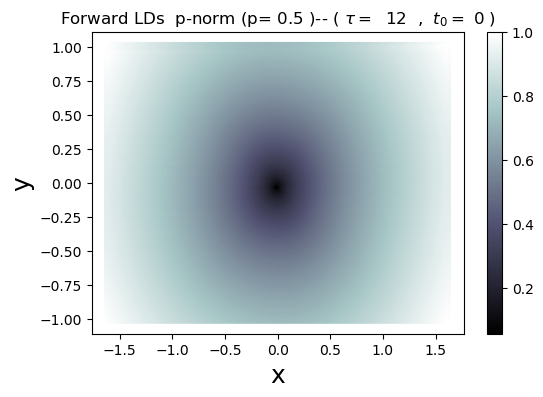

<class 'numpy.ndarray'>


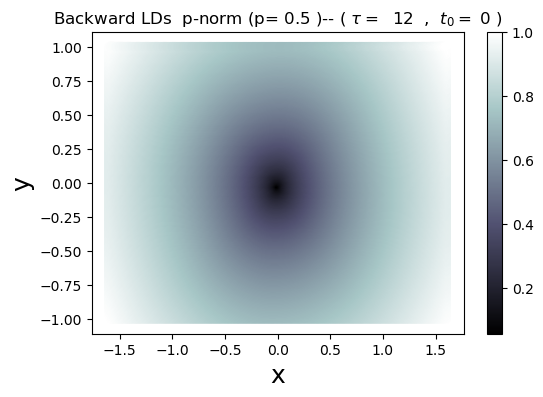

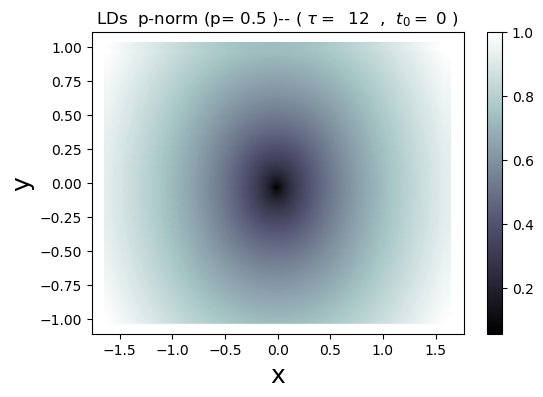

In [34]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamCenter1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

### Hamilton Saddle 

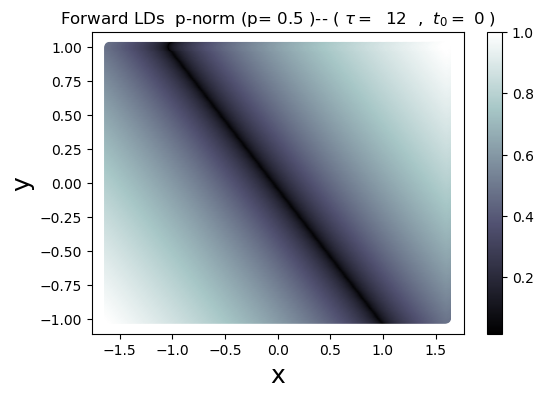

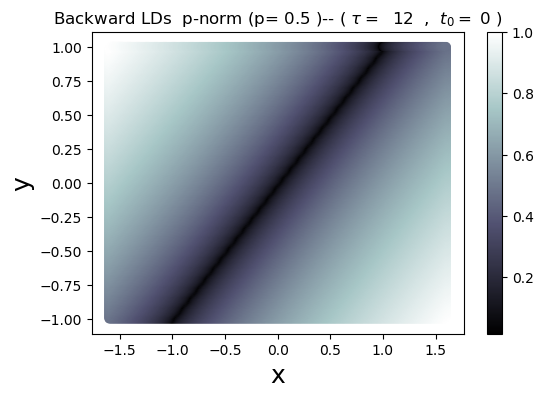

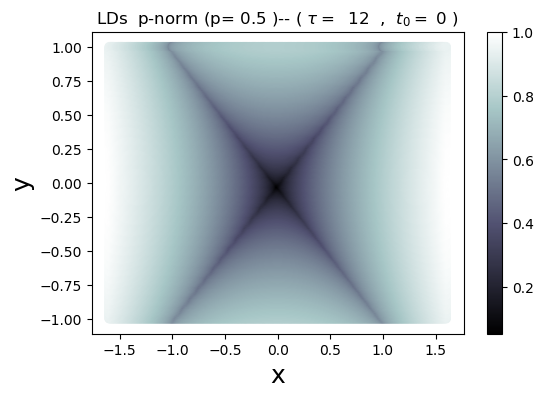

In [21]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSaddle1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

### Hamilton Duffing

__OUTPUT TEST__ Using `for` loop for integration (as in previous implementations) while keeping the function to compute the LD. The full resolved trajectory is computed first, and then LD is calculated. 

In [44]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
trajectory = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)

In [45]:
trajectory = np.array(trajectory)

In [48]:
LD = lagrangian_descriptor(trajectory)

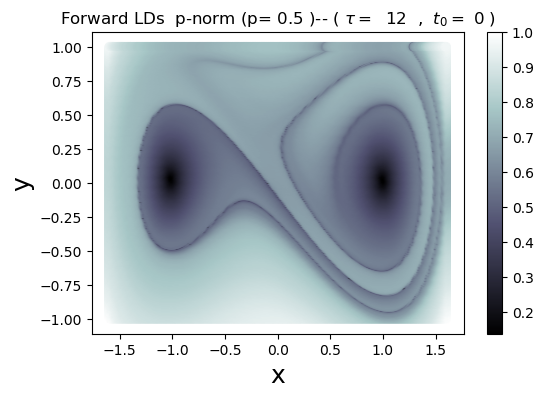

In [49]:
draw_lagrangian_descriptor(LD, True, 1)

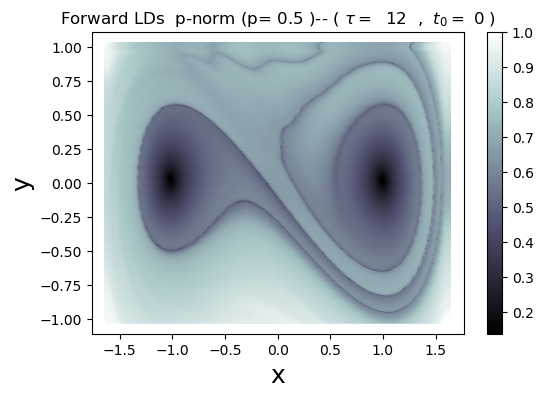

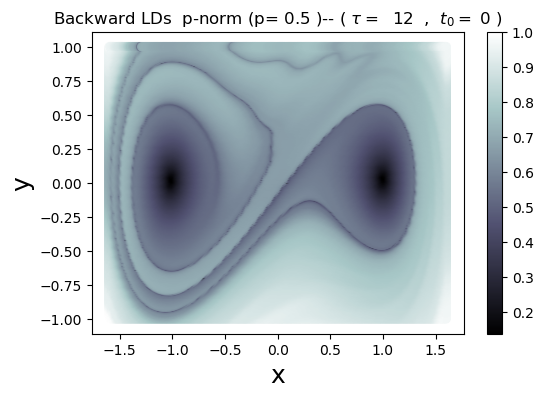

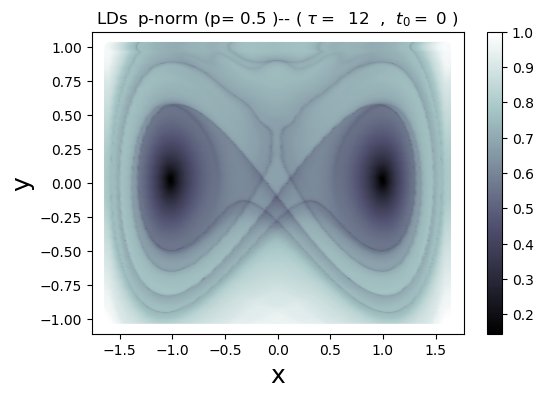

In [22]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

# Version: Fixed implementation after Vladimir's pull-request

Kept some enhancements in code formatting made by Vladimir's while keeping correctly functioning bits from previous implementations using a for loop approach to integration using `solve_ivp`

## Functions 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp as integrator # RK45 (default)

INPUT PARAMETERS

In [2]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
flag_m = True
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
perturbation_params = [0.15, 0.5]

In [3]:
def generate_points(GRID_PARAMETERS):
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten()]) # 2D grid
    return mesh

### Vector fields

In [4]:
def HamCenter1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    omega = 1
    v = np.array([ omega * y, - omega * x]).T
    return v

In [5]:
def HamSaddle1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda = 1
    v = np.array([ lamda * y, lamda * x]).T
    return v

In [6]:
def forcing(t, u, flag_pert, perturbation_params):
    x, y = u.T
    pert = np.zeros((len(x),1))
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    if flag_pert == 1:
        perturbation = A * np.sin(freq*t)
    elif flag_pert == 2:
        perturbation = A * np.sech(t) * np.sin(freq*t)
    else:
        perturbation = perturbation
    
    return perturbation

In [7]:
def HamDuffing1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    perturbation = forcing(t, u, flag_pert, perturbation_params)
    v = np.array([y, x - x**3 + perturbation]).T
    return v

Turn phase-space vector field to high-dimensional vector field

In [8]:
def vector_field_flat(t, points, vector_field):
    u = points.reshape(shape)
    v = vector_field(t, u)
    return v.flatten()

In [9]:
def accumulate_lagrangian_descriptor(LD, points_initial, points_final, p_norm = 0.5, flag_m = True):
    if flag_m: # p-norm LDs
        F = dt ** (1 - p_norm) # Scaling factor from discrete integration
        LD_accum = LD + F*((abs(points_final[:,0] - points_initial[:,0]))**p_norm + (abs(points_final[:,1] - points_initial[:,1]))**p_norm)

    else:  # arclength LDs
        LD_accum = LD + np.sqrt((points_final[:,0] - points_final[:,0])**2 + (points_final[:,1] - points_initial[:,1])**2);
    return LD_accum

In [10]:
def extract_y_final(solution_object):
    y_final = solution_object.y.T[-1]
    return y_final

In [11]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt = dt, norm = False):
    f = vector_field_flat
    t_initial, t_final = time_interval
    if (t_final - t_initial)*dt < 0:
        dt = -dt
    LD = np.zeros(Nx*Ny)  # Array to store forward LDs
    trajectory = []
    for t in np.arange(t_initial, t_final - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t + dt)
        y0 = points_initial.flatten()
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0, args=(vector_field, ))
        points_final = extract_y_final(solution_object)
        points_final = points_final.reshape(shape)
        ###################################
        # Compute LD
        LD = accumulate_lagrangian_descriptor(LD, points_initial, points_final)
        ###################################
        # For next iteration
        points_initial = points_final
        trajectory.append(points_final)
    return LD

In [12]:
def draw_lagrangian_descriptor(LD, flag_m, flag_type):
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
    LD = LD / LD.max()  # Scale LD output
    ###################################
    # Plot LDs
    fig,ax = plt.subplots(1,1,dpi=100)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    X, Y = np.meshgrid(points_x, points_y)

    scatter = plt.scatter(X,Y,c=LD, cmap='bone')
    ###################################
    # Customise appearance
    if flag_m:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),')--'])
    else:
        str_meth = 'arclength --'
    
    if flag_type == 1:
        string_title = ['Forward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif flag_type == 2:
        string_title = ['Backward LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    else:
        string_title = ['LDs ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('x', fontsize=18)
    ax.set_ylabel('y', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter) # Add color bar

    plt.show()

## Benchmark examples

### Hamilton Centre

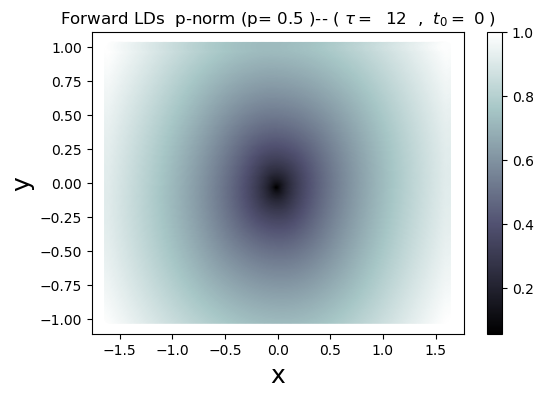

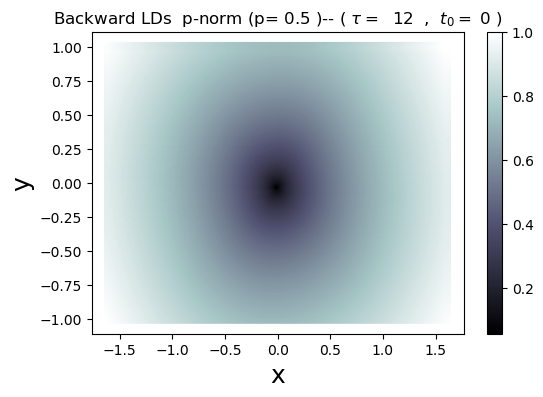

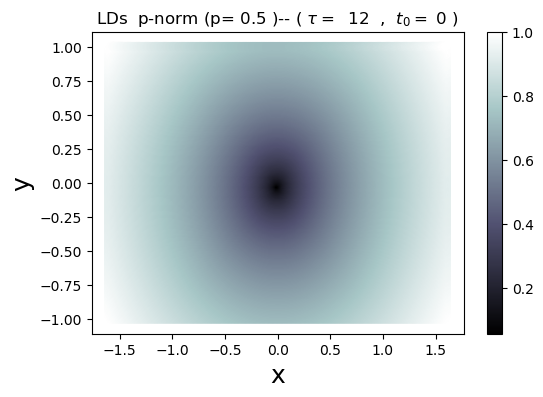

In [13]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamCenter1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

### Hamilton Saddle 

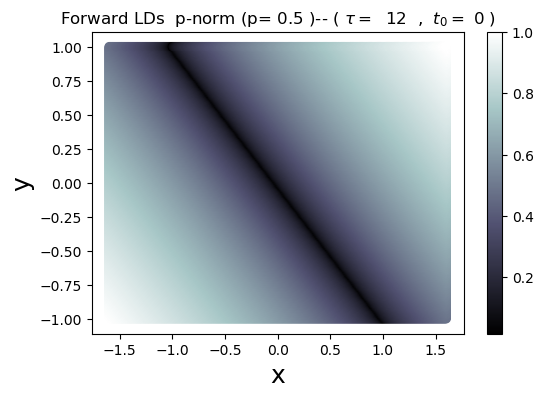

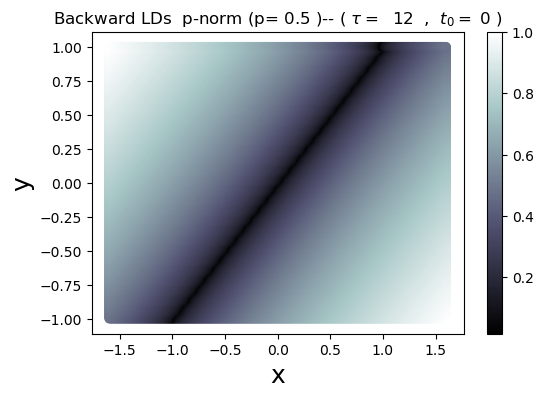

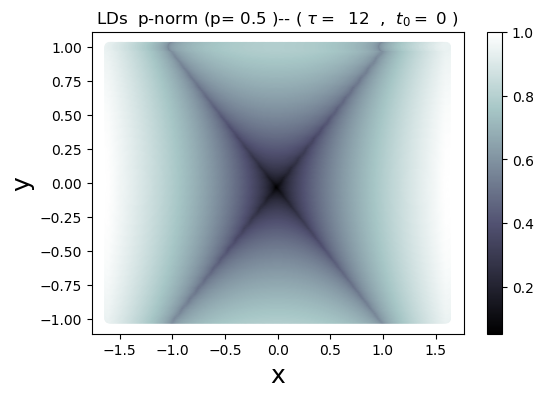

In [14]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSaddle1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

### Hamilton Duffing

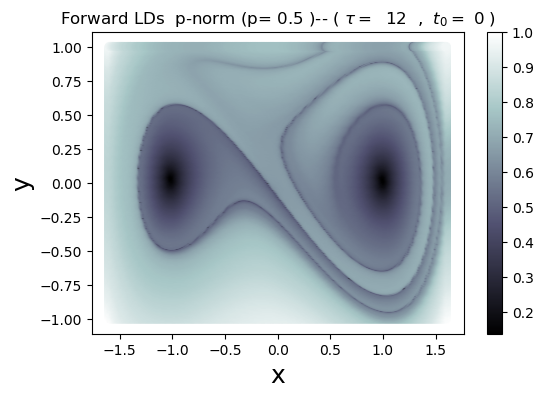

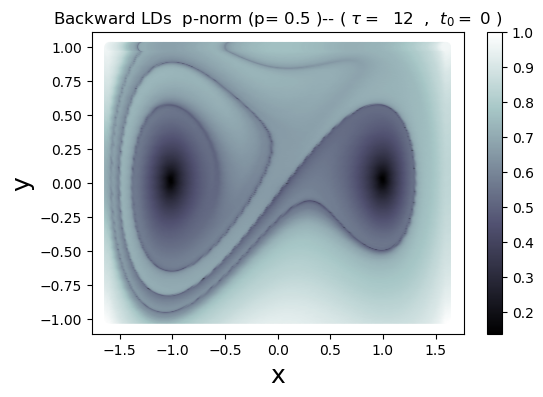

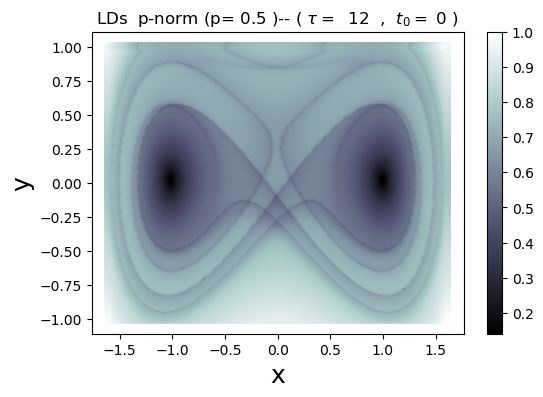

In [15]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

# Test: Implementation with _Variable Time Integration_

## MATLAB version

```bash
function vel = HamSaddle_1D(t,p,flag_pert,pert_params,flag_vt,boundx,boundy)
   
    vel = zeros(size(p,1),2);
    
    pert = forcing(t,p,flag_pert,pert_params);
       
    % Hamiltonian Model Parameter
    lambda = 1;
    
    x = p(:,1);
    y = p(:,2);
    
    if flag_vt
        % Escape Condition for Variable-Iterations
        idx = (x >= - boundx) & (x <= boundx) & (y >= -boundy) & (y <= boundy);
              
        vel(idx,1) = lambda .* y(idx);
        vel(idx,2) = lambda .* x(idx) + pert(idx);
    else
    	vel(:,1) = lambda .* y;
        vel(:,2) = lambda .* x + pert;       
    end
       
end


```

__PYTHON IMPLEMENTATION__

Define escape box boundaries

In [16]:
escape_box_x_min = -6
escape_box_x_max = 6
escape_box_y_min = -6
escape_box_y_max = 6

escape_box_BOUNDARIES = [
    [escape_box_x_min, escape_box_x_max],
    [escape_box_y_min, escape_box_y_max]
]

Vector field initially is equal to 0.
And x/y are given values from points.
But if x/y not within boundaries, then return vector field equal to zero, otheriwse continue as usually defined.

In [23]:
def HamSN1D(t, u):
    x, y = u.T
    # Define zero null vector field
    v = np.zeros(u.shape) 
    # Hamiltonian model parameter
    # Define escape condition
    u_indices = (x >= escape_box_x_min) & (x <= escape_box_x_max) & (y >= escape_box_y_min) & (y <= escape_box_y_max)
    
    v[u_indices == True] = np.array([ y[u_indices == True], -x[u_indices == True] -x[u_indices == True]**2]).T
    return v

In [24]:
###################################
# Integration parameters
t0 = 0 # Initial time
tau = 8 # Time-interval length
dt = 0.1 # Timestep
###################################
# Lagrangian descriptor parameters
p_norm = 1/2 # p-value of Lp norm
flag_m = True
###################################
# Grid parameters
x_min,x_max = [-1.5, 1] # Grid limits X-axis
y_min,y_max = [-1, 1] # Grid limits Y-axis
Nx, Ny = [300, 300] # Number of points per axis

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2 # Phase-space Dimension
shape = (Nx*Ny, dim) # Shape of array of grid-points
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1 
perturbation_params = [0.15, 0.5] # Amplitude & Frequency, periodic pertubation

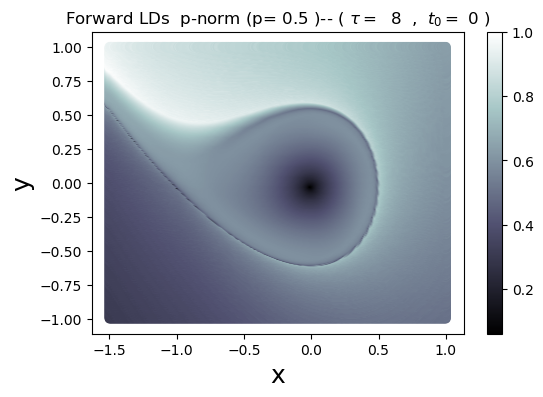

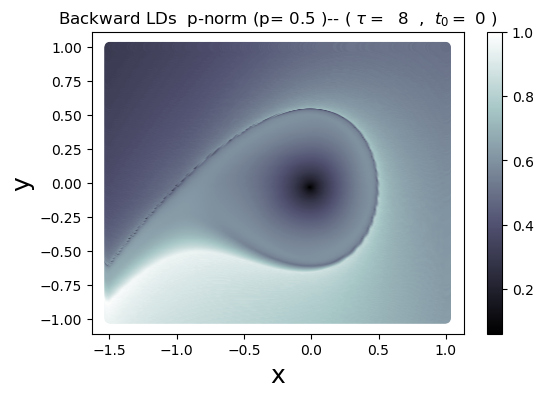

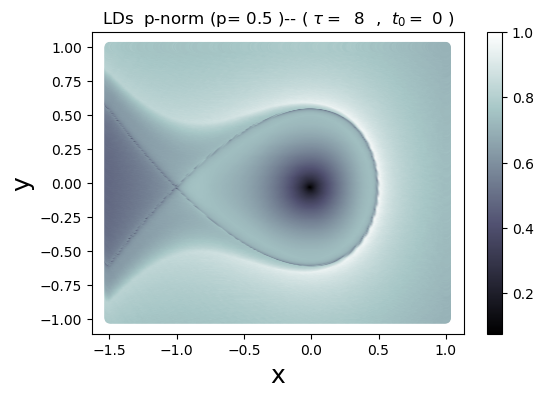

In [25]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSN1D

# Compute and draw forward LD
time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

# Compute and draw backward LD
time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

# Compute and draw total LD
LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

## Implementation test

__NOTE__ The above implementation deals successfully with the issue of rapidly escaping trajectories. However, code implementation incorporates the _Escape Condition_ within the definition of the vector field function.

__CHANGES__ I will decouple the definition of the vector field from the escape condition, and insted I will couple this within the evaluated vector field for integration `vector_field_flat`. In this way it will avoid users from having to define the _Escape Condition_ every single time they define their `vector_field` functions. 

In [36]:
import numpy as np

In [37]:
box_x_min = -6
box_x_max = 6
box_y_min = -6
box_y_max = 6

box_BOUNDARIES = [
    [box_x_min, box_x_max],
    [box_y_min, box_y_max]
]

In [39]:
def check_if_points_escape_box(u, box_BOUNDARIES):
    x, y = u.T
    # Escape condition
    box_x_min, box_x_max = box_BOUNDARIES[0]
    box_y_min, box_y_max = box_BOUNDARIES[1]
    u_indices = (x >= box_x_min) & (x <= box_x_max) & (y >= box_y_min) & (y <= box_y_max)
    return u_indices

In [19]:
def vector_field_flat(t, points, vector_field, box_BOUNDARIES = box_BOUNDARIES):
    u = points.reshape(shape)
    # Apply Escape condition
    u_inbox = check_if_points_escape_box(u, box_BOUNDARIES)
    # Define output vector field in combination with escape condition
    v = np.zeros(u.shape)
    v[u_inbox == True] = vector_field(t, u[u_inbox == True])
    return v.flatten()

In [45]:
def lagrangian_descriptor(points_final, p_norm = 0.5, flag_m = True):
    points_difference = points_final[1:] - points_final[:-1]
    if flag_m: # p-norm LDs
        LD_rows = np.sum(np.abs(points_difference)**p_norm, axis=2)
        LD = np.sum(LD_rows, axis=0)
    else:  # arclength LDs
        LD_rows = np.sqrt(np.sum((points_final)**2),axis=2)
        LD = np.sum(LD_rows, axis=0)
    return LD

In [46]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt, norm = False):
    f = vector_field_flat # issue: defined as global function, independently of vector_field argument
    t_initial, t_final = time_interval
    if (t_final - t_initial)*dt < 0:
        dt = -dt
    y0 = points_initial.flatten() # All initial conditions taken at once
    t_evaluation = np.arange(t_initial, t_final + dt, dt) # Sequence of time-points for integration
    # Outputs from integration
    solution_object = integrator(f, time_interval, y0, t_eval=t_evaluation, args=(vector_field, )) #f and vector_field ambiguity needs fixing
    points_final = solution_object.y.T
    points_final = points_final.reshape((len(t_evaluation),shape[0], shape[1]))
    # Compute LD
    LD = lagrangian_descriptor(points_final)
    return LD

Input Parameters

In [47]:
###################################
# Integration parameters
t0 = 0 # Initial time
tau = 8 # Time-interval length
dt = 0.1 # Timestep
###################################
# Lagrangian descriptor parameters
p_norm = 1/2 # p-value of Lp norm
flag_m = True
###################################
# Grid parameters
x_min,x_max = [-1.5, 1] # Grid limits X-axis
y_min,y_max = [-1, 1] # Grid limits Y-axis
Nx, Ny = [300, 300] # Number of points per axis

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2 # Phase-space Dimension
shape = (Nx*Ny, dim) # Shape of array of grid-points
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1 
perturbation_params = [0.15, 0.5] # Amplitude & Frequency, periodic pertubation

In [48]:
def HamSN1D(t, u):
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([ y, -x -x**2]).T
    return v

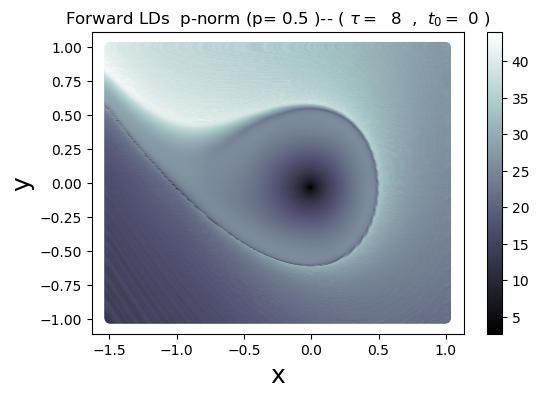

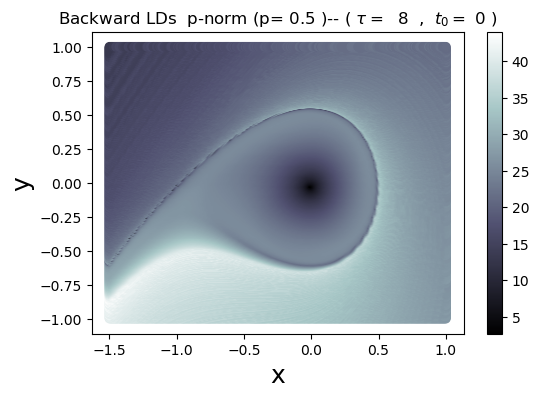

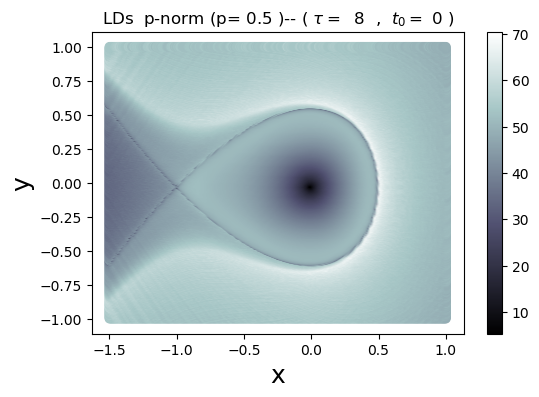

In [49]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSN1D

# Compute and draw forward LD
time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, True, 1)

# Compute and draw backward LD
time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, True, 2)

# Compute and draw total LD
LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, True, 3)

# Version: Variable Time Integration

## Functions 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp as integrator # RK45 (default)

INPUT PARAMETERS

In [2]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1;
perturbation_params = [0.15, 0.5]

In [3]:
def generate_points(GRID_PARAMETERS):
    """
    Returns a 1D array of all points from a meshgrid with dimensions and size defined by list of input parameters.
    
    Parameters
    ----------
    GRID_PARAMETERS : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
        
    Returns
    -------
    mesh : 1d numpy array
        points from meshgrid 
    """
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten()]) # 2D grid
    return mesh

### Vector fields

In [4]:
def HamCenter1D(t, u):
    """
    Returns 1D Hamilton-Centre vector field at time t, for an array of points in phase-space.
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
        
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u in phase-space at time t
        functional form and parameters of the field is hard-coded.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    omega = 1
    v = np.array([ omega * y, - omega * x]).T
    return v

In [5]:
def HamSaddle1D(t, u):
    """
    Returns 1D Hamilton-Saddle vector field at time t, for an array of points in phase-space.
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
        
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u in phase-space at time t
        functional form and parameters of the field is hard-coded.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda = 1
    v = np.array([ lamda * y, lamda * x]).T
    return v

In [6]:
def HamDuffing1D(t, u):
    """
    Returns perturbed 1D Hamilton-Duffing vector field at time t, for an array of points in phase-space.
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
        
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u in phase-space at time t
        functional form and parameters of the field is hard-coded.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([y, x - x**3]).T
    return v

In [7]:
def HamSN1D(t, u):
    """
    Returns 1D Hamilton-Saddle-Node vector field at time t, for an array of points in phase-space.
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
        
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u in phase-space at time t
        functional form and parameters of the field is hard-coded.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([ y, -x -x**2]).T
    return v

In [8]:
def HamSN1D_inverted(t, u):
    """
    Returns 1D Inverted Hamilton-Duffing vector field at time t, for an array of points in phase-space.
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
        
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u in phase-space at time t
        functional form and parameters of the field is hard-coded.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    # perturbation = forcing(t, u, flag_pert, perturbation_params)
    # v = np.array([y, - x + x**3 + perturbation]).T
    v = np.array([y, - x + x**3]).T
    return v

In [9]:
def forcing(t, u, perturbation_type = 1, perturbation_params = [0.15, 0.5]):
    x, y = u.T
    perturbation = np.zeros(u.shape)
    
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    
    if perturbation_type == 1:
        perturbation = perturbation + np.array([0, A * np.sin(freq*t)])
    elif perturbation_type == 2:
        perturbation = perturbation + np.array([0, A * np.sech(t) * np.sin(freq*t)])
    elif perturbation_type == None:
        perturbation = perturbation
    
    return perturbation

In [10]:
def perturb_field(vector_field, perturbation):
    """
    Returns the vector field function with a linearly added pertubation
    Both input function should input (t, u), with t: float, and u: ndarray
    Also, the output of these funcs must be ndarrays of the same shape
    
    Parameters
    ----------
        vector_field: function
            unperturbed vector field
        perturbation: function
            forcing added to the vector field
    
    Returns
    -------
        perturbed function
    """
    return lambda t, u: vector_field(t, u) + perturbation(t, u)

Turn phase-space vector field to high-dimensional vector field

In [11]:
box_x_min = -6
box_x_max = 6
box_y_min = -6
box_y_max = 6

box_BOUNDARIES = [
    (box_x_min, box_x_max),
    (box_y_min, box_y_max)
]

In [12]:
def check_if_points_escape_box(u, box_BOUNDARIES):
    """
    Determine if points in phase-space u have scaped box with user-defined defined dimensions
    
    Parameters
    ----------
    u : array_like, shape(n, )
        points in phase-space to check if outside box boundaries
    
    box_BOUNDARIES : list of 2-tuples of floats
        box lower and upper limits along X and Y axes
        
    Returns
    -------
    u_indices : array_like, shape(n, )
        array of True/False bool values if points inside/outside the box
    """
    x, y = u.T
    # Escape condition
    box_x_min, box_x_max = box_BOUNDARIES[0]
    box_y_min, box_y_max = box_BOUNDARIES[1]
    u_indices = (x >= box_x_min) & (x <= box_x_max) & (y >= box_y_min) & (y <= box_y_max)
    
    return u_indices

In [13]:
def vector_field_flat(t, points, vector_field, box_BOUNDARIES = box_BOUNDARIES):
    """
    Returns input vector field values (y0) for integrator as 1d array 
    obtained from applying vector_field to a set of initial conditions (points)
    
    Parameters
    ----------
    t : float
        time
    
    points : ndarray, shape(n,2)
    
    vector_field: function
    
    box_BOUNDARIES : list of 3-tuples
        
    Returns
    ------- 
    1d array
        y0 values for integrator 
    """
    u = points.reshape(shape)
    # Apply Escape condition
    u_inbox = check_if_points_escape_box(u, box_BOUNDARIES)
    # Define output vector field in combination with escape condition
    v = np.zeros(u.shape)
    v[u_inbox == True] = vector_field(t, u[u_inbox == True])
    
    return v.flatten()

In [14]:
def accumulate_lagrangian_descriptor(LD, points_initial, points_final, p_norm = 0.5):
    """
    Returns the cumulative values of the LD function from trajectory segments in the evolution of a system.
    The trajectory segments run from points_initial to points_final.
    
    Parameters
    ----------
    LD : array_like, shape(n, )
        previous cummulative values of the LD function.
    
    points_initial : array_like, shape(n, )
        initial points in phase space in the evolution of trajectories.
        
    points_final : array_like, shape(n, )
        points ahead of initial points in the evolution of their dynamics.
        
    p_norm : float
        p-value of the Lp norm.
        
    Returns
    -------
    LD_accum : array_like, shape(n, )
        new cummulative values of the LD function from trajectory segment
    """
    F = dt**(1 - p_norm) # Scaling factor from discrete integration
    points_difference = points_final - points_initial
    
    if p_norm <= 1: # p-norm LD
        LD_accum = LD + F*np.sum( np.abs(points_difference)**p_norm, axis=1)
    if p_norm == 2: # Arclength LD
        LD_accum = LD + np.linalg.norm(points_difference, axis=1)
    elif 1 < p_norm < 2: # Discrete arclength LD
        LD_accum = LD + np.sum( (points_difference**p_norm)**(1/p_norm), axis=1)
    
    return LD_accum

In [15]:
def extract_y_final(solution_object):
    """
    Returns the y-values from only at time `t + dt` from solution_object outputted by integrator.
    
    Parameters
    ----------
    solution_object: scipy.integrate.solve_ivp output object.
    
    Returns
    -------
    y_final: ndarray, shape (n, 2)
        extracted y-values
    """
    y_final = solution_object.y.T[-1]
    
    return y_final

In [16]:
def compute_lagrangian_descriptor(points_initial, vector_field, time_interval, dt = dt):
    """
    Returns the values of the LD function from integrated trajectories from initial conditions in phase-space.
    
    Parameters
    ----------
    points_initial : ndarray, shape(n, )
        initial conditions in phase-space 
    
    vector_field: function
        vector field over phase-space
        
    time_interval: 2-tuple of floats
        integration time interval
        
    dt : float
        timestep for integration
    
    Returns
    -------
    LD : 1d array, shape (n, )
        array of computed LD values for all initial conditions
    """
    f = vector_field_flat
    t_initial, t_final = time_interval
    if (t_final - t_initial)*dt < 0:
        dt = -dt
    LD = np.zeros(Nx*Ny)  # Array to store forward LDs
    for t in np.arange(t_initial, t_final - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t + dt)
        y0 = points_initial.flatten()
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0, args=(vector_field, ))
        points_final = extract_y_final(solution_object)
        points_final = points_final.reshape(shape)
        ###################################
        # Compute LD
        LD = accumulate_lagrangian_descriptor(LD, points_initial, points_final)
        ###################################
        # For next iteration
        points_initial = points_final
    
    return LD

In [17]:
def draw_lagrangian_descriptor(LD, LD_type, p_norm = p_norm, norm = True):
    """
    Returns ..

    Parameters
    ----------
    LD : ndarray, shape(n, )
        array of computed LD values for array of initial conditions
    
    LD_type : str
        Type of LD to plot. Options: 'forward', 'backward', 'total'
        
    p_norm = float
        p-value of Lp-norm used to calculated input LD
    
    Returns
    -------
        scatter plot of LD function in phase-space 
    """
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
    if norm:
        LD = LD / LD.max()  # Scale LD output
    ################################### 
    # Plot LDs
    resolution = 100 # in dpi
    fig,ax = plt.subplots(1, 1, dpi = resolution)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    X, Y = np.meshgrid(points_x, points_y)
    colormap_name = 'bone'
    scatter = plt.scatter(X, Y, c = LD, cmap = colormap_name)
    ###################################
    # Customise appearance
    if p_norm != 2:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),') - '])
    else:
        str_meth = 'arclength - '
    
    if LD_type == 'forward':
        string_title = ['Forward LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif LD_type == 'backward':
        string_title = ['Backward LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    elif LD_type == 'total':
        string_title = ['Total LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t0),')']
    else: 
        string_title = ['']
        print('Incorrect "LD_type". Valid options: forward, backward, total. Plot will appear without title')
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('$x$', fontsize=18)
    ax.set_ylabel('$y$', fontsize=18)
    ax.set_aspect('auto')

    fig.colorbar(scatter) # Add color bar

    plt.show()

## Benchmark examples

In [18]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1
###################################
# Lagrangian descriptor parameters
p_norm = 1/2
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2
shape = (Nx*Ny, dim)
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1
perturbation_params = [0.15, 0.5]

### Hamilton Centre

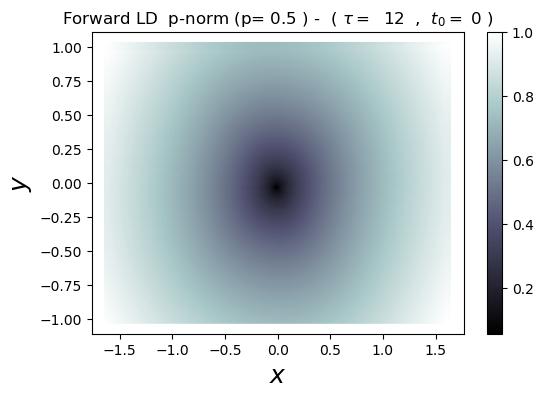

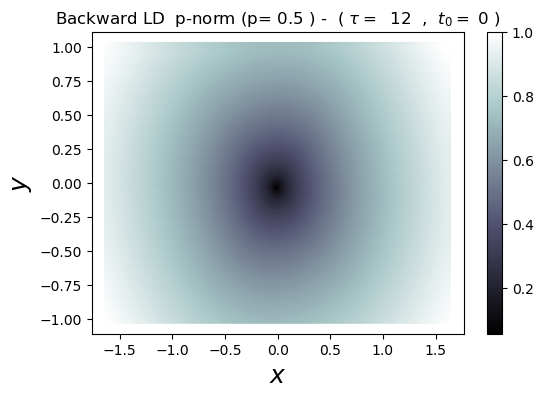

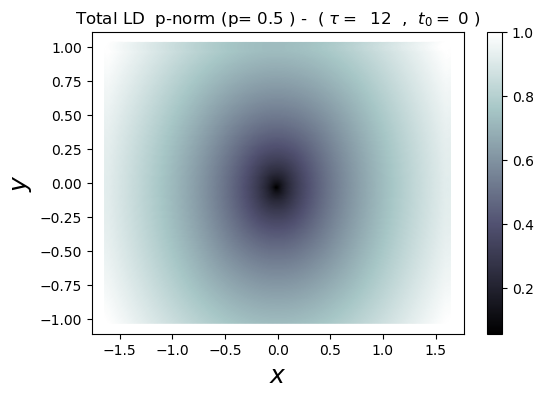

In [19]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamCenter1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

### Hamilton Saddle 

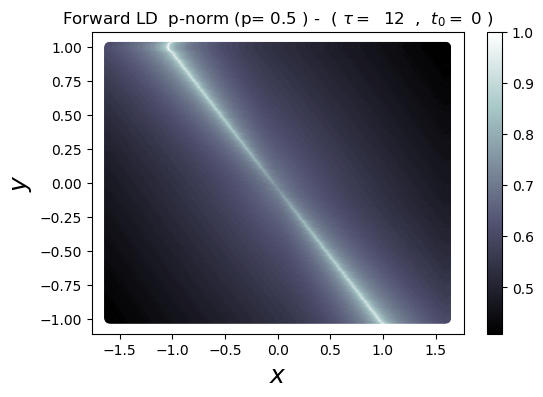

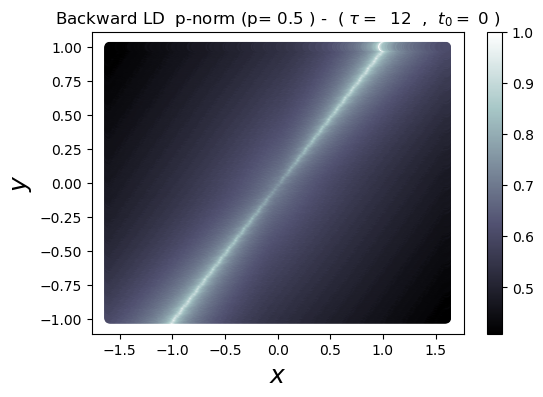

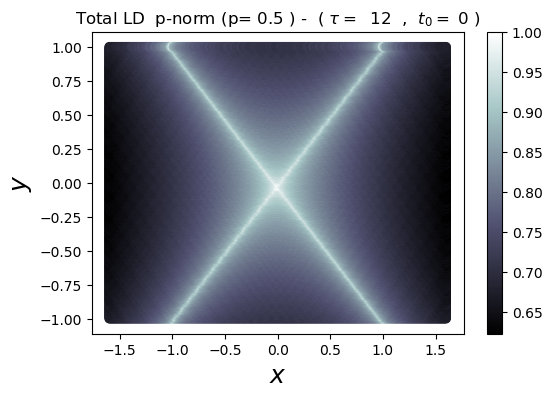

In [20]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSaddle1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

### Hamilton Duffing

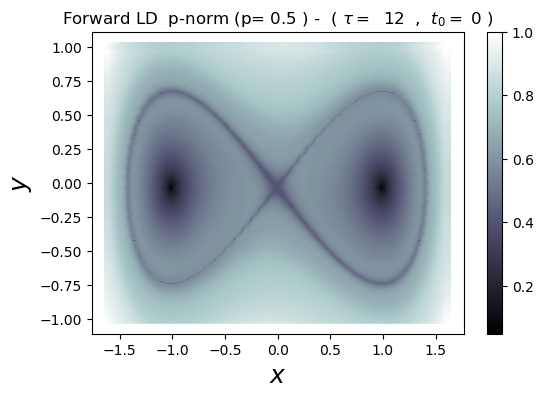

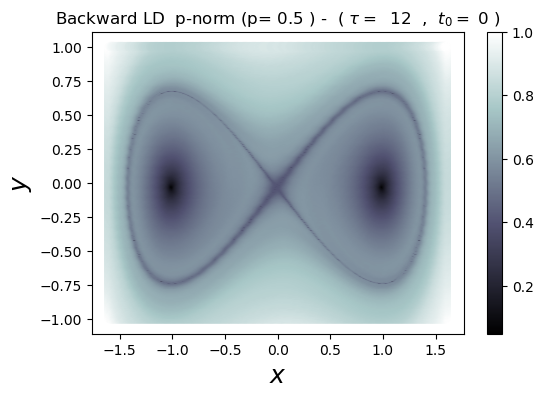

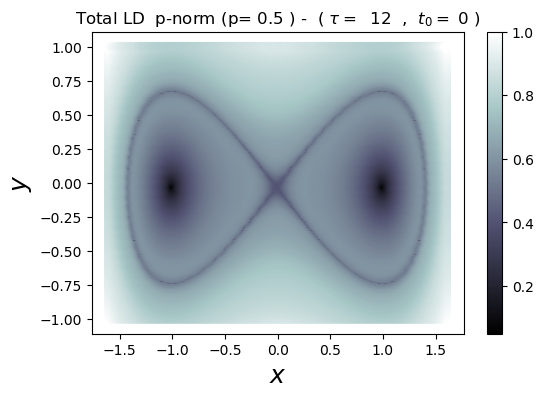

In [21]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamDuffing1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

### Hamilton Duffing: Forced

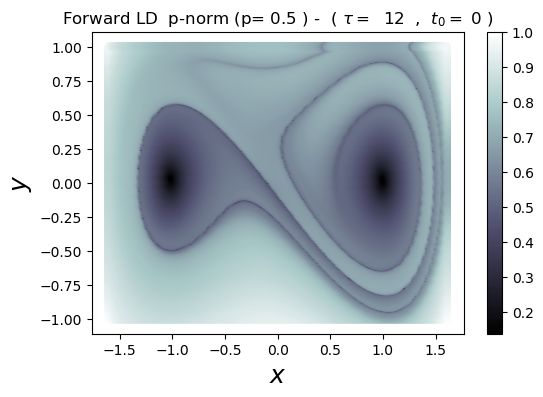

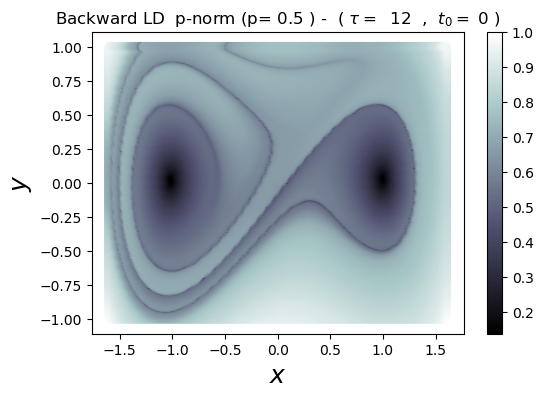

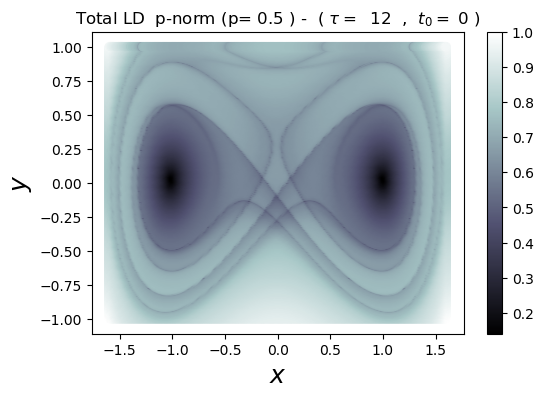

In [22]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = perturb_field(HamDuffing1D, forcing)

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

### Hamilton Saddle-Node

In [29]:
###################################
# Integration parameters
t0 = 0 # Initial time
tau = 8 # Time-interval length
dt = 0.1 # Timestep
###################################
# Lagrangian descriptor parameters
p_norm = 1/2 # p-value of Lp norm
###################################
# Grid parameters
x_min,x_max = [-1.5, 1] # Grid limits X-axis
y_min,y_max = [-1, 1] # Grid limits Y-axis
Nx, Ny = [300, 300] # Number of points per axis

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2 # Phase-space Dimension
shape = (Nx*Ny, dim) # Shape of array of grid-points
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1 
perturbation_params = [0.15, 0.5] # Amplitude & Frequency, periodic pertubation

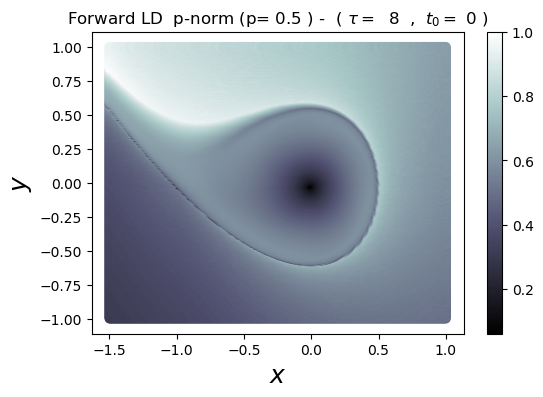

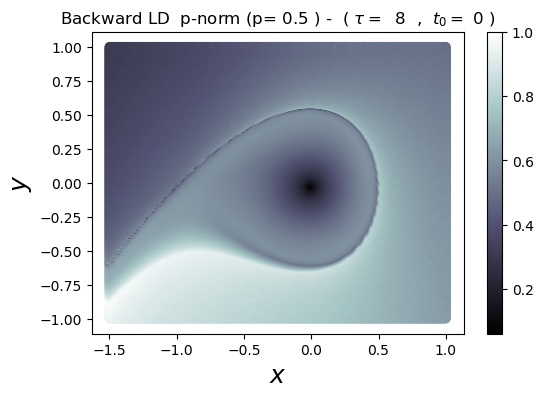

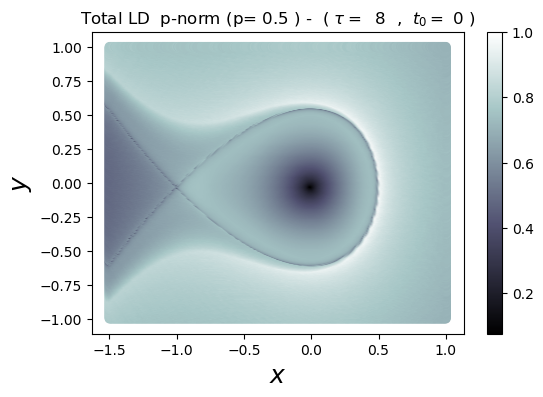

In [30]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSN1D

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

### Inverted Hamilton Duffing

In [31]:
###################################
# Integration parameters
t0 = 0 # Initial time
tau = 10 # Time-interval length
dt = 0.1 # Timestep
###################################
# Lagrangian descriptor parameters
p_norm = 1/2 # p-value of Lp norm
###################################
# Grid parameters
x_min,x_max = [-1.5, 1.5] # Grid limits X-axis
y_min,y_max = [-1, 1] # Grid limits Y-axis
Nx, Ny = [400, 400] # Number of points per axis

GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]

dim = 2 # Phase-space Dimension
shape = (Nx*Ny, dim) # Shape of array of grid-points
###################################
# Time Dependent Perurbation (for Hamilton Duffing)
flag_pert = 1 
perturbation_params = [0.15, 0.5] # Amplitude & Frequency, periodic pertubation

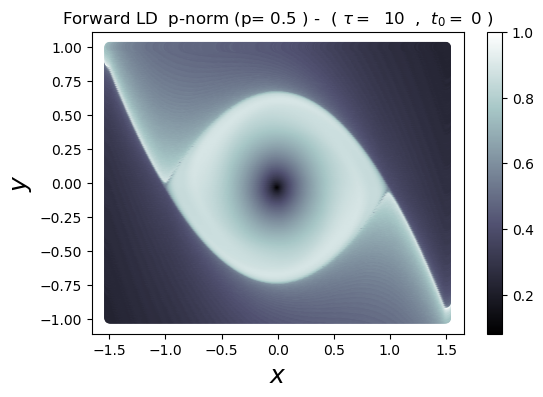

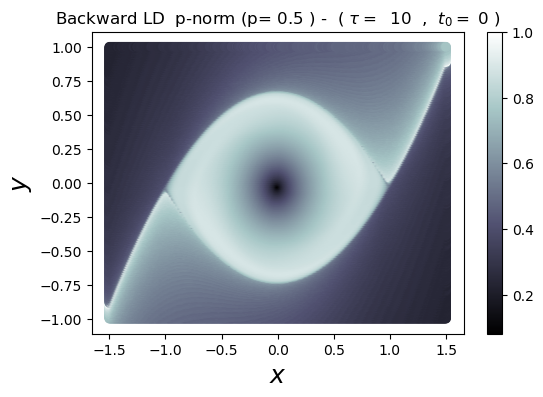

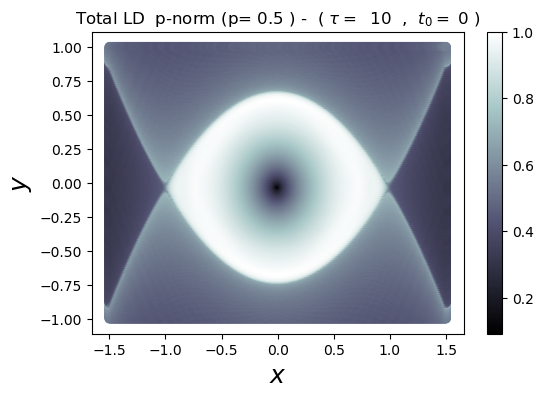

In [32]:
initial_conditions = generate_points(GRID_PARAMETERS)
vector_field = HamSN1D_inverted

time_interval = (t0, t0 + tau)
LD_forward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_forward, LD_type = 'forward')

time_interval = (t0, t0 - tau)
LD_backward = compute_lagrangian_descriptor(initial_conditions, vector_field, time_interval, dt)
draw_lagrangian_descriptor(LD_backward, LD_type = 'backward')

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, LD_type = 'total')

# Version: Implementation of Modules

* Examples of Implementation
    * `pydmd` https://github.com/mathLab/PyDMD 
    * `isambard` https://github.com/isambard-uob/isambard

## Modules

### `__init__.py`

In [9]:
%%writefile pylds/__init__.py
"""
PyLDs init
"""
__all__ = ['base', 'vector_fields', 'tools']

__title__ = "pylds"
__author__ = "Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido"
__copyright__ = "Copyright 2020, PyLDs contributors"
__license__ = "MIT"
__version__ = "0.0.0"
__mail__ = 'ba13026@my.bristol.ac.uk'
__maintainer__ = __author__
__status__ = "Development"

from .base import *
from .vector_fields import *
from .tools import *

Overwriting pylds/__init__.py


### `base.py`

In [10]:
%%writefile pylds/base.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp as integrator # RK45 (default)

def generate_points(GRID_PARAMETERS):
    """
    Returns a 1D array of all points from a meshgrid with dimensions and size defined by list of input parameters.
    
    Parameters
    ----------
    GRID_PARAMETERS : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
        
    Returns
    -------
    mesh : 1d numpy array
        points from meshgrid 
    """
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten()]) # 2D grid
    return mesh

def perturb_field(vector_field, perturbation):
    """
    Returns the vector field function with a linearly added pertubation
    Both input function should input (t, u), with t: float, and u: ndarray
    Also, the output of these funcs must be ndarrays of the same shape
    
    Parameters
    ----------
        vector_field: function
            unperturbed vector field
    
        perturbation: function
            forcing added to the vector field
    
    Returns
    -------
        perturbed function
    """
    return lambda t, u: vector_field(t, u) + perturbation(t, u)


def check_if_points_escape_box(u, box_BOUNDARIES):
    """
    Determine if points in phase-space u have scaped box with user-defined defined dimensions
    
    Parameters
    ----------
    u : array_like, shape(n, )
        points in phase-space to check if outside box boundaries
    
    box_BOUNDARIES : list of 2-tuples of floats
        box lower and upper limits along X and Y axes
        
    Returns
    -------
    u_indices : array_like, shape(n, )
        array of True/False bool values if points inside/outside the box
    """
    x, y = u.T
    # Escape condition
    box_x_min, box_x_max = box_BOUNDARIES[0]
    box_y_min, box_y_max = box_BOUNDARIES[1]
    u_indices = (x >= box_x_min) & (x <= box_x_max) & (y >= box_y_min) & (y <= box_y_max)
    
    return u_indices


def vector_field_flat(t, points, vector_field, box_BOUNDARIES):
    """
    Returns input vector field values (y0) for integrator as 1d array 
    obtained from applying vector_field to a set of initial conditions (points)
    
    Parameters
    ----------
    t : float
        time
    
    points : ndarray, shape(n,2)
    
    vector_field: function
    
    box_BOUNDARIES : list of 2-tuples, optional
        box boundaries for escape condition of variable time integration
        boundaries are infinite by default.
        
    Returns
    ------- 
    1d array
        y0 values for integrator 
    """
    u = points.reshape((-1,2))
    # Apply Escape condition
    u_inbox = check_if_points_escape_box(u, box_BOUNDARIES)
    # Define output vector field in combination with escape condition
    v = np.zeros(u.shape)
    v[u_inbox == True] = vector_field(t, u[u_inbox == True])
    
    return v.flatten()


def accumulate_lagrangian_descriptor(LD, points_initial, points_final, LD_PARAMETERS):
    """
    Returns the cumulative values of the LD function from trajectory segments in the evolution of a system.
    The trajectory segments run from points_initial to points_final.
    
    Parameters
    ----------
    LD : array_like, shape(n, )
        previous cummulative values of the LD function.
    
    points_initial : array_like, shape(n, )
        initial points in phase space in the evolution of trajectories.
        
    points_final : array_like, shape(n, )
        points ahead of initial points in the evolution of their dynamics.
        
    LD_PARAMETERS : list made of a 3-tuple and a float
        input parameters for LD computation
        3-tuple contains floats t_initial, t_final, dt (timestep)
        float is p-value of Lp-norm.

    Returns
    -------
    LD_accum : array_like, shape(n, )
        new cummulative values of the LD function from trajectory segment
    """
    t_initial, t_final, dt = LD_PARAMETERS[0]
    p_norm = LD_PARAMETERS[1]
    
    F = dt**(1 - p_norm) # Scaling factor from discrete integration
    points_difference = points_final - points_initial
    
    if p_norm <= 1: # p-norm LD
        LD_accum = LD + F*np.sum( np.abs(points_difference)**p_norm, axis=1)
    if p_norm == 2: # Arclength LD
        LD_accum = LD + np.linalg.norm(points_difference, axis=1)
    elif 1 < p_norm < 2: # Discrete arclength LD
        LD_accum = LD + np.sum( (points_difference**p_norm)**(1/p_norm), axis=1)
    
    return LD_accum


def extract_y_final(solution_object):
    """
    Returns the y-values from only at time `t + dt` from solution_object outputted by integrator.
    
    Parameters
    ----------
    solution_object: scipy.integrate.solve_ivp output object.
    
    Returns
    -------
    y_final: ndarray, shape (n, 2)
        extracted y-values
    """
    y_final = solution_object.y.T[-1]
    
    return y_final


def compute_lagrangian_descriptor(points_initial, vector_field, LD_PARAMETERS, box_BOUNDARIES = [(-np.infty, np.infty), (-np.infty, np.infty)]):
    """
    Returns the values of the LD function from integrated trajectories from initial conditions in phase-space.
    
    Parameters
    ----------
    points_initial : ndarray, shape(n, )
        initial conditions in phase-space.
    
    vector_field: function
        vector field over phase-space
        
    LD_PARAMETERS : list made of a 3-tuple and a float
        input parameters for LD computation
        3-tuple contains floats t_initial, t_final, dt (timestep)
        float is p-value of Lp-norm.
    
    box_BOUNDARIES : list of 2-tuples, optional
        box boundaries for escape condition of variable time integration
        boundaries are infinite by default.
    
    Returns
    -------
    LD : 1d array, shape (n, )
        array of computed LD values for all initial conditions.
    """
    f = vector_field_flat
    
    t_initial, t_final, dt = LD_PARAMETERS[0]
    p_norm = LD_PARAMETERS[1]
    
    if (t_final - t_initial)*dt < 0:
        dt = -dt
        
    shape = points_initial.shape
    LD = np.zeros(shape[0])  # Array to store forward LDs
    for t in np.arange(t_initial, t_final - dt, dt):
        ###################################
        # Inputs for integrator
        t_span = (t, t + dt)
        y0 = points_initial.flatten()
        ###################################
        # Outputs from integration
        solution_object = integrator(f, t_span, y0, args=(vector_field, box_BOUNDARIES))
        points_final = extract_y_final(solution_object)
        points_final = points_final.reshape(shape)
        ###################################
        # Compute LD
        LD = accumulate_lagrangian_descriptor(LD, points_initial, points_final, LD_PARAMETERS)
        ###################################
        # For next iteration
        points_initial = points_final
    
    return LD


__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido'
__status__ = 'Development'

Overwriting pylds/base.py


### `vector_fields.py`

In [4]:
%%writefile pylds/vector_fields.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np

def HamCenter1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Centre vector field at time t, for an array of points in phase-space.
    Number of model parameters: 1 . PARAMETERS = [omega]
    Functional form: v = (omega*y, - omega*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    omega, = PARAMETERS
    v = np.array([ omega * y, - omega * x]).T
    return v

def HamSaddle1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Saddle vector field at time t, for an array of points in phase-space.
    Number of model parameters: 1 . PARAMETERS = [lamda]
    Functional form: v = (lamda*y, - lamda*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space.
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t.
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda, = PARAMETERS
    v = np.array([ lamda * y, lamda * x]).T
    return v

def HamDuffing1D(t, u, PARAMETERS = [None]):
    """
    Returns perturbed 1D Hamilton-Duffing vector field at time t, for an array of points in phase-space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, x - x**3), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space.
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([y, x - x**3]).T
    return v

def HamSN1D(t, u, PARAMETERS = [None]):
    """
    Returns 1D Hamilton-Saddle-Node vector field at time t, for an array of points in phase-space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, -x -x**2), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space.
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([ y, -x -x**2]).T
    return v

def HamSN1D_inverted(t, u, PARAMETERS = [None]):
    """
    Returns 1D Inverted Hamilton-Duffing vector field at time t, for an array of points in phase-space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, - x + x**3), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space.
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    # perturbation = forcing(t, u, flag_pert, perturbation_params)
    # v = np.array([y, - x + x**3 + perturbation]).T
    v = np.array([y, - x + x**3]).T
    return v

def forcing(t, u, PARAMETERS = [1, 0.15, 0.5]):
    """
    Returns 1D Inverted Hamilton-Duffing vector field at time t, for an array of points in phase-space.
    Number of model parameters: 3. PARAMETERS = [perturbation_type, A, freq]
    Functional form: v = (, ), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase-space.
        
    u : array_like, shape(n,)
        points in phase-space to determine vector field at common time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase-space at time t
    """
    x, y = u.T
    perturbation = np.zeros(u.shape)
    
    # Perturbation parameters
    A, freq = perturbation_params # Amplitude and Frequency
    
    if perturbation_type == 1:
        perturbation = perturbation + np.array([0, A * np.sin(freq*t)])
    elif perturbation_type == 2:
        perturbation = perturbation + np.array([0, A * np.sech(t) * np.sin(freq*t)])
    elif perturbation_type == None:
        perturbation = perturbation
    
    return perturbation

__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido'
__status__ = 'Development'

Overwriting pylds/vector_fields.py


### `tools.py`

In [15]:
%%writefile pylds/tools.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np
import matplotlib.pyplot as plt

def draw_lagrangian_descriptor(LD, LD_type, GRID_PARAMETERS, LD_PARAMETERS, norm = True, colormap_name='bone'):
    """
    Returns ..

    Parameters
    ----------
    LD : ndarray, shape(n, )
        array of computed LD values for array of initial conditions
    
    LD_type : str
        type of LD to plot. Options: 'forward', 'backward', 'total'
    
    GRID_PARAMETERS : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
    
    LD_PARAMETERS : list made of a 3-tuple and a float
        input parameters for LD computation
        3-tuple contains floats t_initial, t_final, dt (timestep)
        float is p-value of Lp-norm
    
    norm : bool, optional
        normalise LD values by maximum
    
    colormap_name : str, optional
        valid name of matplotlib color-map for plot
    
    Returns
    -------
        scatter plot of LD function in phase-space 
    """
    x_min, x_max, Nx = GRID_PARAMETERS[0]
    y_min, y_max, Ny = GRID_PARAMETERS[1]
    
    t_initial, t_final, dt = LD_PARAMETERS[0]
    p_norm = LD_PARAMETERS[1]
    
    tau = t_final - t_initial
    
    LD = LD.reshape(Nx, Ny).T # Reshape 1D array
    if norm:
        LD = LD / LD.max()  # Scale LD output
    ################################### 
    # Plot LDs
    resolution = 100 # in dpi
    fig,ax = plt.subplots(1, 1, dpi = resolution)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    X, Y = np.meshgrid(points_x, points_y)  # Grid in phase-space
    
    #scatter = plt.scatter(X, Y, c = LD, cmap = colormap_name)
    contour = plt.contourf(X,Y,LD,cmap=colormap_name,levels=200)
    ###################################
    # Customise appearance
    if p_norm != 2:
        str_meth = ' '.join(['p-norm (p=',str(p_norm),') - '])
    else:
        str_meth = 'arclength - '
    
    if LD_type == 'forward':
        string_title = ['Forward LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t_initial),')']
    elif LD_type == 'backward':
        string_title = ['Backward LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t_initial),')']
    elif LD_type == 'total':
        string_title = ['Total LD ', str_meth, '(','$\\tau=$ ',str(tau),' , ','$t_0=$',str(t_initial),')']
    else: 
        string_title = ['']
        print('Incorrect "LD_type". Valid options: forward, backward, total. Plot will appear without title')
    string_title = ' '.join(string_title)
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('$x$', fontsize=18)
    ax.set_ylabel('$y$', fontsize=18)
    ax.set_aspect('auto')
    
    fig.colorbar(contour) # Add color bar
    #fig.colorbar(scatter) # Add color bar

    plt.show()
    
__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido'
__status__ = 'Development'

Overwriting pylds/tools.py


## Benchmark examples

In [2]:
import pylds

In [3]:
###################################
# Integration parameters
t0 = 0
tau = 12
dt = 0.1

# Lp-norm, p-value
p_norm = 1/2
###################################
# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

### Hamilton Centre

In [3]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

vector_field = pylds.vector_fields.HamCenter1D

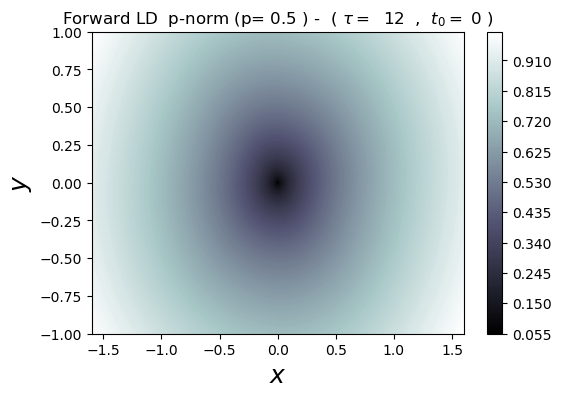

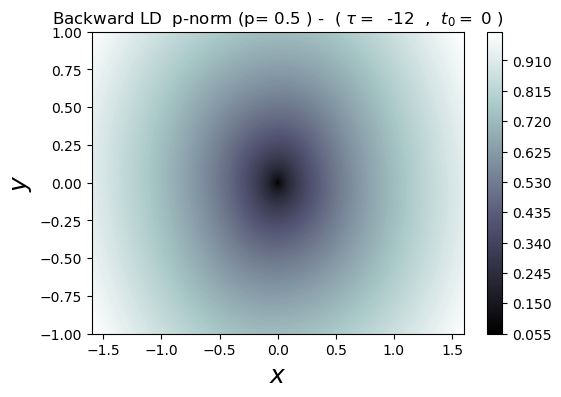

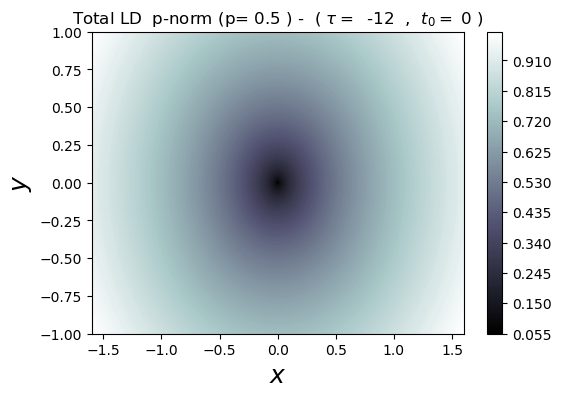

In [4]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS)

### Hamilton Saddle

In [5]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

vector_field = pylds.vector_fields.HamSaddle1D

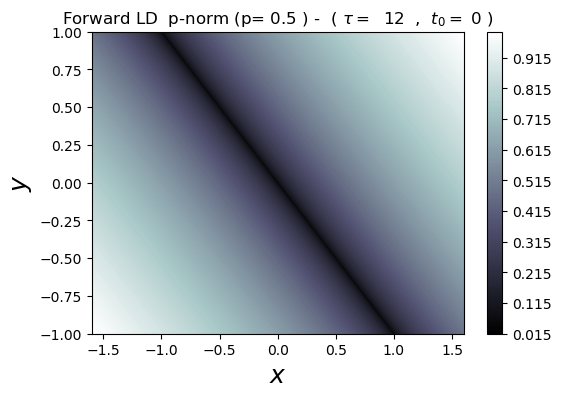

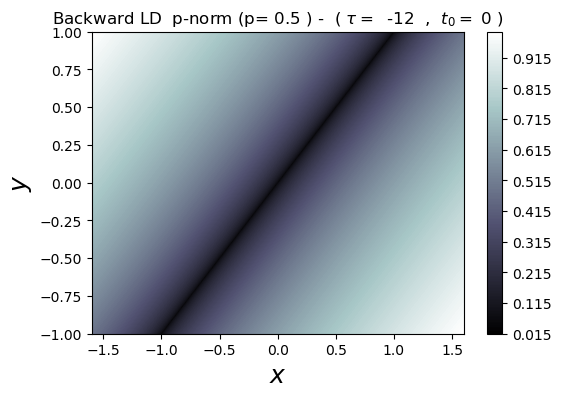

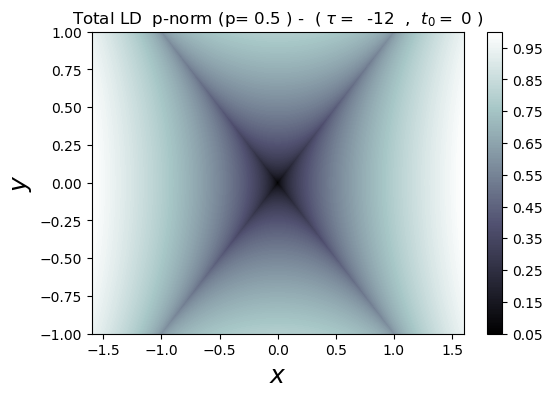

In [6]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS)

### Hamilton Duffing

In [7]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

vector_field = pylds.vector_fields.HamDuffing1D

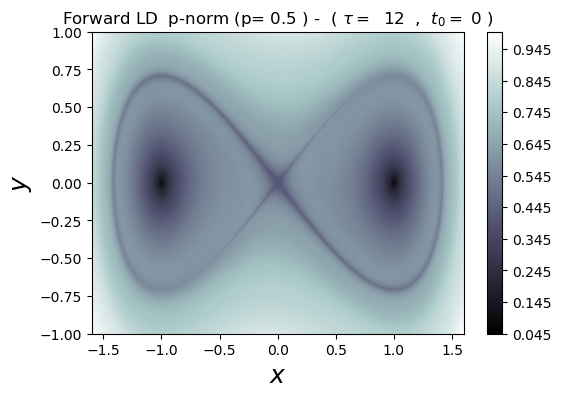

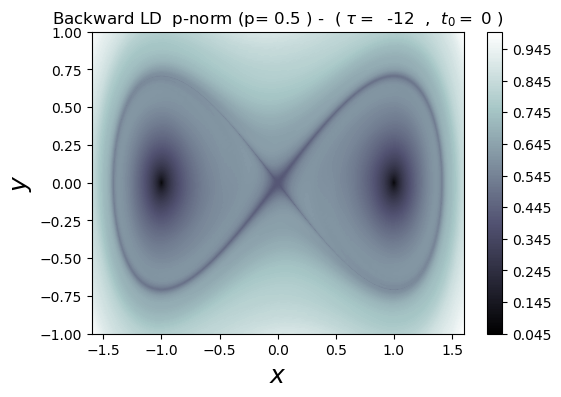

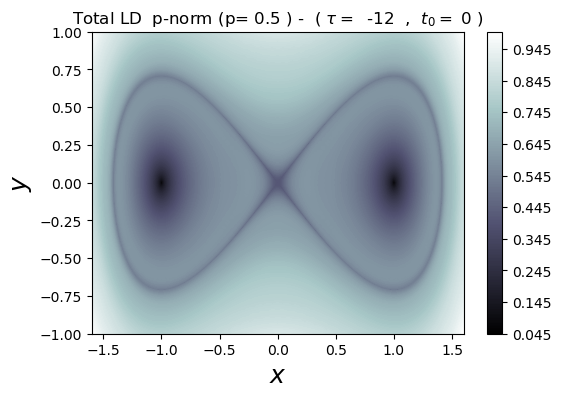

In [8]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS)

### Hamilton Duffing: Forced

In [9]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

perturbation = pylds.vector_fields.forcing
vector_field_original = pylds.vector_fields.HamDuffing1D
vector_field = pylds.base.perturb_field(vector_field_original, perturbation)

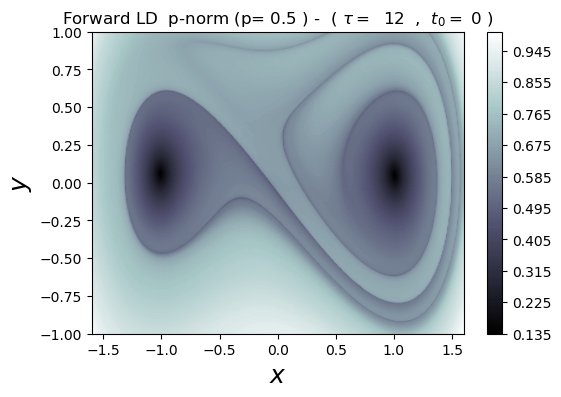

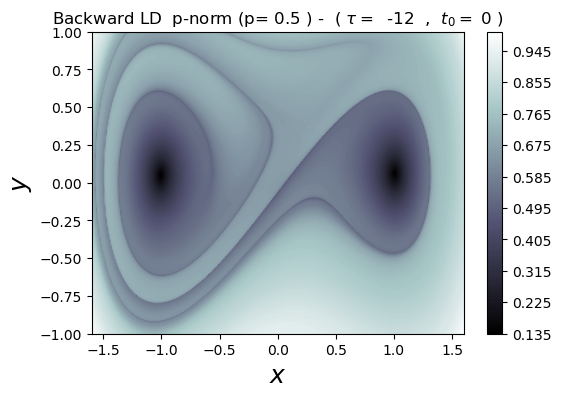

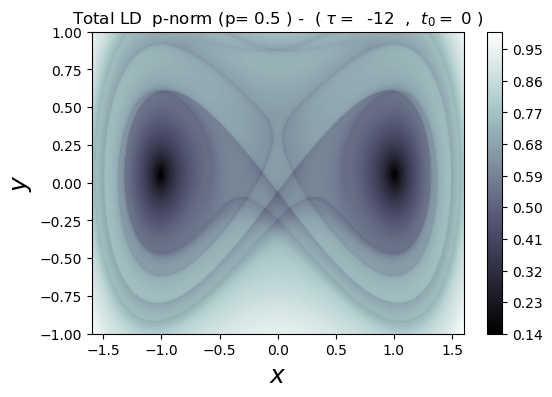

In [10]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS)

### Hamilton Saddle-Node

In [119]:
###################################
# Integration parameters
t0 = 0
tau = 8
dt = 0.1

# Lp-norm, p-value
p_norm = 1/2
###################################
# Mesh parameters
x_min,x_max = [-1.5, 1]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]
###################################
# Box boundaries for Variable Time Integration
box_x_min, box_x_max = [-6, 6]
box_y_min, box_y_max = [-6, 6]

In [120]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

vector_field = pylds.vector_fields.HamSN1D

box_BOUNDARIES = [(box_x_min, box_x_max), (box_y_min, box_y_max)]

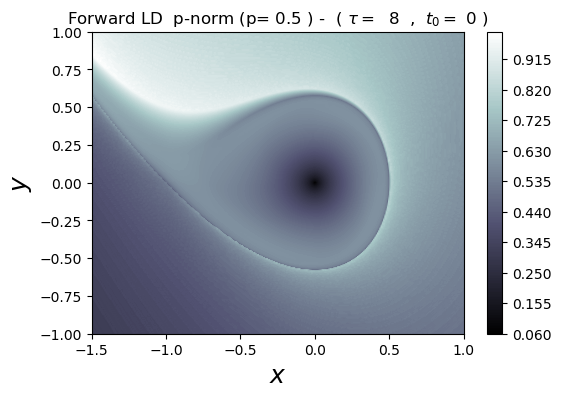

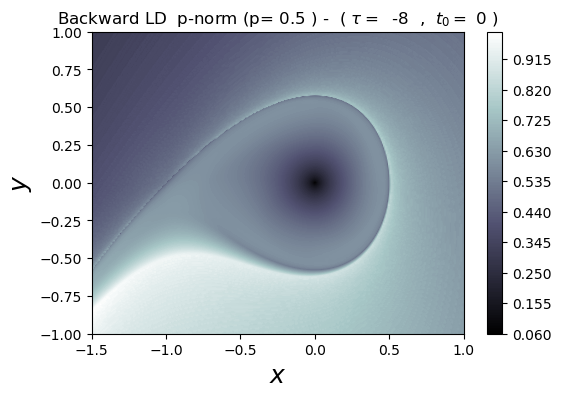

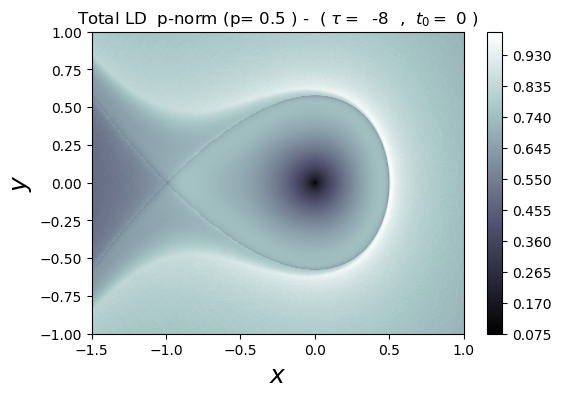

In [121]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS, box_BOUNDARIES)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS, box_BOUNDARIES)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS, box_BOUNDARIES)

### Inverted Hamilton Duffing

In [14]:
###################################
# Integration parameters
t0 = 0
tau = 10
dt = 0.1

# Lp-norm, p-value
p_norm = 1/2
###################################
# Mesh parameters
x_min,x_max = [-1.5, 1.5]
y_min,y_max = [-1, 1]
Nx, Ny = [400, 400]
###################################
# Box boundaries for Variable Time Integration
box_x_min, box_x_max = [-6, 6]
box_y_min, box_y_max = [-6, 6]

In [15]:
GRID_PARAMETERS = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
initial_conditions = pylds.base.generate_points(GRID_PARAMETERS)

vector_field = pylds.vector_fields.HamSN1D_inverted

box_BOUNDARIES = [(box_x_min, box_x_max), (box_y_min, box_y_max)]

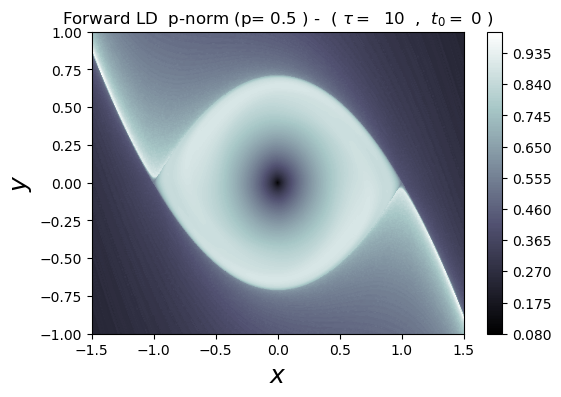

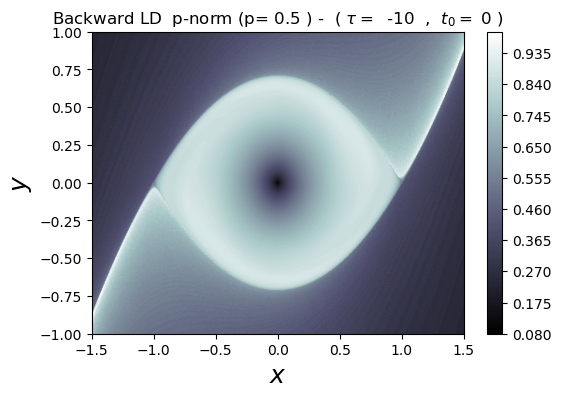

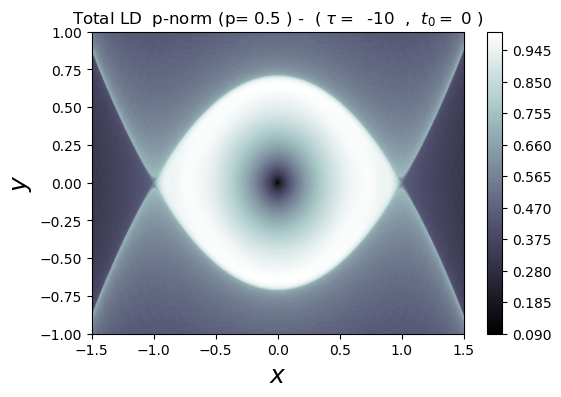

In [16]:
time_interval = (t0, t0 + tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_forward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS, box_BOUNDARIES)
pylds.tools.draw_lagrangian_descriptor(LD_forward, 'forward', GRID_PARAMETERS, LD_PARAMETERS)

time_interval = (t0, t0 - tau, dt)
LD_PARAMETERS = [time_interval, p_norm]
LD_backward = pylds.base.compute_lagrangian_descriptor(initial_conditions, vector_field, LD_PARAMETERS, box_BOUNDARIES)
pylds.tools.draw_lagrangian_descriptor(LD_backward, 'backward', GRID_PARAMETERS, LD_PARAMETERS)

LD_total = LD_forward + LD_backward
pylds.tools.draw_lagrangian_descriptor(LD_total, 'total', GRID_PARAMETERS, LD_PARAMETERS, box_BOUNDARIES)

# Feature: Gradient of Lagrangian Descriptors

In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

In [ ]:
x = np.linspace(x_min, x_max, Nx)
y = np.linspace(y_min, y_max, Ny)
X, Y = np.meshgrid(x, y)

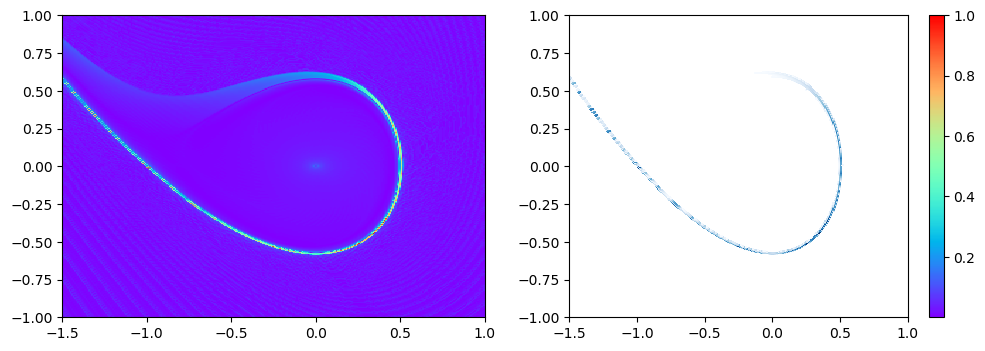

In [136]:
LD = LD_forward
gx,gy = np.gradient(LD.reshape((Nx, Ny)).T, 0.05, 0.05)
scalar = np.sqrt(gx**2 + gy**2)
Z = scalar/scalar.max()

# The color array can include masked values.
Zm = np.ma.masked_where(abs(Z) < 0.2, Z)

fig,ax = plt.subplots(1,2,figsize=(12,4),dpi=100)
p = ax[0].pcolormesh(X,Y,Z,cmap='rainbow')
ax[1].pcolormesh(X,Y,Zm,cmap='Blues')

plt.colorbar(p)
plt.show()

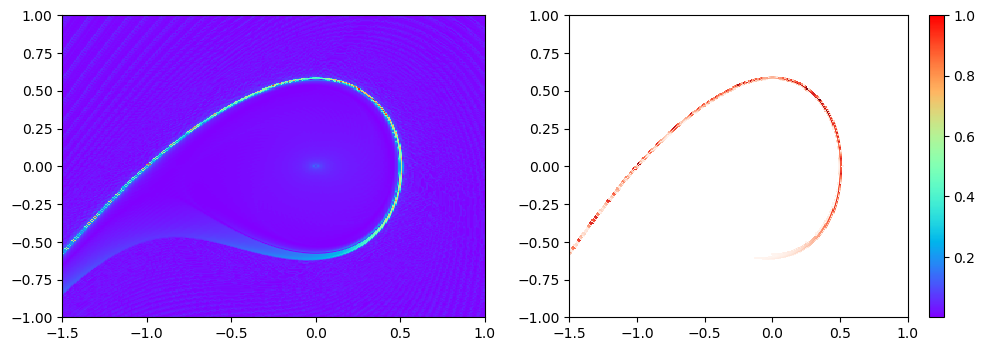

In [137]:
LD = LD_backward
gx,gy = np.gradient(LD.reshape((Nx, Ny)).T, 0.05, 0.05)
scalar = np.sqrt(gx**2 + gy**2)
Z = scalar/scalar.max()
# The color array can include masked values.
Zm = np.ma.masked_where(abs(Z) < 0.2, Z)

fig,ax = plt.subplots(1,2,figsize=(12,4),dpi=100)
p = ax[0].pcolormesh(X,Y,Z,cmap='rainbow')
ax[1].pcolormesh(X,Y,Zm,cmap='Reds')

plt.colorbar(p)
plt.show()

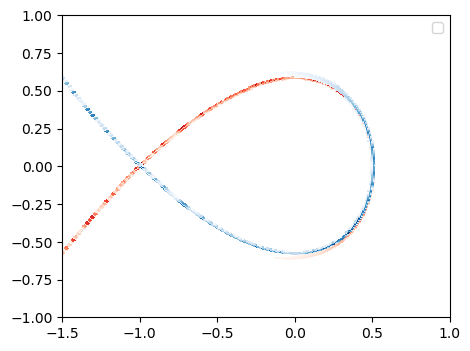

In [146]:
LD = LD_backward
gx,gy = np.gradient(LD.reshape((Nx, Ny)).T, 0.05, 0.05)
scalar = np.sqrt(gx**2 + gy**2)
Z = scalar/scalar.max()
# The color array can include masked values.
Zm_b = np.ma.masked_where(abs(Z) < 0.2, Z)

#############################

LD = LD_forward
gx,gy = np.gradient(LD.reshape((Nx, Ny)).T, 0.05, 0.05)
scalar = np.sqrt(gx**2 + gy**2)
Z = scalar/scalar.max()
# The color array can include masked values.
Zm_f = np.ma.masked_where(abs(Z) < 0.2, Z)

#############################

fig,ax = plt.subplots(1,1,figsize=(5,4),dpi=100)
p1 = ax.pcolormesh(X,Y,Zm_b,cmap='Reds',label='Unstable')
p2 = ax.pcolormesh(X,Y,Zm_f,cmap='Blues',label='Stable')

ax.legend((p1,p2),loc='best')
plt.show()

# Version: Enhacement in LD computation (Vladi)

ENHANCEMENTS

* Computation of LD function is performed directly using `solve_ivp`
* `for` loop replaced by one-line approach using the correct args of `solve_ivp`
* Implemented action-base LD to LD function  
* Polished appearance of LD plots

In [ ]:
%%writefile pylds/__initi__.py
"""
PyLDs init
"""
__all__ = ['base', 'vector_fields', 'tools']

__title__ = "pylds"
__author__ = "Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak"
__copyright__ = "Copyright 2020, PyLDs contributors"
__license__ = "MIT"
__version__ = "0.0.0"
__mail__ = 'ba13026@my.bristol.ac.uk'
__maintainer__ = __author__
__status__ = "Development"


from .base import *
from .vector_fields import *
from .tools import *


In [ ]:
%%writefile pylds/base.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

def generate_points(grid_parameters):
    """
    Returns a 1D array of all points from a on a uniform grid with dimensions and size defined by list of input parameters.
    An additional dimension initiallised with zeros is added for the calculation of Lagrangian Descriptors.
    
    Parameters
    ----------
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
        
    Returns
    -------
    mesh : 1d numpy array
        flattened array of initial conditions
    """
    x_min, x_max, Nx = grid_parameters[0]
    y_min, y_max, Ny = grid_parameters[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten(), np.zeros(Nx*Ny)]) # 2D grid + a zero column for LDs
    return mesh.flatten()

def perturb_field(vector_field, perturbation):
    """
    Returns the vector field function with a linearly added pertubation
    Both input function should input (t, u), with t: float, and u: ndarray
    Also, the output of these funcs must be ndarrays of the same shape
    
    Parameters
    ----------
        vector_field: function
            unperturbed vector field
    
        perturbation: function
            forcing added to the vector field
    
    Returns
    -------
        perturbed function
    """
    return lambda t, u: vector_field(t, u) + perturbation(t, u)


def check_if_points_escape_box(u, box_boundaries):
    """
    Determine if points in phase-space u have scaped box with user-defined defined dimensions
    
    Parameters
    ----------
    u : array_like, shape(n, )
        points in phase-space to check if outside box boundaries
    
    box_boundaries : list of 2-tuples of floats
        box lower and upper limits along X and Y axes
        
    Returns
    -------
    u_indices : array_like, shape(n, )
        array of True/False bool values if points inside/outside the box
    """
    x, y = u.T
    # Escape condition
    box_x_min, box_x_max = box_boundaries[0]
    box_y_min, box_y_max = box_boundaries[1]
    u_indices = (x >= box_x_min) & (x <= box_x_max) & (y >= box_y_min) & (y <= box_y_max)
    
    return u_indices

def lagrangian_descriptor(u, v, p_value = 0.5):
    """
    Vector field equation for Lagrangian descriptor.

    Parameters
    ----------
    v : ndarray, shape(n,2)
        Vector field at given point.
            
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.

    Returns
    -------
    LD : ndarray, shape(n,1)
        Vector field for Lagrangian descriptor dimension.
    """
    if p_value == 0:
        LD = np.abs(u[:,1]*v[:,0])
    elif p_value>0:
        LD = np.sum(np.abs(v)**p_value, axis=1)
    else:
        LD = np.zeros(len(u[:,0]))
    return LD

def vector_field_flat(t, points, vector_field, p_value, box_boundaries):
    """
    Returns vector field values for integration of flattened input array.
    
    Parameters
    ----------
    t : float
        time
    
    points : ndarray, shape(n,3)
    
    vector_field: function
        User defined vector field.
    
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.
    
    box_boundaries : list of 2-tuples, optional
        box boundaries for escape condition of variable time integration
        boundaries are infinite by default.
        
    Returns
    ------- 
    1d array
        y0 values for integrator 
    """
    u = points.reshape((-1,3))
    u = u[:,:-1] #remove LD values
    # Apply Escape condition
    u_inbox = check_if_points_escape_box(u, box_boundaries)
    # Define output vector field in combination with escape condition
    v = np.zeros(u.shape)
    v[u_inbox == True] = vector_field(t, u[u_inbox == True])
    # Calculate LD vector field
    LD_vec = np.zeros(len(u))
    LD_vec [u_inbox == True] = lagrangian_descriptor(u[u_inbox == True], v[u_inbox == True], p_value)
    # Add LD
    v_out=np.column_stack((v, LD_vec))
    return v_out.flatten()

def compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value=0.5, box_boundaries = [(-np.infty, np.infty), (-np.infty, np.infty)]):
    """
    Returns the values of the LD function from integrated trajectories from initial conditions in phase-space.
    
    Parameters
    ----------
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
    
    vector_field: function
        vector field over phase-space
        
    tau : float
        Upper limit of integration.
        
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.
    
    box_boundaries : list of 2-tuples, optional
        Box boundaries for escape condition of variable time integration.
        Boundaries are infinite by default.
    
    Returns
    -------
    LD : ndarray, shape (Nx, Ny)
        Array of computed Lagrangian descriptor values for all initial conditions.
    """
    
    f = lambda x, y: vector_field_flat(x, y, vector_field, p_value, box_boundaries)
    y0 = generate_points(grid_parameters)
    
    solution = solve_ivp(f, [0,tau], y0, t_eval=[tau], rtol=1.0e-4)
    
    n=len(grid_parameters)
    LD_values = solution.y[n::n+1] #values corresponding to LD
    
    Nx=grid_parameters[0][2]
    Ny=grid_parameters[1][2]
    LD=np.abs(LD_values).reshape((Nx,Ny)).T #reshape to 2D array
    if p_value<=1:
        return LD
    else:
        return LD**(1/p_value)

__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

In [ ]:
%%writefile pylds/tools.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np
import matplotlib.pyplot as plt

def draw_lagrangian_descriptor(LD, LD_type, grid_parameters, tau, p_value, norm = True, colormap_name='bone'):
    """
    Returns ..

    Parameters
    ----------
    LD : ndarray, shape(n, )
        array of computed LD values for array of initial conditions
    
    LD_type : str
        type of LD to plot. Options: 'forward', 'backward', 'total'
    
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
    
    tau : float
        Upper limit of integration.
        
    p_value : float
        Exponent in Lagrangian descriptor definition.
    
    norm : bool, optional
        normalise LD values by maximum
    
    colormap_name : str, optional
        valid name of matplotlib color-map for plot
    
    Returns
    -------
        scatter plot of LD function in phase-space 
    """
    x_min, x_max, Nx = grid_parameters[0]
    y_min, y_max, Ny = grid_parameters[1]
        
    if norm:
        LD = LD / LD.max()  # Scale LD output
    
    # Plot LDs
    fig,ax = plt.subplots(1, 1, dpi = 100)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    
    contour = plt.contourf(points_x,points_y,LD,cmap=colormap_name,levels=200)
    
    # Customise appearance
    if p_value == 2:
        str_method = 'arclength - '
    elif p_value >= 1:
        str_method = r'p-norm $(p={})$'.format(p_value)
    elif p_value == 0:        
        str_method = 'action-based'
    elif p_value < 1:
        str_method = r'LD$_p$ $(p={})$'.format(p_value)
    
    t_final=abs(tau)
    if LD_type == 'forward':
        string_title = r'Forward LD {}, $\tau={}$'.format(str_method,t_final)
    elif LD_type == 'backward':
        string_title = r'Backward LD {}, $\tau={}$'.format(str_method,t_final)
    elif LD_type == 'total':
        string_title = r'Total LD {}, $\tau={}$'.format(str_method,t_final)
    else: 
        string_title = ''
        print('Incorrect "LD_type". Valid options: forward, backward, total. Plot will appear without title')
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('$x$', fontsize=18)
    ax.set_ylabel('$y$', fontsize=18)
    
    fig.colorbar(contour)

    plt.show()
    
__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

In [ ]:
%%writefile pylds/vector_fields.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np

def HamCenter1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Centre vector field at time t, for an array of points in phase space.
    Number of model parameters: 1 . PARAMETERS = [omega]
    Functional form: v = (omega*y, - omega*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    omega, = PARAMETERS
    v = np.array([ omega * y, - omega * x]).T
    return v

def HamSaddle1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Saddle vector field at time t, for an array of points in phase space.
    Number of model parameters: 1 . PARAMETERS = [lamda]
    Functional form: v = (lamda*y, - lamda*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda, = PARAMETERS
    v = np.array([ lamda * y, lamda * x]).T
    return v

def Duffing1D(t, u, PARAMETERS = [None]):
    """
    Returns 1D vector field of the Duffing oscillator, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, x - x**3), with u = (x, y)
    
    Parameters
    ----------  
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        Points in phase space.
        
    PARAMETERS : list of floats
        Vector field parameters.
    
    Returns
    -------
    v : array_like, shape(n,)
        Vector field corresponding to points u, in phase space at time t.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([y, x - x**3]).T
    return v

def Duffing1D_inverted(t, u, PARAMETERS = [None]):
    """
    Returns 1D vector field of the inverted Duffing oscillator at time t, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, - x + x**3), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    # perturbation = forcing(t, u, flag_pert, perturbation_params)
    # v = np.array([y, - x + x**3 + perturbation]).T
    v = np.array([y, - x + x**3]).T
    return v

def HamSN1D(t, u, PARAMETERS = [None]):
    """
    Returns 1D Hamilton-Saddle-Node vector field at time t, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, -x -x**2), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([ y, -x -x**2]).T
    return v

def forcing(t, u, perturbation_params = [1, 0.15, 0.5]):
    """
    Returns vector field for a perturbation at time t, for an array of points in phase space.
    Number of model parameters: 3. perturbation_params = [perturbation_type, amplitude, frequency]
    Functional form: v = (, ), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    perturbation_params : list of floats, [perturbation_type, amplitude, frequency]
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    perturbation = np.zeros(u.shape)
    
    # Perturbation parameters
    perturbation_type, amplitude, freq = perturbation_params
    
    if perturbation_type == 1:
        perturbation = perturbation + np.array([0, amplitude * np.sin(freq*t)])
    elif perturbation_type == 2:
        perturbation = perturbation + np.array([0, amplitude * np.sech(t) * np.sin(freq*t)])
    
    return perturbation

__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

# Proof of concept _High-dimensional meshgrid generator_

__FUTURE ENHANCEMENTS__ Object-based version

__NOTE__ By default, only momemntum coordinates are left to be determined using energy conservation. So, the current approach only applies to autonomous systems.

__NOTE__ LD time-dependent

* Different stragety for initiating the grid.
* Can use energy conservation, but difficult to interpret.
* Need further conditions that have a physicall meaning.
* No general way of doing it -  may have issues with the intepretarion

## Input parameters

In [7]:
import pylds
import sys
import itertools
import numpy as np
from operator import itemgetter

Overall set-up parameters

In [8]:
###################################
# Integration parameters
t0 = 0
tau = 50
dt = 0.05

# Lp-norm, p-value
p_norm = 1/2
###################################
# Mesh visualisation slice parameters
H0 = 1/12 # Energy
ax1_min,ax1_max = [-0.45, 0.55]
ax2_min,ax2_max = [-0.45, 0.45]
N1, N2 = [300, 300]
###################################
# Miscelaneous parameters
dof_fixed = [0,1,0,0] # Variable ordering (x1 x2 y1 y2)
dof_fixed_values = [0] # This can also be an array of values

dof_slice = [1,0,1,0] 

momentum_sign = 1 # Direction of momentum that defines the slice - (1) positive / (-1) negative

Potential energy function for high-dimensional LDs. This will be complementary to the vector field. 

In [9]:
def PES_HenonHeilles(x, PARAMETERS = [1,1,1]):
    # Function parameter
    w0, w1, delta = PARAMETERS
    
    # Potential energy function
    V = (1/2) * w0**2 * x.T[0]**2 + (1/2) * w1**2 * x.T[1]**2 + x.T[0]**2 * x.T[1] - (1/3) * delta * x.T[1]**3
    return V

In [10]:
potential_energy = PES_HenonHeilles

## Function input variables

In [11]:
grid_parameters = [[ax1_min, ax1_max, N1],[ax2_min, ax2_max, N2]]

In [12]:
extra_grid_parameters = {
        'dof_slice' : dof_slice,
        'dof_fixed' : [dof_fixed, dof_fixed_values],
        'dof_constant_energy' : momentum_sign
        'potential_energy': potential_energy
    }

## Supplementary functions and tests

In [41]:
def get_points_dof_remaining(phase_space_axes, H0, potential_energy):
    N_dof = len(phase_space_axes)
    phase_space_x_points = np.transpose(phase_space_axes[:int(N_dof/2)])
    phase_space_y_points = np.transpose(phase_space_axes[int(N_dof/2):])
    V = potential_energy(phase_space_x_points)
    points_dof_remaining = momentum_sign * np.sqrt( 2*(H0 - V) - (phase_space_y_points**2).sum(axis=1) )
    return points_dof_remaining

For definition of grid axes definition

In [13]:
# Determine Number of DoF
N_dof = len(extra_grid_parameters['dof_slice'])

# Check Number of DoF is even
if N_dof%2 != 0:
    print("Number of DoF not even. Check your extra grid parameters")
    sys.exit()

# DoF for Energy conservation
dof_remaining = 1 - (np.array(dof_fixed) + np.array(dof_slice))

# Number of DoF for Energy conservation
if list(dof_remaining).count(1) > 1:
    print("ERROR: More than one remaing DoF. Cannot use Energy conservation to define high-dim grid.")
    sys.exit()

In [14]:
pass_axis_parameters = lambda parameters: np.linspace(*parameters)
points_slice_axes = list(map(pass_axis_parameters, grid_parameters))

slice_mesh = np.meshgrid(*points_slice_axes)

dof_slice_axes = [axis.flatten() for axis in slice_mesh]

# Axes from fixed axes 
dof_fixed_axes = dof_fixed_values

In [15]:
N_points_slice = np.prod(list( map(itemgetter(-1), grid_parameters)) )
phase_space_axes = {}

k=0
for i in range(N_dof):
    if dof_slice[i] == 1:
        phase_space_axes[i] = dof_slice_axes[k]
        k+=1

k=0
for i in range(N_dof):
    if dof_fixed[i] == 1:
        phase_space_axes[i] = dof_fixed_axes[k]*np.zeros(N_points_slice)
        k+=1

idx_dof_H0 = list(set(range(N_dof))-set(phase_space_axes.keys()))[0]
phase_space_axes[idx_dof_H0] = np.zeros(N_points_slice)

In [40]:
phase_space_axes = [phase_space_axes[i] for i in range(int(N_dof))]

In [44]:
points_dof_remaining = get_points_dof_remaining(phase_space_axes, H0, potential_energy)
phase_space_axes[idx_dof_H0] = np.nan_to_num(points_dof_remaining)
lagrangian_descriptor_axis = [np.zeros(N_points_slice)]
mesh = np.transpose(phase_space_axes + lagrangian_descriptor_axis)

/Users/ba13026/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in sqrt
  


In [45]:
mesh

array([[-0.45      ,  0.        , -0.45      ,  0.        ,  0.        ],
       [-0.44665552,  0.        , -0.45      ,  0.        ,  0.        ],
       [-0.44331104,  0.        , -0.45      ,  0.        ,  0.        ],
       ...,
       [ 0.54331104,  0.        ,  0.45      ,  0.        ,  0.        ],
       [ 0.54665552,  0.        ,  0.45      ,  0.        ,  0.        ],
       [ 0.55      ,  0.        ,  0.45      ,  0.        ,  0.        ]])

## Comparison between implementations

### Original version: 1DoF systems

In [ ]:
def generate_points(grid_parameters):
    """
    Returns a 1D array of all points from a on a uniform grid with dimensions and size defined by list of input parameters.
    An additional dimension initiallised with zeros is added for the calculation of Lagrangian Descriptors.
    
    Parameters
    ----------
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
        
    Returns
    -------
    mesh : 1d numpy array
        flattened array of initial conditions
    """
    x_min, x_max, Nx = grid_parameters[0]
    y_min, y_max, Ny = grid_parameters[1]
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)    
    Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
    mesh = np.transpose([X.flatten(), Y.flatten(), np.zeros(Nx*Ny)]) # 2D grid + a zero column for LDs
    return mesh.flatten()

### New (scalable) version: Autonomous N-DoF systems

#### Implementation

In [1]:
import pylds
import sys
import itertools
import numpy as np
from operator import itemgetter

In [2]:
def energy_conservation_condition(phase_space_axes, H0, potential_energy, momentum_sign):
    N_dof = len(phase_space_axes)
    phase_space_positions = np.transpose(phase_space_axes[int(N_dof/2):])
    phase_space_momenta = np.transpose(phase_space_axes[:int(N_dof/2)])
    V = potential_energy(phase_space_positions)
    points_dof_remaining = momentum_sign * \
        np.sqrt(2*(H0 - V) - (phase_space_momenta**2).sum(axis=1))
    return np.nan_to_num(points_dof_remaining)

Momenta normalised by mass

In [11]:
def generate_points(grid_parameters):
    """
    Returns a 1D array of all points from a on a uniform grid with dimensions and size defined by list of input parameters.
    An additional dimension initiallised with zeros is added for the calculation of Lagrangian Descriptors.

    Parameters
    ----------
    slice_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis

    Returns
    -------
    mesh : 1d numpy array
        flattened array of initial conditions
    """
    if type(grid_parameters) == dict:
        # Unpack extra grid parameters
        slice_parameters = grid_parameters['slice_parameters']
        dof_slice = grid_parameters['dof_slice']
        dof_fixed, dof_fixed_values = grid_parameters['dof_fixed']
        momentum_sign = grid_parameters['momentum_sign']
        potential_energy = grid_parameters['potential_energy']

        N_dof = len(dof_slice)  # Total number of DoF
        # Check N DoF is even.
        if N_dof % 2 != 0:
            error_mssg = ("ERROR: Number of DoF not even. ",
                          "Check your extra grid parameters")
            print(error_mssg)
            sys.exit()
        # Determine number of DoF for Energy conservation.
        # There must be only one.
        dof_remaining = 1 - (np.array(dof_fixed) + np.array(dof_slice))
        if list(dof_remaining).count(1) > 1:
            error_mssg = ("ERROR: More than one remaing DoF. ",
                          "Cannot use Energy conservation to define high-dim grid.")
            print(error_mssg)
            sys.exit()

        # Axes of visualisation slice
        def pass_axis_parameters(parameters): return np.linspace(*parameters)
        points_slice_axes = list(map(pass_axis_parameters, slice_parameters))
        slice_mesh = np.meshgrid(*points_slice_axes)
        dof_slice_axes = [axis.flatten() for axis in slice_mesh]

        # Axes of fixed DoF
        dof_fixed_axes = dof_fixed_values

        N_points_slice = np.prod(list(map(itemgetter(-1), slice_parameters)))
        phase_space_axes = {}

        # Define and sort axes in phase space
        k = 0
        for i in range(N_dof):
            if dof_slice[i] == 1:
                phase_space_axes[i] = dof_slice_axes[k]
                k += 1
        k = 0
        for i in range(N_dof):
            if dof_fixed[i] == 1:
                phase_space_axes[i] = dof_fixed_axes[k] * \
                    np.zeros(N_points_slice)
                k += 1

        # Set axis to be determined by energy conservation
        idx_dof_H0 = list(set(range(N_dof))-set(phase_space_axes.keys()))[0]
        phase_space_axes[idx_dof_H0] = np.zeros(N_points_slice)

        # List of all phase space axes
        phase_space_axes = [phase_space_axes[i] for i in range(int(N_dof))]

        # Determine undefined axis via energy conservation
        phase_space_axes[idx_dof_H0] = energy_conservation_condition(
            phase_space_axes, H0, potential_energy, momentum_sign)

        # Return array of mesh points for integrator
        lagrangian_descriptor_axis = [np.zeros(N_points_slice)]
        mesh = np.transpose(phase_space_axes + lagrangian_descriptor_axis)

        return mesh.flatten()
    else:
        if len(grid_parameters) > 2:
            error_mssg = ("ERROR: grid_parameters must be a list for 2D slices for 1DoF systems. ",
                          "Provide a dictionary for a higher-dimensional systems.")
        else:
            x_min, x_max, Nx = grid_parameters[0]
            y_min, y_max, Ny = grid_parameters[1]
            points_x = np.linspace(x_min, x_max, Nx)
            points_y = np.linspace(y_min, y_max, Ny)
            Y, X = np.meshgrid(points_y, points_x)  # Grid in phase-space
            # 2D grid + a zero column for LDs
            mesh = np.transpose([X.flatten(), Y.flatten(), np.zeros(Nx*Ny)])
            return mesh.flatten()

#### Test

Standard input parameters

In [12]:
###################################
# Integration parameters
t0 = 0
tau = 50
dt = 0.05

# Lp-norm, p-value
p_norm = 1/2
###################################
# Mesh visualisation slice parameters
H0 = 1/12 # Energy
ax1_min,ax1_max = [-0.45, 0.55]
ax2_min,ax2_max = [-0.45, 0.45]
N1, N2 = [300, 300]
###################################
# Miscellaneous grid parameters
dof_fixed = [0,1,0,0] # Variable ordering (x1 x2 y1 y2)
dof_fixed_values = [0] # This can also be an array of values
dof_slice = [1,0,1,0] # Visualisation slice
momentum_sign = 1 # Direction of momentum that defines the slice - (1) positive / (-1) negative

Potential energy function

In [13]:
def PES_HenonHeilles(x, PARAMETERS = [1,1,1]):
    # Function parameter
    w0, w1, delta = PARAMETERS
    
    # Potential energy function
    V = (1/2) * w0**2 * x.T[0]**2 + (1/2) * w1**2 * x.T[1]**2 + x.T[0]**2 * x.T[1] - (1/3) * delta * x.T[1]**3
    return V

In [14]:
potential_energy = PES_HenonHeilles

Define all input variables meshgrid generation

In [15]:
slice_parameters = [[ax1_min, ax1_max, N1],[ax2_min, ax2_max, N2]]

In [16]:
grid_parameters = {
        'slice_parameters' : slice_parameters,
        'dof_slice' : dof_slice,
        'dof_fixed' : [dof_fixed, dof_fixed_values],
        'momentum_sign' : momentum_sign,
        'potential_energy': potential_energy
    }

Execute code and see output

__TEST 1__ Pass `grid_parameters` as a dictionary. A dictionary has to be employed to extract all necessary information to work out a high-dimensional grid in phase space when N DoF > 1

In [17]:
points = generate_points(grid_parameters)
print(points, type(grid_parameters), len(points))

[-0.45  0.   -0.45 ...  0.45  0.    0.  ] <class 'dict'> 450000


/Users/ba13026/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in sqrt
  import sys


__TEST 2__ Pass `grid_parameters` as a 2D list. Here the slice for visialisation matches the grid in phase space to work out Lagrangian descriptors for 1DoF systems only (First implementation)

In [18]:
points = generate_points(slice_parameters)
print(points, type(slice_parameters), len(points))

[-0.45 -0.45  0.   ...  0.55  0.45  0.  ] <class 'list'> 270000


# Version: Extension to High Dimensional Systems

__FUTURE ENHANCEMENTS__ Object-based version

__NOTE__ By default, only momemntum coordinates are left to be determined using energy conservation. So, the current approach only applies to autonomous systems.

__NOTE__ LD time-dependent

* Different stragety for initiating the grid.
* Can use energy conservation, but difficult to interpret.
* Need further conditions that have a physicall meaning.
* No general way of doing it -  may have issues with the intepretarion

## Modules

### `__init__.py`

In [25]:
%%writefile pylds/__init__.py
"""
PyLDs init
"""
__all__ = ['base', 'vector_fields', 'tools']

__title__ = "pylds"
__author__ = "Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak"
__copyright__ = "Copyright 2020, PyLDs contributors"
__license__ = "MIT"
__version__ = "0.0.0"
__mail__ = 'ba13026@my.bristol.ac.uk'
__maintainer__ = __author__
__status__ = "Development"

from .base import *
from .vector_fields import *
from .tools import *

Overwriting pylds/__init__.py


### `base.py`

In [5]:
%%writefile pylds/base.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""

import sys
import numpy as np
import numpy.ma as ma
from operator import itemgetter
from scipy.integrate import solve_ivp
from functools import reduce

def energy_conservation_condition(phase_space_axes, H0, potential_energy, momentum_sign):
    N_dim = len(phase_space_axes)
    phase_space_positions = np.transpose(phase_space_axes[:int(N_dim/2)])
    phase_space_momenta = np.transpose(phase_space_axes[int(N_dim/2):])
    V = potential_energy(phase_space_positions)
    points_dof_remaining = momentum_sign * \
        np.sqrt(2*(H0 - V) - (phase_space_momenta**2).sum(axis=1))
    return points_dof_remaining

def generate_points(grid_parameters):
    """
    Returns a 1D array of all points from a on a uniform grid with dimensions and size defined by list of input parameters.
    An additional dimension initiallised with zeros is added for the calculation of Lagrangian Descriptors.

    Parameters
    ----------
    slice_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis

    Returns
    -------
    mesh : 1d numpy array
        flattened array of initial conditions
    """
    if type(grid_parameters) == dict:
        # Unpack extra grid parameters
        slice_parameters = grid_parameters['slice_parameters']
        dof_slice = grid_parameters['dof_slice']
        dof_fixed, dof_fixed_values = grid_parameters['dof_fixed']
        momentum_sign = grid_parameters['momentum_sign']
        potential_energy = grid_parameters['potential_energy']
        H0 = grid_parameters['energy_level']

        N_dim = len(dof_slice)  # Total number of DoF
        # Check N DoF is even.
        if N_dim % 2 != 0:
            error_mssg = ("ERROR: Number of DoF not even. ",
                          "Check your extra grid parameters")
            print(error_mssg)
            sys.exit()
        # Determine number of DoF for Energy conservation.
        # There must be only one.
        dof_remaining = 1 - (np.array(dof_fixed) + np.array(dof_slice))
        if list(dof_remaining).count(1) > 1:
            error_mssg = ("ERROR: More than one remaing DoF. ",
                          "Cannot use Energy conservation to define high-dim grid.")
            print(error_mssg)
            sys.exit()

        # Axes of visualisation slice
        def pass_axis_parameters(parameters): return np.linspace(*parameters)
        points_slice_axes = list(map(pass_axis_parameters, slice_parameters))
        slice_mesh = np.meshgrid(*points_slice_axes)
        dof_slice_axes = [axis.flatten() for axis in slice_mesh]

        # Axes of fixed DoF
        dof_fixed_axes = dof_fixed_values

        N_points_slice = np.prod(list(map(itemgetter(-1), slice_parameters)))
        phase_space_axes = {}

        # Define and sort axes in phase space
        k = 0
        for i in range(N_dim):
            if dof_slice[i] == 1:
                phase_space_axes[i] = dof_slice_axes[k]
                k += 1
        k = 0
        for i in range(N_dim):
            if dof_fixed[i] == 1:
                phase_space_axes[i] = dof_fixed_axes[k] * \
                    np.zeros(N_points_slice)
                k += 1

        # Set axis to be determined by energy conservation
        idx_dof_H0 = list(set(range(N_dim))-set(phase_space_axes.keys()))[0]
        phase_space_axes[idx_dof_H0] = np.zeros(N_points_slice)

        # List of all phase space axes
        phase_space_axes = [phase_space_axes[i] for i in range(int(N_dim))]

        # Determine undefined axis via energy conservation
        phase_space_axes[idx_dof_H0] = energy_conservation_condition(
            phase_space_axes, H0, potential_energy, momentum_sign)
        
        mask = np.isnan(phase_space_axes[idx_dof_H0]) # Mask grid points
        phase_space_axes[idx_dof_H0] = np.nan_to_num(phase_space_axes[idx_dof_H0])
        
        # Return array of mesh points for integrator
        lagrangian_descriptor_axis = [np.zeros(N_points_slice)]
        mesh = np.transpose(phase_space_axes + lagrangian_descriptor_axis)

        return mesh.flatten(), mask
    
    else:
        if len(grid_parameters) > 2:
            error_mssg = ("ERROR: grid_parameters must be a list for 2D slices for 1DoF systems. ",
                          "Provide a dictionary for a higher-dimensional systems.")
        else:
            x_min, x_max, Nx = grid_parameters[0]
            y_min, y_max, Ny = grid_parameters[1]
            points_x = np.linspace(x_min, x_max, Nx)
            points_y = np.linspace(y_min, y_max, Ny)
            X, Y = np.meshgrid(points_x, points_y)  # Grid in phase-space
            # 2D grid + a zero column for LDs
            mesh = np.transpose([X.flatten(), Y.flatten(), np.zeros(Nx*Ny)])
            mask = False
            
            return mesh.flatten(), mask

def perturb_field(vector_field, perturbation):
    """
    Returns the vector field function with a linearly added pertubation
    Both input function should input (t, u), with t: float, and u: ndarray
    Also, the output of these funcs must be ndarrays of the same shape
    
    Parameters
    ----------
        vector_field: function
            unperturbed vector field
    
        perturbation: function
            forcing added to the vector field
    
    Returns
    -------
        perturbed function
    """
    return lambda t, u: vector_field(t, u) + perturbation(t, u)

def check_if_points_escape_box(u, box_boundaries):
    """
    Determine if points in phase-space u have scaped box with user-defined defined dimensions
    
    Parameters
    ----------
    u : array_like, shape(n, )
        points in phase-space to check if outside box boundaries
    
    box_boundaries : list of 2-tuples of floats
        box lower and upper limits along X and Y axes
        
    Returns
    -------
    u_indices : array_like, shape(n, )
        array of True/False bool values if points inside/outside the box
    """
    N_dim = u.shape[-1]
    points_positions = u.T[:int(N_dim/2)]
    
    if len(points_positions) == len(box_boundaries):
        check = lambda x, box_axis_limits: (box_axis_limits[0]<=x)&(x<=box_axis_limits[1])
        positions_within_box = [check(points_positions[i], box_boundaries[i]) for i in range(int(N_dim/2))]
        u_indices = reduce(lambda x, y: x&y, positions_within_box)
        return u_indices
    else:
        error_mssg = ("ERROR: Number of box axes and configuration space axes do not match. ",
                      "Check the defintion of your box boundaries.")
        sys.exit()

def lagrangian_descriptor(u, v, p_value = 0.5):
    """
    Vector field equation for Lagrangian descriptor.

    Parameters
    ----------
    v : ndarray, shape(n,2)
        Vector field at given point.
            
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.

    Returns
    -------
    LD : ndarray, shape(n,1)
        Vector field for Lagrangian descriptor dimension.
    """
    if p_value == 0:
        LD = np.abs(u[:,1]*v[:,0])
    elif p_value>0:
        LD = np.sum(np.abs(v)**p_value, axis=1)
    else:
        LD = np.zeros(len(u[:,0]))
    return LD

def vector_field_flat(t, points, vector_field, p_value, box_boundaries):
    """
    Returns vector field values for integration of flattened input array.
    
    Parameters
    ----------
    t : float
        time
    
    points : ndarray, shape(n,3)
    
    vector_field: function
        User defined vector field.
    
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.
    
    box_boundaries : list of 2-tuples, optional
        box boundaries for escape condition of variable time integration
        boundaries are infinite by default.
        
    Returns
    ------- 
    1d array
        y0 values for integrator 
    """
    N_mesh_axes = 2*len(box_boundaries)+1
    u = points.reshape((-1,N_mesh_axes))
    u = u[:,:-1] #remove LD-values axis
    
    # Apply Escape condition
    u_inbox = check_if_points_escape_box(u, box_boundaries)
    
    # Define output vector field in combination with escape condition
    v = np.zeros(u.shape)
    v[u_inbox == True] = vector_field(t, u[u_inbox == True])
    
    # Calculate LD vector field
    LD_vec = np.zeros(len(u))
    LD_vec [u_inbox == True] = lagrangian_descriptor(u[u_inbox == True], v[u_inbox == True], p_value)
    
    # Add LD
    v_out=np.column_stack((v, LD_vec))
    return v_out.flatten()

def compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value=0.5, box_boundaries=False):
    """
    Returns the values of the LD function from integrated trajectories from initial conditions in phase-space.
    
    Parameters
    ----------
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
    
    vector_field: function
        vector field over phase-space
        
    tau : float
        Upper limit of integration.
        
    p_value : float, optional
        Exponent in Lagrangian descriptor definition.
        0 is the acton-based LD,
        0 < p_value < 1 is the Lp quasinorm,
        1 <= p_value < 2 is the Lp norm LD,
        2 is the arclength LD.
        The default is 0.5.
    
    box_boundaries : list of 2-tuples, optional
        Box boundaries for escape condition of variable time integration.
        Boundaries are infinite by default.
    
    Returns
    -------
    LD : ndarray, shape (Nx, Ny)
        Array of computed Lagrangian descriptor values for all initial conditions.
    """
    #get visualisation slice parameters and Number of DoF
    if type(grid_parameters) == dict:
        #n-DoF systems
        slice_parameters = grid_parameters['slice_parameters'] # 2n-D grid
        N_dim = len(grid_parameters['dof_slice'])
    else:
        #1-DoF systems
        slice_parameters = grid_parameters # 2-D grid
        N_dim = len(slice_parameters)
        
    #set boundaries for escape-box condition, if not defined
    if not box_boundaries:
        box_boundaries = int(N_dim/2)*[[-np.infty, np.infty]] #restricted to configuration space
    
    #solve initial value problem
    f = lambda t, y: vector_field_flat(t, y, vector_field, p_value, box_boundaries)
    y0, mask = generate_points(grid_parameters)
    
    solution = solve_ivp(f, [0,tau], y0, t_eval=[tau], rtol=1.0e-4)

    LD_values = solution.y[N_dim::N_dim+1] #values corresponding to LD
    
    N_points_slice_axes = list( map(itemgetter(-1), slice_parameters)) 
    LD = np.abs(LD_values).reshape(*N_points_slice_axes) #reshape to 2-D array    
    LD = ma.masked_array(LD, mask=mask)
    
    if p_value<=1:
        return LD
    else:
        return LD**(1/p_value)

__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

Overwriting pylds/base.py


### `tools.py`

In [27]:
%%writefile pylds/tools.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np
import matplotlib.pyplot as plt

def draw_lagrangian_descriptor(LD, LD_type, grid_parameters, tau, p_value, norm = True, colormap_name='bone'):
    """
    Returns ..

    Parameters
    ----------
    LD : ndarray, shape(n, )
        array of computed LD values for array of initial conditions
    
    LD_type : str
        type of LD to plot. Options: 'forward', 'backward', 'total'
    
    grid_parameters : list of 3-tuples of floats
        input parameters of limits and size of mesh per axis
    
    tau : float
        Upper limit of integration.
        
    p_value : float
        Exponent in Lagrangian descriptor definition.
    
    norm : bool, optional
        normalise LD values by maximum
    
    colormap_name : str, optional
        valid name of matplotlib color-map for plot
    
    Returns
    -------
        scatter plot of LD function in phase-space 
    """
    x_min, x_max, Nx = grid_parameters[0]
    y_min, y_max, Ny = grid_parameters[1]
        
    if norm:
        LD = LD / LD.max()  # Scale LD output
    
    # Plot LDs
    fig,ax = plt.subplots(1, 1, dpi = 100)
    
    points_x = np.linspace(x_min, x_max, Nx)
    points_y = np.linspace(y_min, y_max, Ny)
    X,Y = np.meshgrid(points_x, points_y)
    
    LD_min, LD_max = LD.min(), LD.max()
    contour = plt.pcolormesh(X,Y,LD,cmap=colormap_name,vmin=LD_min,vmax=LD_max)
    
    # Customise appearance
    if p_value == 2:
        str_method = 'arclength - '
    elif p_value >= 1:
        str_method = r'p-norm $(p={})$'.format(p_value)
    elif p_value == 0:        
        str_method = 'action-based'
    elif p_value < 1:
        str_method = r'LD$_p$ $(p={})$'.format(p_value)
    
    t_final=abs(tau)
    if LD_type == 'forward':
        string_title = r'Forward LD {}, $\tau={}$'.format(str_method,t_final)
    elif LD_type == 'backward':
        string_title = r'Backward LD {}, $\tau={}$'.format(str_method,t_final)
    elif LD_type == 'total':
        string_title = r'Total LD {}, $\tau={}$'.format(str_method,t_final)
    else: 
        string_title = ''
        print('Incorrect "LD_type". Valid options: forward, backward, total. Plot will appear without title')
    
    ax.set_title(string_title, fontsize=12)
    ax.set_xlabel('$x$', fontsize=18)
    ax.set_ylabel('$y$', fontsize=18)
    
    fig.colorbar(contour)

    plt.show()
    
__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

Overwriting pylds/tools.py


### `vector_fields.py`

In [6]:
%%writefile pylds/vector_fields.py
"""
Module description ...

Reference:
- Surename1, Forename1 Initials., Surename2, Forename2 Initials, YEAR. Publication/Book title
Publisher, Number(Volume No), pp.142-161.
"""
import numpy as np

def HamCenter1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Centre vector field at time t, for an array of points in phase space.
    Number of model parameters: 1 . PARAMETERS = [omega]
    Functional form: v = (omega*y, - omega*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    omega, = PARAMETERS
    v = np.array([ omega * y, - omega * x]).T
    return v

def HamSaddle1D(t, u, PARAMETERS = [1]):
    """
    Returns 1D Hamilton-Saddle vector field at time t, for an array of points in phase space.
    Number of model parameters: 1 . PARAMETERS = [lamda]
    Functional form: v = (lamda*y, - lamda*x), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
    
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    lamda, = PARAMETERS
    v = np.array([ lamda * y, lamda * x]).T
    return v

def Duffing1D(t, u, PARAMETERS = [None]):
    """
    Returns 1D vector field of the Duffing oscillator, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, x - x**3), with u = (x, y)
    
    Parameters
    ----------  
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        Points in phase space.
        
    PARAMETERS : list of floats
        Vector field parameters.
    
    Returns
    -------
    v : array_like, shape(n,)
        Vector field corresponding to points u, in phase space at time t.
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([y, x - x**3]).T
    return v

def Duffing1D_inverted(t, u, PARAMETERS = [None]):
    """
    Returns 1D vector field of the inverted Duffing oscillator at time t, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, - x + x**3), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    # perturbation = forcing(t, u, flag_pert, perturbation_params)
    # v = np.array([y, - x + x**3 + perturbation]).T
    v = np.array([y, - x + x**3]).T
    return v

def HamSN1D(t, u, PARAMETERS = [None]):
    """
    Returns 1D Hamilton-Saddle-Node vector field at time t, for an array of points in phase space.
    Number of model parameters: 0 . PARAMETERS = [None]
    Functional form: v = (y, -x -x**2), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    # Hamiltonian Model Parameter
    v = np.array([ y, -x -x**2]).T
    return v

def forcing(t, u, perturbation_params = [1, 0.15, 0.5]):
    """
    Returns vector field for a perturbation at time t, for an array of points in phase space.
    Number of model parameters: 3. perturbation_params = [perturbation_type, amplitude, frequency]
    Functional form: v = (, ), with u = (x, y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    perturbation_params : list of floats, [perturbation_type, amplitude, frequency]
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    x, y = u.T
    perturbation = np.zeros(u.shape)
    
    # Perturbation parameters
    perturbation_type, amplitude, freq = perturbation_params
    
    if perturbation_type == 1:
        perturbation = perturbation + np.array([0, amplitude * np.sin(freq*t)])
    elif perturbation_type == 2:
        perturbation = perturbation + np.array([0, amplitude * np.sech(t) * np.sin(freq*t)])
    
    return perturbation

def HenonHeiles_vector_field(t, u, PARAMETERS = None):
    """
    Returns 2D Henon-Heiles vector field at time t, for an array of points in phase space.
    Functional form: v = (p_x, p_y, -x - 2*x*y, -x**2 -y + y**2), with u = (x, y, p_x, p_y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    N_dim = u.shape[-1]
    points_positions = u.T[:int(N_dim/2)]
    points_momenta = u.T[int(N_dim/2):]
    x, y = points_positions
    p_x, p_y = points_momenta 
    
    # Hamiltonian Model Parameter
    # None
    
    # Vector field defintion
    v_x   =  p_x
    v_y   =  p_y
    v_p_x = -x - 2*x*y
    v_p_y = -x**2 -y + y**2
    v = np.array([v_x, v_y, v_p_x, v_p_y]).T
    return v

def HenonHeiles_potential(positions, PARAMETERS = None):
    """
    Potential Energy Function (PEF) of 2DoF Henon-Heiles system.

    Parameters
    ----------
        
    positions : array_like, shape(n,)
        array of 2D points in configuration space.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    V : array_like, shape(n,)
        potential energy corresponding to all positions
    
    """
    x, y = positions.T
    # Function parameters
    # None
    # Potential energy function
    V = (1/2)*(x**2 + y**2) + (y * x**2) - (1/3)*y**3
    return V

def NFSaddle_vector_field(t, u, PARAMETERS = None):
    """
    Returns 2D Index-1 Normal-Form Saddle vector field at time t, for an array of points in phase space.
    Functional form: v = (p_x, p_y, x, -y), with u = (x, y, p_x, p_y)
    
    Parameters
    ----------
    t : float
        fixed time-point of vector field, for all points in phase space.
        
    u : array_like, shape(n,)
        points in phase space to determine vector field at time t.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    v : array_like, shape(n,)
        vector field corresponding to points u, in phase space at time t
    """
    N_dim = u.shape[-1]
    points_positions = u.T[:int(N_dim/2)]
    points_momenta = u.T[int(N_dim/2):]
    x, y = points_positions
    p_x, p_y = points_momenta 
    
    # Hamiltonian Model Parameter
    # None
    
    # Vector field defintion
    v_x   =  p_x
    v_y   =  p_y
    v_p_x = x
    v_p_y = -y
    v = np.array([v_x, v_y, v_p_x, v_p_y]).T
    return v

def NFSaddle_potential(positions, PARAMETERS = None):
    """
    Potential Energy Function (PEF) of 2DoF Index-1 Normal-Form Saddle system.

    Parameters
    ----------
        
    positions : array_like, shape(n,)
        array of 2D points in configuration space.
        
    PARAMETERS : list of floats
        vector field parameters
    
    Returns
    -------
    V : array_like, shape(n,)
        potential energy corresponding to all positions
    
    """
    x, y = positions.T
    # Function parameters
    # None
    
    # Potential energy function
    V = (1/2)*y**2 - (1/2)*x**2
    return V

__author__ = 'Broncio Aguilar-Sanjuan, Victor-Jose Garcia-Garrido, Vladimir Krajnak'
__status__ = 'Development'

Overwriting pylds/vector_fields.py


## Benchmark examples

In [2]:
import pylds
from pylds.base import compute_lagrangian_descriptor, perturb_field
from pylds.tools import draw_lagrangian_descriptor
from pylds.vector_fields import HamCenter1D, HamSaddle1D, Duffing1D, HamSN1D, Duffing1D_inverted, forcing, HenonHeiles_potential, HenonHeiles_vector_field, NFSaddle_potential, NFSaddle_vector_field

### Hamilton Centre

In [2]:
# Integration parameters
tau = 12

# LDp, p-value
p_value = 0.5

# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

In [3]:
grid_parameters = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
vector_field = HamCenter1D

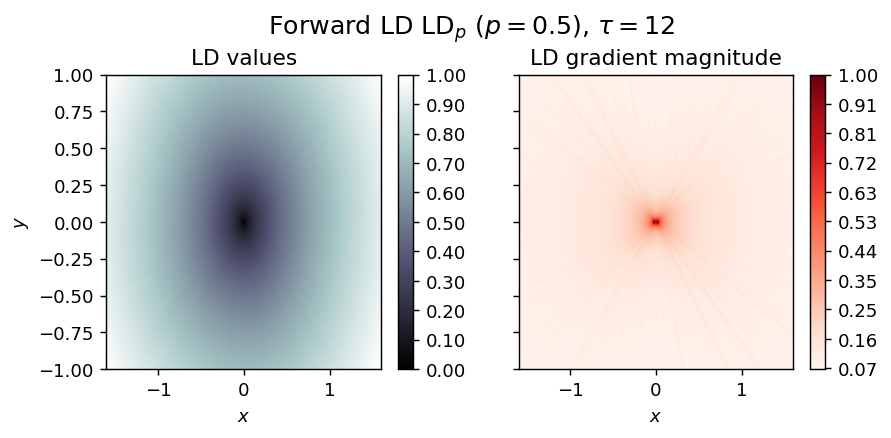

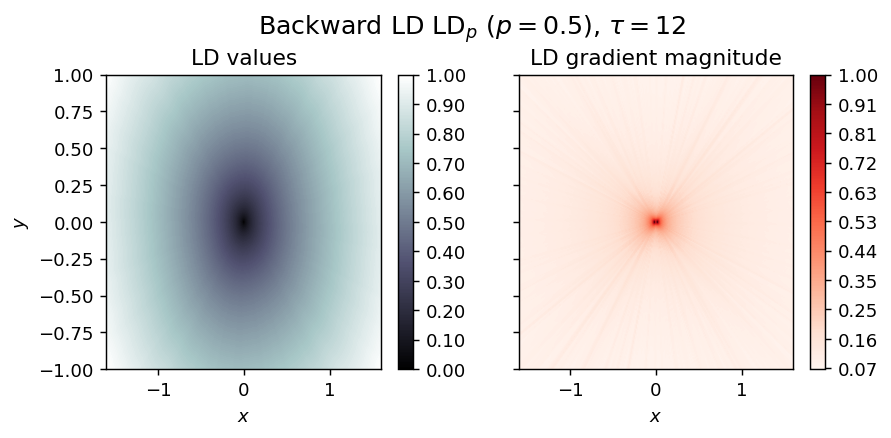

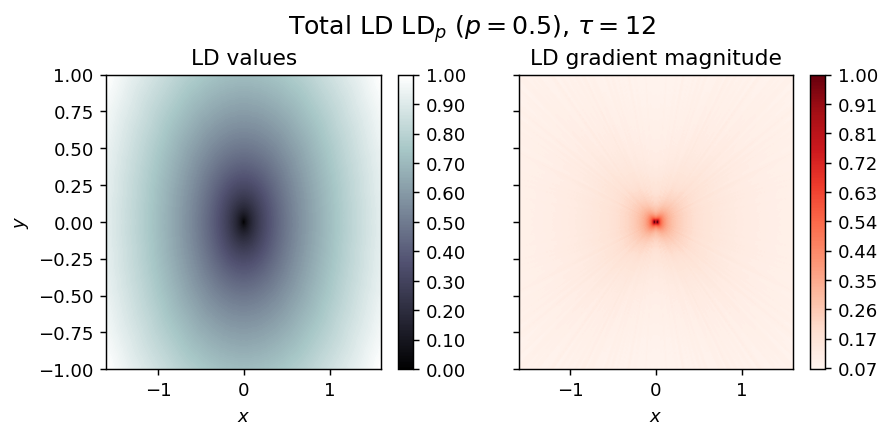

In [4]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value)
draw_lagrangian_descriptor(LD_forward, 'forward', grid_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value)
draw_lagrangian_descriptor(LD_backward, 'backward', grid_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', grid_parameters, tau, p_value)

### Hamilton Saddle

In [13]:
# Integration parameters
tau = 12

# LDp, p-value
p_value = 0.5

# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

In [14]:
grid_parameters = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
vector_field = HamSaddle1D

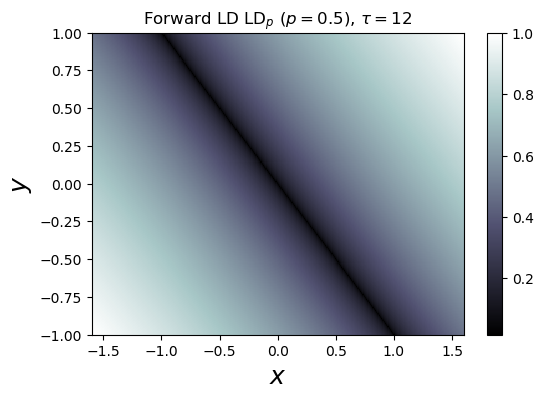

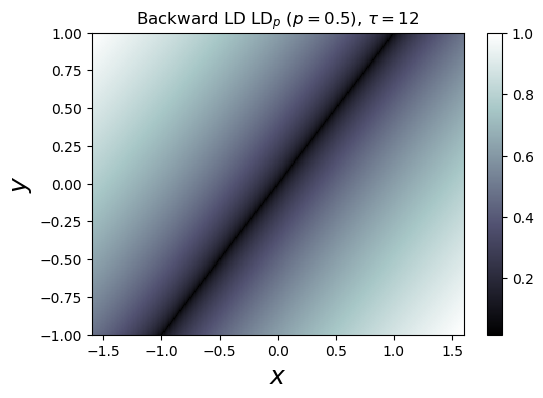

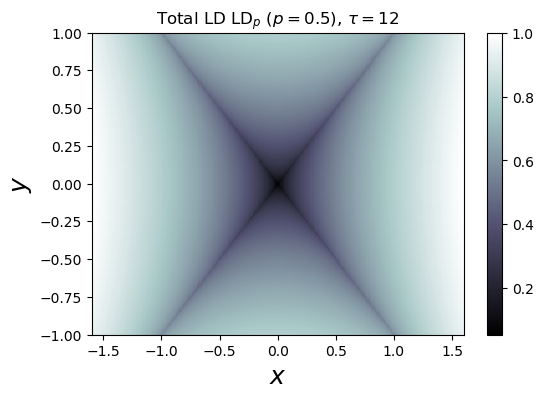

In [15]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value)
draw_lagrangian_descriptor(LD_forward, 'forward', grid_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value)
draw_lagrangian_descriptor(LD_backward, 'backward', grid_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', grid_parameters, tau, p_value)

### Harmonically perturbed Duffing oscillator

In [16]:
# Integration parameters
tau = 12

# LDp, p-value
p_value = 0.5

# Mesh parameters
x_min,x_max = [-1.6, 1.6]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

In [17]:
grid_parameters = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
vector_field_original = Duffing1D
vector_field = perturb_field(vector_field_original, forcing)

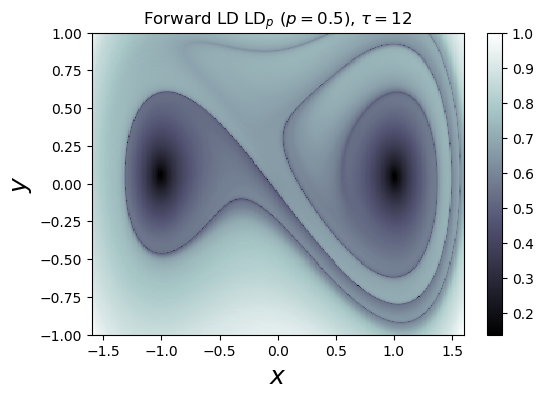

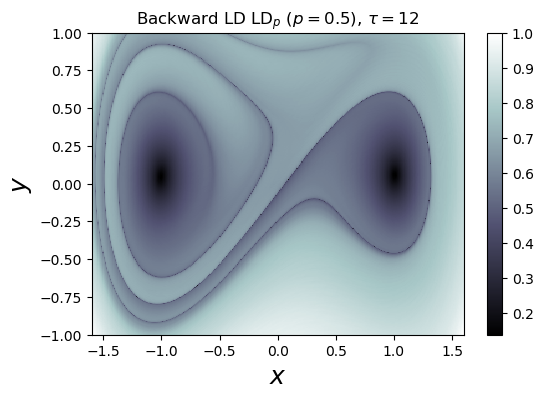

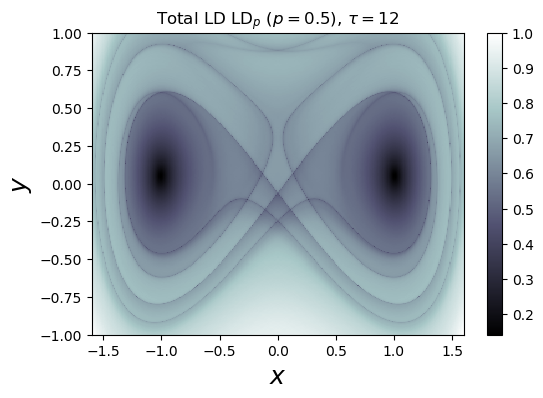

In [18]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value)
draw_lagrangian_descriptor(LD_forward, 'forward', grid_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value)
draw_lagrangian_descriptor(LD_backward, 'backward', grid_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', grid_parameters, tau, p_value)

### Hamilton Saddle-Node

In [19]:
# Integration parameters
t0 = 0
tau = 8
dt = 0.1

# Lp-norm, p-value
p_norm = 1/2

# Mesh parameters
x_min,x_max = [-1.5, 1]
y_min,y_max = [-1, 1]
Nx, Ny = [300, 300]

# Box boundaries for Variable Time Integration
box_x_min, box_x_max = [-6, 6]

In [20]:
grid_parameters = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
vector_field = HamSN1D
box_boundaries = [(box_x_min, box_x_max)]

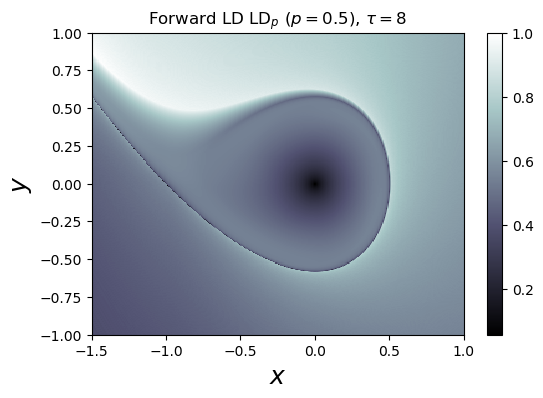

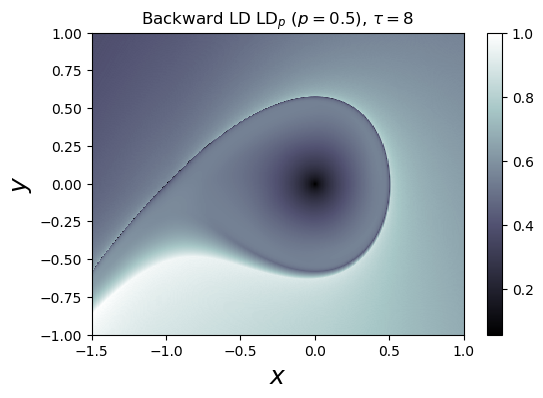

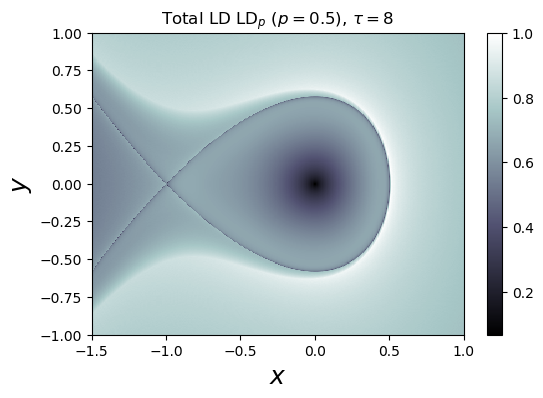

In [21]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_forward, 'forward', grid_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_backward, 'backward', grid_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', grid_parameters, tau, p_value, box_boundaries)

### Inverted Duffing oscillator

In [22]:
# Integration parameters
t0 = 0
tau = 10
dt = 0.1

# Lp-norm, p-value
p_norm = 1/2

# Mesh parameters
x_min,x_max = [-1.5, 1.5]
y_min,y_max = [-1, 1]
Nx, Ny = [400, 400]

# Box boundaries for Variable Time Integration
box_x_min, box_x_max = [-6, 6]

In [23]:
grid_parameters = [(x_min, x_max, Nx), (y_min, y_max, Ny)]
vector_field = Duffing1D_inverted
box_boundaries = [(box_x_min, box_x_max)]

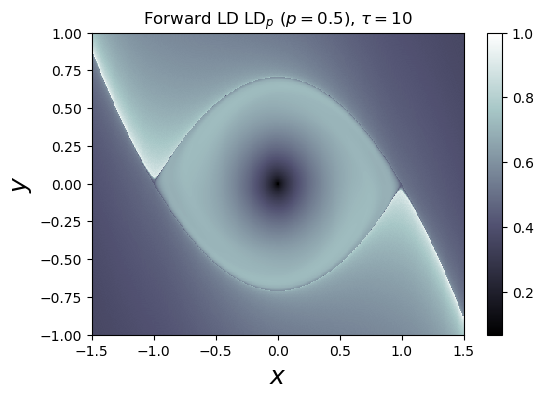

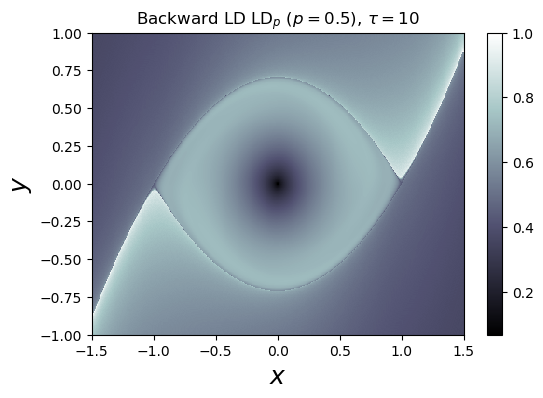

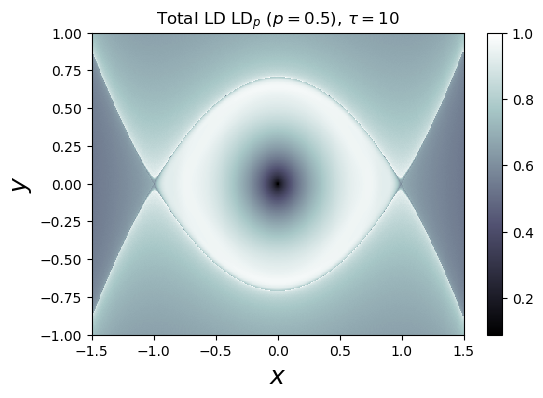

In [24]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_forward, 'forward', grid_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_backward, 'backward', grid_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', grid_parameters, tau, p_value, box_boundaries)

### Henon Heiles (2DoF system)

In [5]:
# Integration parameters
t0 = 0
tau = 50

# Lp-norm, p-value
p_value = 1/2

# Mesh visualisation slice parameters
H0 = 1/6 # Energy
ax1_min,ax1_max = [-0.45, 0.55]
ax2_min,ax2_max = [-0.45, 0.45]
N1, N2 = [300, 300]

# Box escape condition
box_boundaries = [[-5, 5], [-5, 5]]

# Miscellaneous grid parameters
dof_fixed = [1,0,0,0] # Variable ordering (x1 x2 y1 y2)
dof_fixed_values = [0] # This can also be an array of values
dof_slice = [0,1,0,1] # Visualisation slice
momentum_sign = 1 # Direction of momentum that defines the slice - (1) positive / (-1) negative

In [6]:
potential_energy = HenonHeiles_potential
vector_field = HenonHeiles_vector_field

slice_parameters = [[ax1_min, ax1_max, N1],[ax2_min, ax2_max, N2]]

grid_parameters = {
        'slice_parameters' : slice_parameters,
        'dof_slice' : dof_slice,
        'dof_fixed' : [dof_fixed, dof_fixed_values],
        'momentum_sign' : momentum_sign,
        'potential_energy': potential_energy,
        'energy_level': H0
    }

/Users/ba13026/research/lds/pylds/base.py:22: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(2*(H0 - V) - (phase_space_momenta**2).sum(axis=1))


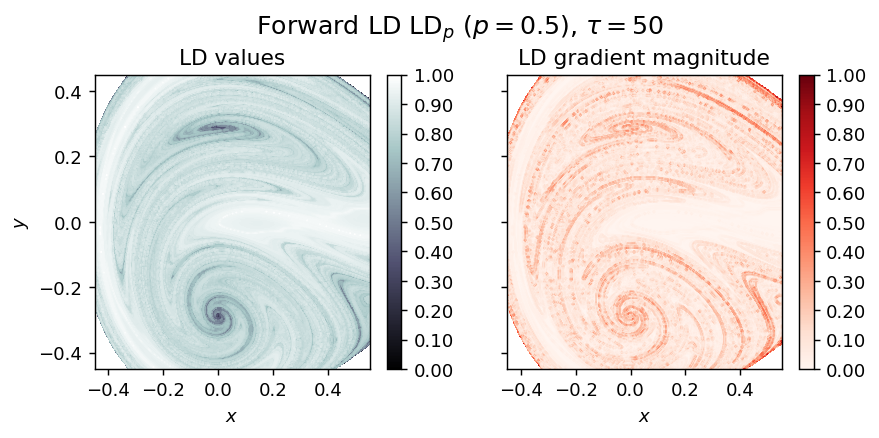

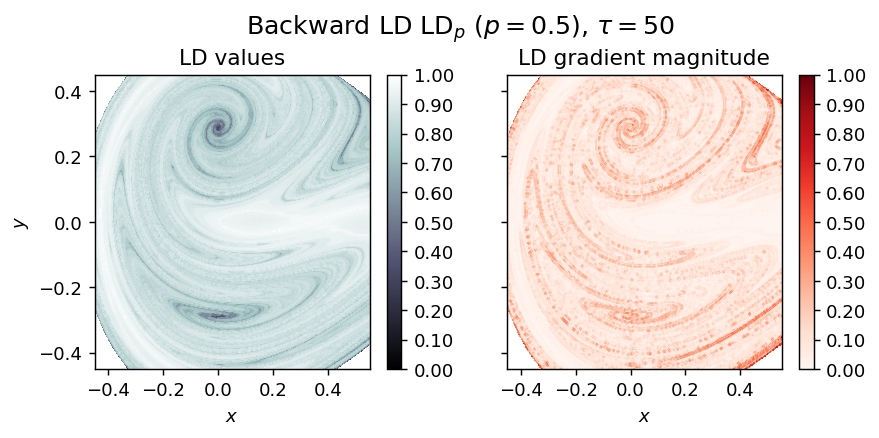

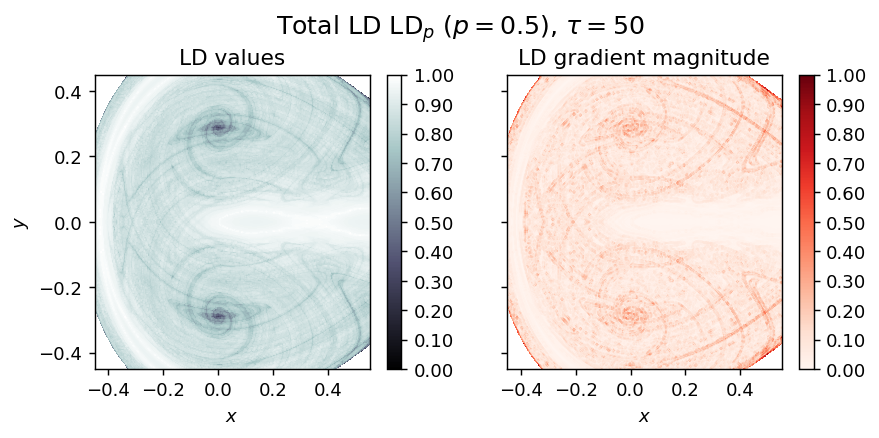

In [7]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_forward, 'forward', slice_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value, box_boundaries)
draw_lagrangian_descriptor(LD_backward, 'backward', slice_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', slice_parameters, tau, p_value)

### Index-1 Normal Form Saddle 

In [3]:
# Integration parameters
t0 = 0
tau = 10

# Lp-norm, p-value
p_value = 1/2

# Mesh visualisation slice parameters
H0 = 1 # Energy
ax1_min,ax1_max = [-1, 1]
ax2_min,ax2_max = [-1, 1]
N1, N2 = [300, 300]

# Box escape condition
box_boundaries = False

# Miscellaneous grid parameters
dof_fixed = [0,1,0,0] # Variable ordering (x1 x2 y1 y2)
dof_fixed_values = [0] # This can also be an array of values
dof_slice = [1,0,1,0] # Visualisation slice
momentum_sign = 1 # Direction of momentum that defines the slice - (1) positive / (-1) negative

In [4]:
potential_energy = NFSaddle_potential
vector_field = NFSaddle_vector_field

slice_parameters = [[ax1_min, ax1_max, N1],[ax2_min, ax2_max, N2]]

grid_parameters = {
        'slice_parameters' : slice_parameters,
        'dof_slice' : dof_slice,
        'dof_fixed' : [dof_fixed, dof_fixed_values],
        'momentum_sign' : momentum_sign,
        'potential_energy': potential_energy,
        'energy_level': H0
    }

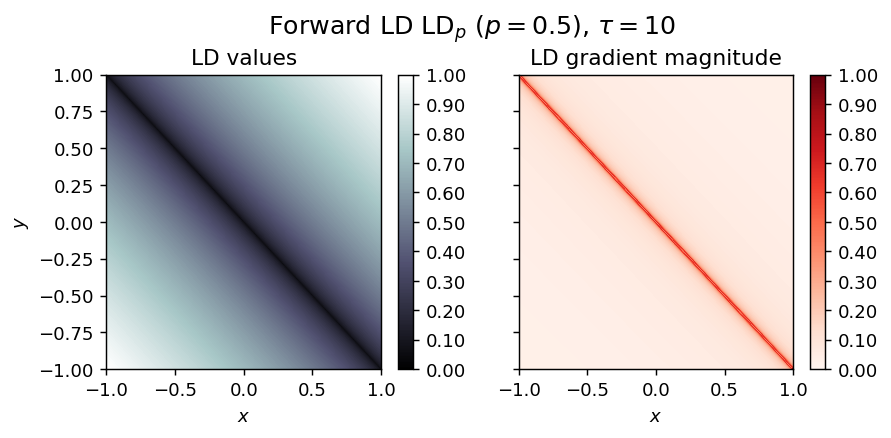

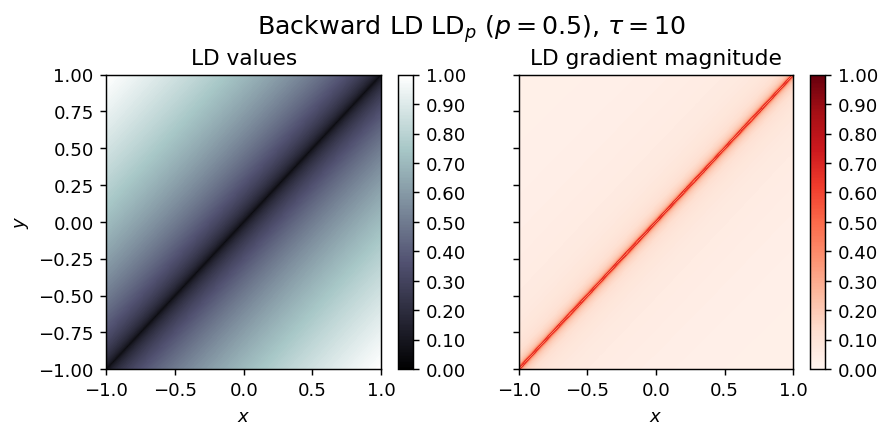

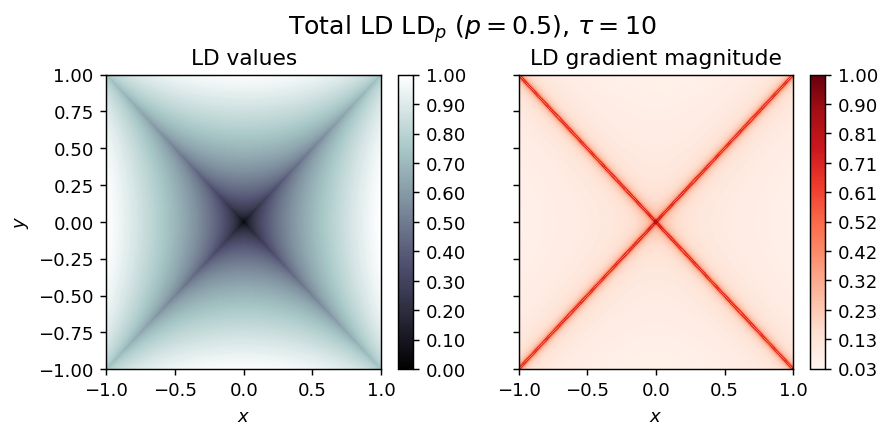

In [5]:
LD_forward = compute_lagrangian_descriptor(grid_parameters, vector_field, tau, p_value)
draw_lagrangian_descriptor(LD_forward, 'forward', slice_parameters, tau, p_value)

LD_backward = compute_lagrangian_descriptor(grid_parameters, vector_field, -tau, p_value)
draw_lagrangian_descriptor(LD_backward, 'backward', slice_parameters, tau, p_value)

LD_total = LD_forward + LD_backward
draw_lagrangian_descriptor(LD_total, 'total', slice_parameters, tau, p_value)

# APPENDIX

## Plot 2D potential

In [17]:
import numpy as np

Nx = 3500
Ny = 3500
x = np.linspace(-1.5, 1.5, Nx)
y = np.linspace(-1.5, 1.5, Nx)
X, Y = np.meshgrid(x,y)
points = np.transpose([X.flatten(), Y.flatten()])

In [18]:
potential_values = PES_HenonHeilles(points)
V = potential_values.reshape((Nx,Ny))

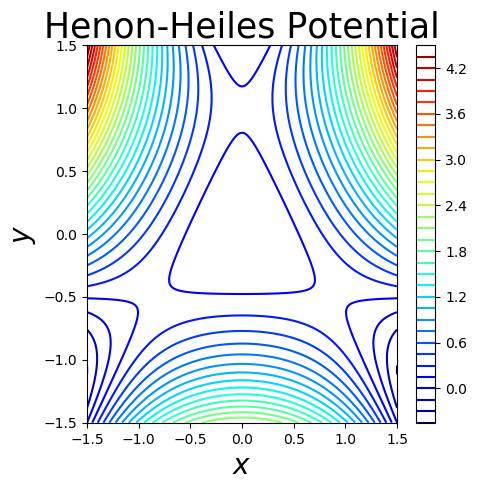

In [12]:
# Plot vector field
fig,ax = plt.subplots(1,1,figsize=(5,5),dpi=100)

ax.set_title('Henon-Heiles Potential', fontsize=25)
ax.set_xlabel('$x$', fontsize=20)
ax.set_ylabel('$y$', fontsize=20)
c = ax.contour(X,Y,V,40,cmap='jet')

ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
plt.colorbar(c)

plt.show()

## Create full list of requirements

```bash
!pip freeze > requeriments.txt
```

This will create a full list of 1) package names and 2) their exact versions installed in your environment.

You may want to shorten this list to avoid users installing unnecessary packages.

__NOTE__ It is important to keep in mind that portability across different _Operating Systems_ is not guaranteed. This means that exact package versions for some libraries may not be able to be installed in both Windows or Linux, for instance. This has several technical reasons.

## Install list of requirements with `conda`

First, make sure to use `pip` within the `conda` environment.

So, do as shown below.

```bash
# FIRST
conda install pip
# SECOND
pip install -r requeriments.txt
```

SOURCE: http://datumorphism.com/til/programming/python/python-anaconda-install-requirements/

## Adding docstrings

MAN SOURCES

* General Overview to docstrings in Python
https://www.datacamp.com/community/tutorials/docstrings-python

* Numpy/SciPy docstrings style guideline with some examples
https://numpydoc.readthedocs.io/en/latest/format.html 

* Exmaple of implementation: Naik's code
https://uposham.readthedocs.io/en/latest/_modules/differential_correction.html#clean_up_matrix

FOR THE FUTURE
* How to get started with Sphinx

https://docs.readthedocs.io/en/stable/intro/getting-started-with-sphinx.html